In [1]:
# pip install torchdiffeq==0.2.4

In [2]:
# pip install cvxpylayers==0.1.6

In [3]:
# pip install diffcp==1.0.23

In [4]:
# pip install gurobipy==11.0.3

In [132]:
PLOT_PATH = "plots/"
WEIGHTS_PATH = "weights/"
RESULTS_PATH = "results/"

# Synthetic data

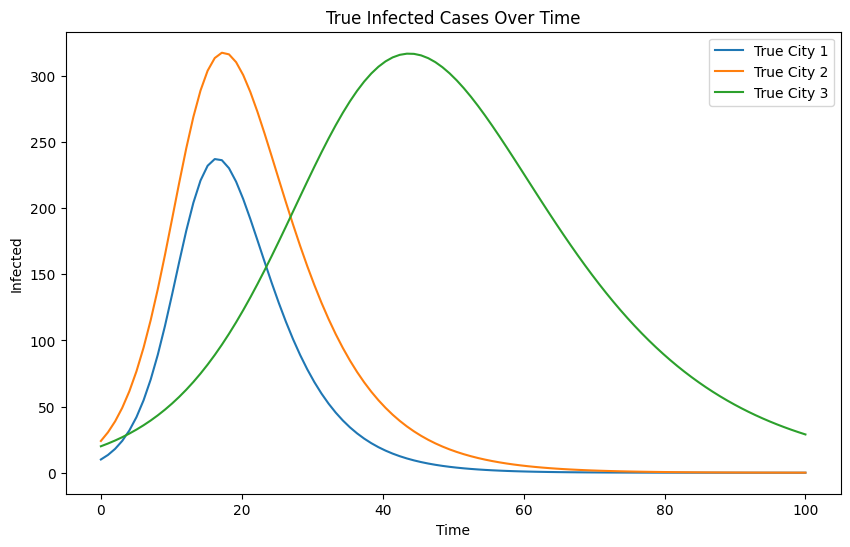

In [6]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchdiffeq import odeint
import cvxpy as cp
from cvxpylayers.torch import CvxpyLayer
import gurobipy as gp
from gurobipy import GRB

seed = 0
# Set random seed for reproducibility
torch.manual_seed(seed)
np.random.seed(seed)

# Parameters
num_cities = 3
time_points = torch.linspace(0, 100, 100)

# Total households (population) for each city
total_households = torch.tensor([1000, 1200,2000], dtype=torch.float32)

# Initial conditions
initial_infected = total_households * torch.tensor([0.01, 0.02, 0.01], dtype=torch.float32)  # Different initial infections
initial_recovered = torch.zeros(num_cities)
initial_susceptible = total_households - initial_infected - initial_recovered

initial_conditions = torch.stack([initial_susceptible, initial_infected, initial_recovered], dim=1)

# Beta and gamma parameters for each city
# gamma_true = 0.1  # Recovery rate, same for both cities
beta_cities = torch.tensor([0.5, 0.4,  0.2], dtype=torch.float32)  # Different beta for each city
gamma_cities = torch.tensor([0.2, 0.15, 0.1], dtype=torch.float32)  # Different gamma for each city

# Step 1: Simulate SIR outage data for two cities, not based on wind but allowing their beta differ
class TrueSIRModel(torch.nn.Module):
    def __init__(self, beta_cities, gamma_cities):
        super(TrueSIRModel, self).__init__()
        self.beta_cities = beta_cities  # tensor of shape (num_cities,)
        self.gamma_cities = gamma_cities

    def forward(self, t, y):
        S = y[:, 0]
        I = y[:, 1]
        R = y[:, 2]
        beta = self.beta_cities  # beta is a tensor of shape (num_cities,)
        gamma = self.gamma_cities  # beta is a tensor of shape (num_cities,)
        N = total_households
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        return torch.stack([dSdt, dIdt, dRdt], dim=1)

# Simulate the true outbreaks
true_sir_model = TrueSIRModel(beta_cities, gamma_cities)
with torch.no_grad():
    synthetic_outages = odeint(true_sir_model, initial_conditions, time_points)

# Plot the true infected cases over time for each city
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), synthetic_outages[:, city, 1].numpy(), label=f"True City {city+1}")
plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("True Infected Cases Over Time")
plt.show()

In [7]:
def add_noise_to_synthetic_outages(synthetic_outages, total_households):
    """
    Adds random noise to S and I components of synthetic_outages, recomputes R, ensures S + I + R = N,
    and that S, I, R are within [0, N].

    Args:
        synthetic_outages (torch.tensor): The original synthetic outages. Shape: (len(time_points), num_cities, 3)
        total_households (torch.tensor): Total households for each city. Shape: (num_cities,)

    Returns:
        torch.tensor: The noisy synthetic outages with the same shape.
    """
    noisy_outages = synthetic_outages.clone()
    num_time_points, num_cities, _ = synthetic_outages.shape
    std_dev = 0.05  # Standard deviation for noise

    for city in range(num_cities):
        S = synthetic_outages[:, city, 0]
        I = synthetic_outages[:, city, 1]
        N = total_households[city]

        # Add noise to S and I
        noise_S = torch.randn_like(S) * std_dev * S
        noise_I = torch.randn_like(I) * std_dev * I

        S_noisy = S + noise_S
        I_noisy = I + noise_I

        # Ensure S_noisy and I_noisy are within [0, N]
        S_noisy = torch.clamp(S_noisy, min=0.0, max=N.item())
        I_noisy = torch.clamp(I_noisy, min=0.0, max=N.item())

        # Recompute R
        R_noisy = N - S_noisy - I_noisy

        # Ensure R_noisy is within [0, N]
        R_noisy = torch.clamp(R_noisy, min=0.0, max=N.item())

        # Update noisy_outages
        noisy_outages[:, city, 0] = S_noisy
        noisy_outages[:, city, 1] = I_noisy
        noisy_outages[:, city, 2] = R_noisy

    return noisy_outages

# Add noise to the synthetic outages
synthetic_outages_noisy = add_noise_to_synthetic_outages(synthetic_outages, total_households)


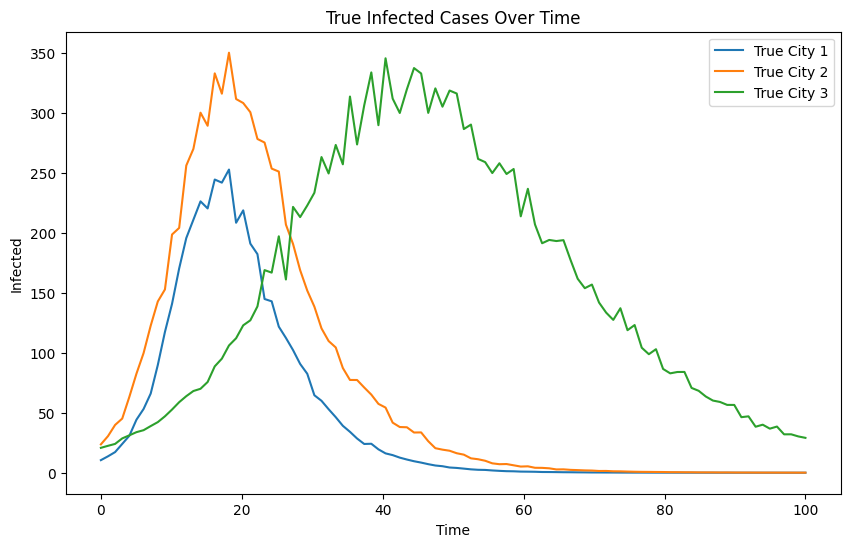

In [8]:
# Plot the true infected cases over time for each city
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), synthetic_outages_noisy[:, city, 1].numpy(), label=f"True City {city+1}")
plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("True Infected Cases Over Time")
plt.show()

In [9]:
def plot_true_infected(time_points, synthetic_outages, customer_tensor, city_indices, title, save_path = ""):
    """
    Plots the true infected cases over time for each city, including SAIDI in the legend,
    and adds a light blue shaded area under the curve.

    Args:
        time_points (torch.tensor): Time points used in simulation.
        synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
        customer_tensor (torch.tensor): Total customers for each city. Shape: (num_cities,)
        city_indices (list): List of city indices to plot.
        title (str): Title of the plot.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    for city in city_indices:
        # Extract true infected cases for the city
        outage_true = synthetic_outages[:, city, 1].numpy()
        time = time_points.numpy()
        customer = customer_tensor[city].item()

        # Calculate SAIDI for the city
        saidi_true = np.sum(outage_true) / customer

        # Create the plot
        plt.figure(figsize=(8, 6))
        plt.plot(
            time,
            outage_true,
            label=f"Actual Outage (SAIDI: {saidi_true:.1f})",
            linewidth=6,
            color='tab:blue'
        )
        # Add a light touch of blue under the plotted curve
        plt.fill_between(
            time,
            outage_true,
            color='lightblue',
            alpha=0.2
        )
        plt.xlabel("Time", fontsize=18)
        plt.ylabel("No. Outage Households", fontsize=18)
        # Set legend location to upper right
        plt.legend(fontsize=18, loc='upper right')
        # Remove the plot title (since you will add it in LaTeX)
        plt.title(f"{title} - City {city+1}")

        # Adjust font sizes for ticks
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)

        # Add lighter grid lines
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey', alpha=0.5)

        # Tight layout to minimize white space
        plt.tight_layout()

        # Save the plot to a PDF file (optional)
        # filename = f"city_{city+1}_true_infected.pdf"
        filename = save_path + f"city_{city+1}_true_infected.pdf"
        plt.savefig(filename, format='pdf', dpi=300, bbox_inches='tight')
        print(f"Plot saved to {filename}")

        # Show the plot
        plt.show()

        # Close the figure to free memory
        plt.close()


In [10]:
# Comprehensive SIR Model Training using odeint
# This cell provides multiple training options for the SIR model

def train_sir_model_mse(wind_sir_model, initial_conditions, time_points, target_data, 
                        num_epochs=2000, learning_rate=0.01, save_model=True, model_name="sir_model_mse"):
    """
    Train SIR model using MSE loss between predicted and target data.
    
    Args:
        wind_sir_model: The WindSIRModel instance to train
        initial_conditions: Initial SIR conditions (S, I, R) for each city
        time_points: Time points for ODE integration
        target_data: Target SIR data to fit against
        num_epochs: Number of training epochs
        learning_rate: Learning rate for optimizer
        save_model: Whether to save the trained model
        model_name: Name for saving the model
    
    Returns:
        tuple: (trained_model, loss_history)
    """
    print(f"Starting MSE training for {num_epochs} epochs...")
    
    # Set up optimizer and loss function
    optimizer = torch.optim.Adam(wind_sir_model.parameters(), lr=learning_rate)
    loss_fn = torch.nn.MSELoss()
    
    # Training history
    loss_history = []
    
    # Training loop
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        
        # Forward pass: solve ODE
        pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
        
        # Compute loss
        loss = loss_fn(pred_outages, target_data)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Record loss
        loss_history.append(loss.item())
        
        # Print progress
        if (epoch + 1) % (num_epochs // 10) == 0:
            print(f"MSE Training - Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.6f}")
    
    # Save model if requested
    if save_model:
        model_save_path = f'{model_name}_epochs_{num_epochs}.pth'
        torch.save(wind_sir_model.state_dict(), model_save_path)
        print(f"Model saved to {model_save_path}")
    
    print("MSE training completed!")
    return wind_sir_model, loss_history

def train_sir_model_dfl(wind_sir_model, initial_conditions, time_points, target_data,
                       gdp_cvxpy_layer, tau, N_g, transport_cost_per_gen, gamma, G_initial,
                       num_cities, outage_duration, Y_true, lambda_mse=1.0,
                       num_epochs=200, learning_rate=0.01, save_model=True, model_name="sir_model_dfl"):
    """
    Train SIR model using Differentiable Federated Learning (DFL) approach.
    Combines economic optimization with MSE loss.
    
    Args:
        wind_sir_model: The WindSIRModel instance to train
        initial_conditions: Initial SIR conditions (S, I, R) for each city
        time_points: Time points for ODE integration
        target_data: Target SIR data to fit against
        gdp_cvxpy_layer: CVXPY layer for economic optimization
        tau, N_g, transport_cost_per_gen, gamma, G_initial: Economic parameters
        num_cities: Number of cities
        outage_duration: Duration of outage simulation
        Y_true: True demand values
        lambda_mse: Weight for MSE loss component
        num_epochs: Number of training epochs
        learning_rate: Learning rate for optimizer
        save_model: Whether to save the trained model
        model_name: Name for saving the model
    
    Returns:
        tuple: (trained_model, cost_history, mse_history)
    """
    print(f"Starting DFL training for {num_epochs} epochs...")
    
    # Set up optimizer and loss function
    optimizer = torch.optim.Adam(wind_sir_model.parameters(), lr=learning_rate)
    loss_fn = torch.nn.MSELoss()
    
    # Training history
    total_costs = []
    economic_costs = []
    transportation_costs = []
    operational_costs = []
    mse_history = []
    
    # Training loop
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        
        # Forward pass: solve ODE
        pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
        pred_outages = pred_outages.float()  # Ensure proper dtype
        
        # Pass predicted outages to CVXPY layer
        x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(pred_outages[:, :, 1])
        
        # Compute economic costs
        economic_cost = tau * torch.sum(torch.relu(Y_true - N_g * q_opt))
        transportation_cost = transport_cost_per_gen * torch.sum(x_to_opt + x_back_opt)
        operational_cost = gamma * torch.sum(s_w_opt)
        
        # Total economic cost
        total_cost = economic_cost + transportation_cost + operational_cost
        
        # MSE loss component
        mse_error = loss_fn(pred_outages, target_data)
        
        # Combined loss
        loss = total_cost + lambda_mse * mse_error
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Record history
        total_costs.append(total_cost.item())
        economic_costs.append(economic_cost.item())
        transportation_costs.append(transportation_cost.item())
        operational_costs.append(operational_cost.item())
        mse_history.append(mse_error.item())
        
        # Print progress
        if epoch % 10 == 0:
            print(f"Epoch {epoch}, Total Cost: {total_cost.item():.2f}, "
                  f"Economic: {economic_cost.item():.2f}, "
                  f"Transport: {transportation_cost.item():.2f}, "
                  f"Operational: {operational_cost.item():.2f}, "
                  f"MSE: {mse_error.item():.4f}")
    
    # Save model if requested
    if save_model:
        model_save_path = f'{model_name}_epochs_{num_epochs}.pth'
        torch.save(wind_sir_model.state_dict(), model_save_path)
        print(f"Model saved to {model_save_path}")
    
    print("DFL training completed!")
    return wind_sir_model, (total_costs, economic_costs, transportation_costs, operational_costs), mse_history

def plot_training_history(loss_history, title="Training Loss", save_plot=False, filename="training_loss.png"):
    """Plot training loss history."""
    plt.figure(figsize=(10, 6))
    plt.plot(loss_history)
    plt.title(title)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True, alpha=0.3)
    
    if save_plot:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Plot saved as {filename}")
    
    plt.show()

def plot_dfl_training_history(cost_history, mse_history, save_plot=False, filename_prefix="dfl_training"):
    """Plot DFL training history including costs and MSE."""
    total_costs, economic_costs, transportation_costs, operational_costs = cost_history
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot costs
    ax1.plot(total_costs, label='Total Cost', linewidth=2)
    ax1.plot(economic_costs, label='Economic Cost', alpha=0.7)
    ax1.plot(transportation_costs, label='Transportation Cost', alpha=0.7)
    ax1.plot(operational_costs, label='Operational Cost', alpha=0.7)
    ax1.set_title('DFL Training Costs')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Cost')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot MSE
    ax2.plot(mse_history, color='red', linewidth=2)
    ax2.set_title('MSE Loss During Training')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('MSE Loss')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_plot:
        plt.savefig(f"{filename_prefix}_history.png", dpi=300, bbox_inches='tight')
        print(f"Plot saved as {filename_prefix}_history.png")
    
    plt.show()

def load_trained_model(model_path, wind_sir_model):
    """Load a trained model from file."""
    try:
        wind_sir_model.load_state_dict(torch.load(model_path, weights_only=True))
        print(f"Model loaded from {model_path}")
        return True
    except FileNotFoundError:
        print(f"Model file {model_path} not found")
        return False
    except Exception as e:
        print(f"Error loading model: {e}")
        return False

# Example usage and training options
print("SIR Model Training Functions Defined!")
print("\nAvailable training methods:")
print("1. train_sir_model_mse() - Basic MSE training")
print("2. train_sir_model_dfl() - DFL training with economic optimization")
print("3. plot_training_history() - Plot training loss")
print("4. plot_dfl_training_history() - Plot DFL training costs and MSE")
print("5. load_trained_model() - Load pre-trained model")


SIR Model Training Functions Defined!

Available training methods:
1. train_sir_model_mse() - Basic MSE training
2. train_sir_model_dfl() - DFL training with economic optimization
3. plot_training_history() - Plot training loss
4. plot_dfl_training_history() - Plot DFL training costs and MSE
5. load_trained_model() - Load pre-trained model


Plot saved to plots/city_1_true_infected.pdf


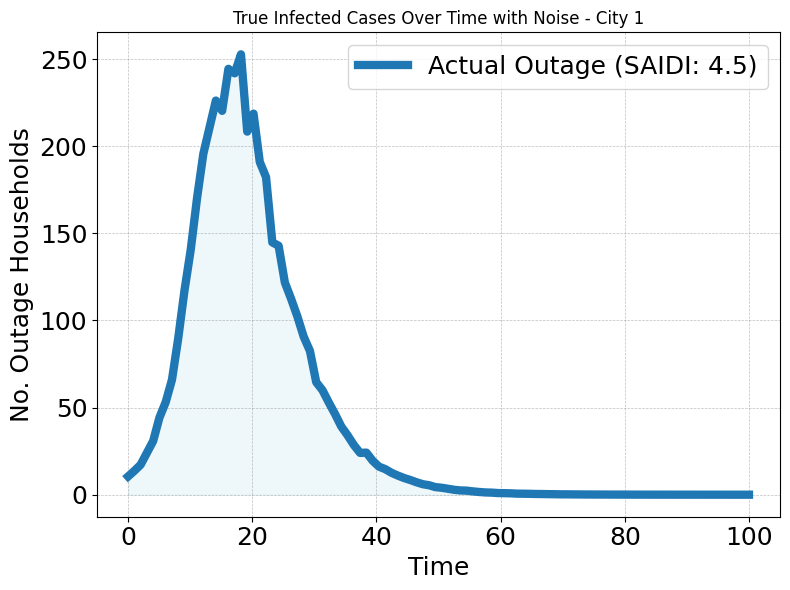

Plot saved to plots/city_2_true_infected.pdf


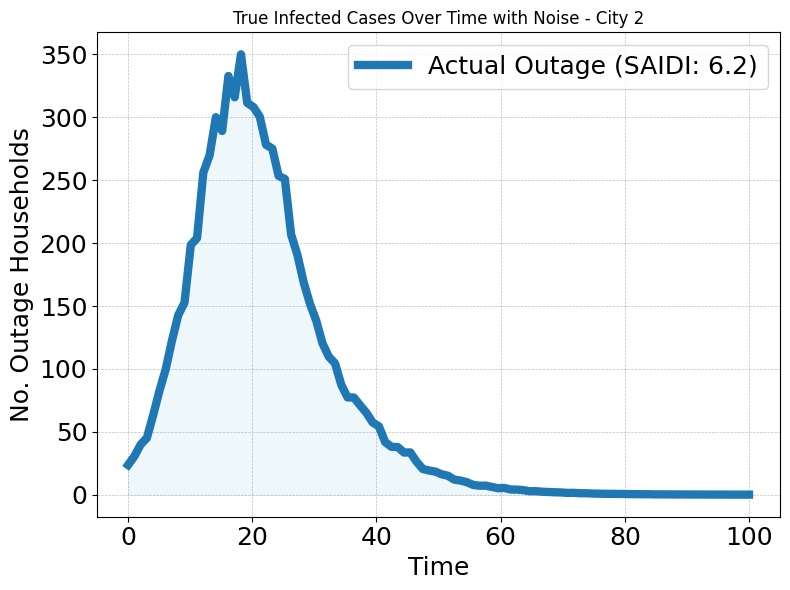

Plot saved to plots/city_3_true_infected.pdf


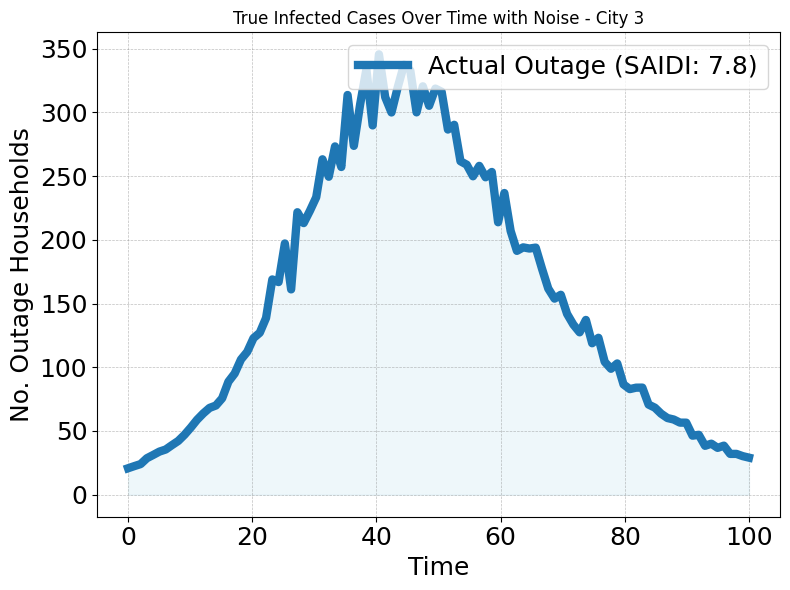

In [11]:
# Plot the true infected cases over time for each city using the function
customer_tensor = total_households  # Total customers for each city
plot_true_infected(time_points, synthetic_outages_noisy, customer_tensor, city_indices=range(num_cities), title="True Infected Cases Over Time with Noise", save_path = PLOT_PATH)


## synthetic test set

In [12]:
test_initial_infected = total_households * torch.tensor([0.015, 0.03, 0.02], dtype=torch.float32)  # Different from training
test_initial_recovered = torch.zeros(num_cities)
test_initial_susceptible = total_households - test_initial_infected - test_initial_recovered
test_initial_conditions = torch.stack([test_initial_susceptible, test_initial_infected, test_initial_recovered], dim=1)

In [13]:
test_beta_cities = torch.tensor([0.45, 0.35, 0.25], dtype=torch.float32)  # Slightly different beta
test_gamma_cities = torch.tensor([0.18, 0.14, 0.12], dtype=torch.float32)  # Slightly different gamma

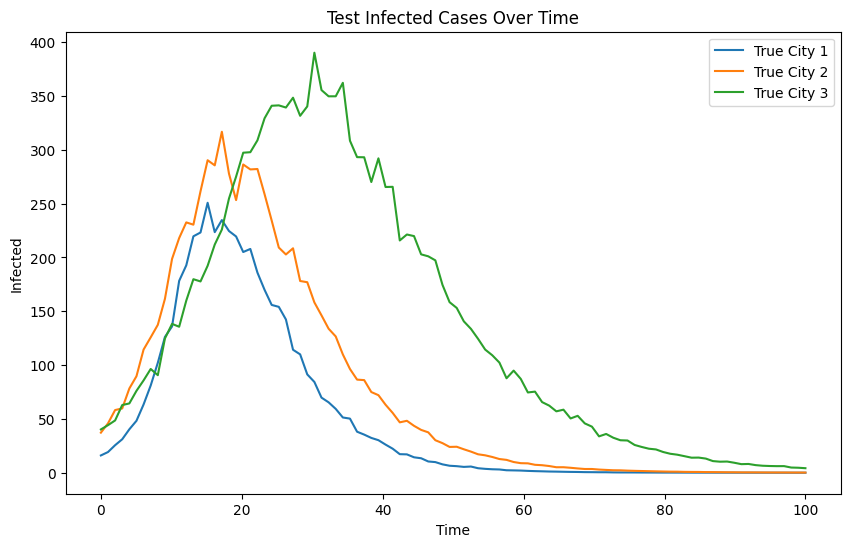

Plot saved to plots/city_1_true_infected.pdf


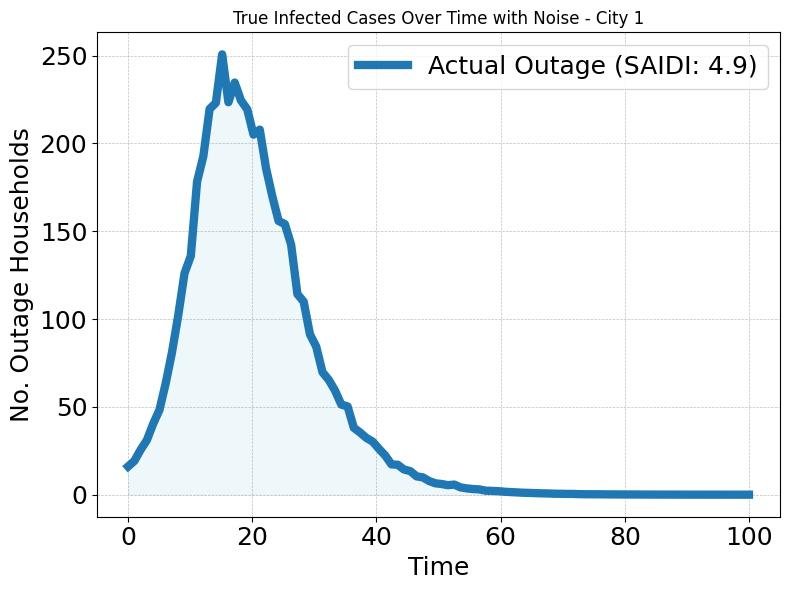

Plot saved to plots/city_2_true_infected.pdf


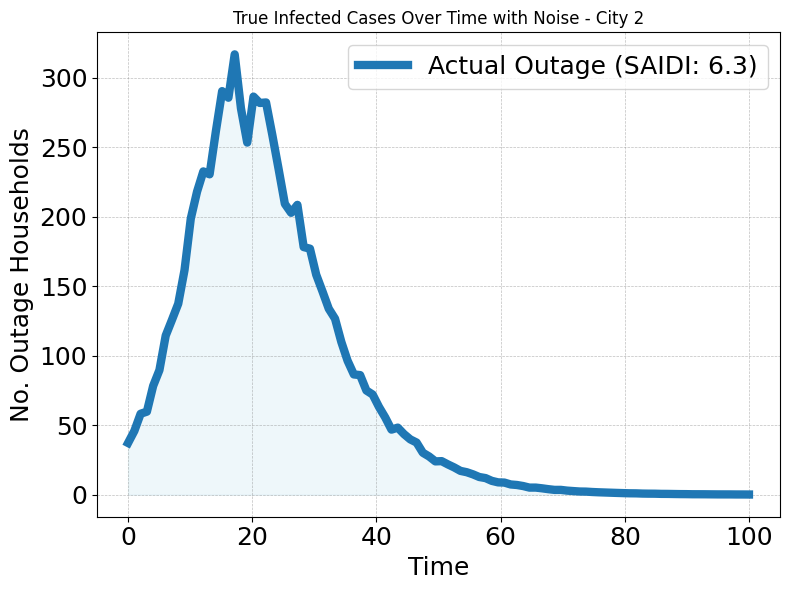

Plot saved to plots/city_3_true_infected.pdf


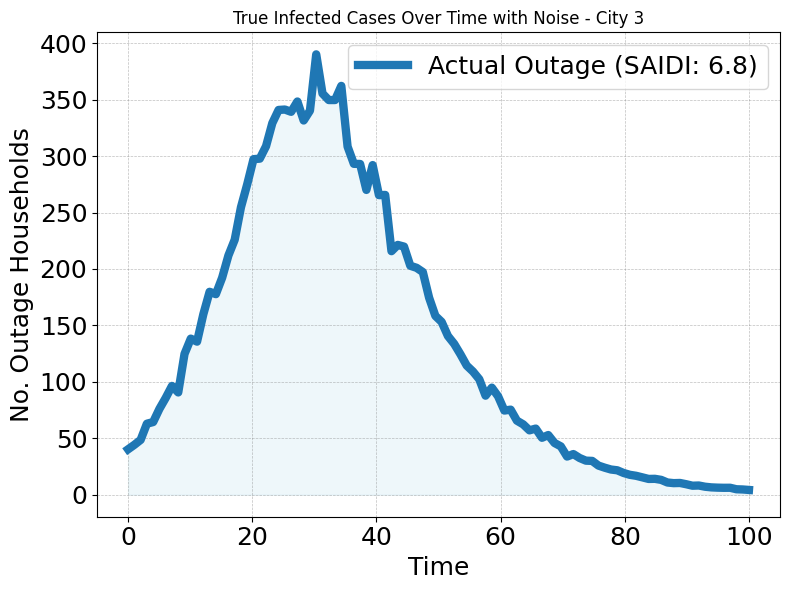

In [14]:
test_sir_model = TrueSIRModel(test_beta_cities, test_gamma_cities)
with torch.no_grad():
    test_synthetic_outages = odeint(test_sir_model, test_initial_conditions, time_points)
test_synthetic_outages_noisy = add_noise_to_synthetic_outages(test_synthetic_outages, total_households)
# Plot the true infected cases over time for each city
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), test_synthetic_outages_noisy[:, city, 1].numpy(), label=f"True City {city+1}")
plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("Test Infected Cases Over Time")
plt.show()
# Plot the true infected cases over time for each city using the function
# customer_tensor = total_households  # Total customers for each city
plot_true_infected(time_points, test_synthetic_outages_noisy, customer_tensor, city_indices=range(num_cities), title="True Infected Cases Over Time with Noise", save_path = PLOT_PATH)

# Forecast model training

## SIR training

In [15]:
# Step 2: Run a SIR model with wind input to predict the outage, using MSE error for both cities
# Generate wind speed data for each city
def generate_wind_speed(time_points, num_cities):
    wind_speeds = []
    for city in range(num_cities):
        base_wind_speed = torch.tensor(10.0)
        amplitude = torch.tensor(5.0)
        frequency = torch.tensor(0.1)
        phase_shift = torch.tensor(city * np.pi / num_cities)
        wind_speed_city = base_wind_speed + amplitude * torch.sin(frequency * time_points + phase_shift)
        wind_speeds.append(wind_speed_city)
    wind_speeds = torch.stack(wind_speeds, dim=1)  # Shape: (len(time_points), num_cities)
    return wind_speeds

wind_speeds = generate_wind_speed(time_points, num_cities)

# Neural network that predicts beta and gamma from wind speed
class BetaGammaNN(torch.nn.Module):
    def __init__(self, input_size, hidden_size, num_cities):
        super(BetaGammaNN, self).__init__()
        self.fc1 = torch.nn.Linear(input_size, hidden_size)
        self.relu = torch.nn.ReLU()
        # Output beta and gamma for each city
        self.fc2 = torch.nn.Linear(hidden_size, num_cities * 2)  # Outputs beta and gamma for each city

    def forward(self, wind_speed_t):
        # wind_speed_t: tensor of shape (num_cities,)
        x = self.fc1(wind_speed_t)
        x = self.relu(x)
        x = self.fc2(x)
        beta_gamma = torch.nn.functional.softplus(x)  # Ensure beta and gamma are positive
        beta = beta_gamma[:num_cities]
        gamma = beta_gamma[num_cities:]
        return beta, gamma

# Define the SIR model with neural network for beta and gamma
class WindSIRModel(torch.nn.Module):
    def __init__(self, beta_gamma_nn, wind_speeds, time_points):
        super(WindSIRModel, self).__init__()
        self.beta_gamma_nn = beta_gamma_nn  # Neural network that predicts beta and gamma
        self.wind_speeds = wind_speeds  # Shape: (len(time_points), num_cities)
        self.time_points = time_points  # Shape: (len(time_points),)

    def interpolate_wind_speed(self, t):
        # Interpolate wind speed at time t for each city
        t_np = t.detach().cpu().numpy()
        time_points_np = self.time_points.detach().cpu().numpy()
        wind_speeds_np = self.wind_speeds.detach().cpu().numpy()
        wind_speed_t = np.array([
            np.interp(t_np, time_points_np, wind_speeds_np[:, city])
            for city in range(self.wind_speeds.shape[1])
        ])
        wind_speed_t = torch.tensor(wind_speed_t, dtype=torch.float32)
        return wind_speed_t  # Shape: (num_cities,)

    def forward(self, t, y):
        S = y[:, 0]
        I = y[:, 1]
        R = y[:, 2]
        wind_speed_t = self.interpolate_wind_speed(t)
        beta, gamma = self.beta_gamma_nn(wind_speed_t)
        N = total_households
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        return torch.stack([dSdt, dIdt, dRdt], dim=1)


In [16]:
# Initialize the neural network
input_size = num_cities  # Wind speed for each city
hidden_size = 16  # Can adjust as needed
beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# Initialize the WindSIRModel
wind_sir_model = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)

# Define optimizer and loss function
optimizer = torch.optim.Adam(beta_gamma_nn.parameters(), lr=0.01)
loss_fn = torch.nn.MSELoss()

In [17]:
# training = False
# if training:
#     # Training loop with MSE loss
#     num_epochs = 2000
#     for epoch in range(num_epochs):
#         optimizer.zero_grad()
#         pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
#         loss = loss_fn(pred_outages, synthetic_outages_noisy)
#         loss.backward()
#         optimizer.step()
#         if (epoch + 1) % (num_epochs//10) == 0:
#             print(f"MSE Training - Epoch [{epoch + 1}/{num_epochs}], MSE Loss: {loss.item():.4f}")
#     # Save the model parameters after MSE training
#     model_save_path = 'wind_sir_model_epochs_{}.pth'.format(num_epochs)
#     torch.save(wind_sir_model.state_dict(), model_save_path)
#     print(f"Model saved to {model_save_path}")
# else:
#     # model_save_path = './wind_sir_model_epochs_2000.pth'
#     model_save_path = './wind_sir_model_epochs_2000_seed_0.pth'
#     # model_save_path = './wind_sir_model_epochs_2000_seed_1.pth'

# Assumes pred_outages and synthetic_outages_noisy have shape [T, C, 3]
# where channel 1 is the city's outage (I_t)
outage_idx = 1  # the outage state/channel
training = False  # <-- flip this on to train
if training:
    beta_gamma_nn.train()
    num_epochs = 2000

    for epoch in range(num_epochs):
        optimizer.zero_grad()

        # Forward pass through ODE
        pred_outages = odeint(wind_sir_model, initial_conditions, time_points)  # [T, C, 3]

        # Slice to outage-only for loss: [T, C]
        pred_I = pred_outages[..., outage_idx]
        true_I = synthetic_outages_noisy[..., outage_idx]

        # (Optional) ensure matching dtype/device
        true_I = true_I.to(pred_I.device).type_as(pred_I)

        # MSE on outage only
        loss = loss_fn(pred_I, true_I)

        loss.backward()
        optimizer.step()

        if (epoch + 1) % (num_epochs // 10) == 0:
            print(f"I-only MSE - Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.6f}")
        

            # Save the model parameters after MSE-on-outage training
            # model_save_path = f"wind_sir_model_Ionly_epochs_{num_epochs}.pth"
            model_save_path = WEIGHTS_PATH + f"wind_sir_model_Ionly_epochs_{epoch}.pth"
            torch.save(wind_sir_model.state_dict(), model_save_path)
            print(f"Model saved to {model_save_path}")

else:
    # model_save_path = './wind_sir_model_epochs_2000.pth'
    model_save_path = WEIGHTS_PATH + 'wind_sir_model_epochs_2000_seed_0.pth'
    # model_save_path = './wind_sir_model_epochs_2000_seed_1.pth'


In [18]:
# To load the model parameters later
beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# Initialize the WindSIRModel
wind_sir_model = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
# Load the saved state dictionary into the model
wind_sir_model.load_state_dict(torch.load(model_save_path))
print("Model loaded from", model_save_path)

Model loaded from weights/wind_sir_model_epochs_2000_seed_0.pth


In [19]:
pred_outages = odeint(wind_sir_model, initial_conditions, time_points)

In [20]:
# # Pass the predicted outages to the CVXPY layer
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(pred_outages[:,:, 1])
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)


# # Compute costs
# economic_cost = tau * torch.sum(torch.relu(Y_true - N_g * q_opt))
# transportation_cost = transport_cost_per_gen * torch.sum(x_to_opt + x_back_opt)
# operational_cost = gamma * torch.sum(q_opt)
# total_cost = economic_cost + transportation_cost + operational_cost
# print(total_cost)

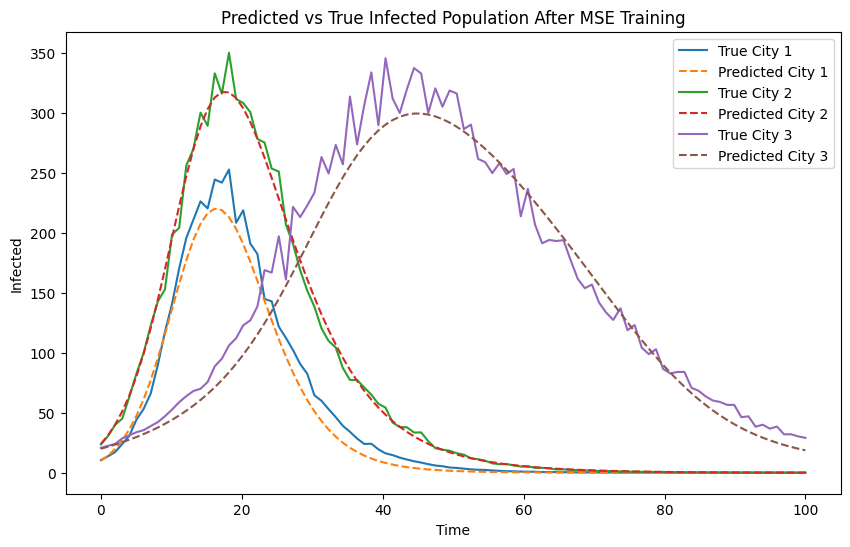

In [21]:
# Save the model parameters after MSE training
# mse_model_state_dict = beta_gamma_nn.state_dict()

# Plot predictions vs true data after MSE training
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), synthetic_outages_noisy[:, city, 1].numpy(), label=f"True City {city+1}")
    plt.plot(time_points.numpy(), pred_outages[:, city, 1].detach().numpy(), linestyle='--', label=f"Predicted City {city+1}")
plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("Predicted vs True Infected Population After MSE Training")
plt.show()

In [22]:
synthetic_outages_noisy.shape

torch.Size([100, 3, 3])

In [23]:
def plot_predictions(
    time_points, synthetic_outages, pred_outages, customer_tensor, city_indices, save_flag=True, filename_suffix="", align_y=True, save_path = ""
):
    """
    Plots the true and predicted outages for each city, highlighting areas where predictions overestimate or underestimate the actual outages.
    Saves each plot as a PDF file.

    Args:
        time_points (torch.tensor): Time points used in simulation.
        synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
        pred_outages (torch.tensor): Predicted outage data. Shape: (len(time_points), num_cities, 3)
        customer_tensor (torch.tensor): Total customers for each city. Shape: (num_cities,)
        city_indices (list): List of city indices to plot.
        save_flag (bool): Whether to save the plots. Defaults to True.
        filename_suffix (str): Suffix to append to the filename. Defaults to "".
        align_y (bool): Whether to align the y-axis across all plots. Defaults to True.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import torch

    # Determine the global maximum outage value across all cities if alignment is desired
    if align_y:
        outage_true_all = synthetic_outages[:, city_indices, 1]
        outage_pred_all = pred_outages[:, city_indices, 1]
        max_outage_true = torch.max(outage_true_all).item()
        max_outage_pred = torch.max(outage_pred_all).item()
        global_max = max(max_outage_true, max_outage_pred)
        y_max = global_max * 1.3  # Adding 10% padding for better visualization

    for idx, city in enumerate(city_indices):
        # Extract data for the city
        time = time_points.numpy()
        outage_true = synthetic_outages[:, city, 1].numpy()
        outage_pred = pred_outages[:, city, 1].detach().numpy()
        customer = customer_tensor[city].item()

        # Calculate SAIDI and MSE
        saidi_true = np.sum(outage_true) / customer
        saidi_pred = np.sum(outage_pred) / customer
        mse_value = np.mean((outage_pred - outage_true) ** 2)

        # Determine y-axis maximum for the current plot
        if not align_y:
            current_max = max(np.max(outage_true), np.max(outage_pred))
            y_max_current = current_max * 1.1  # Adding 10% padding
        else:
            y_max_current = y_max

        # Create the plot
        plt.figure(figsize=(10, 9))

        # Add a light touch of grey under the plotted curve
        plt.fill_between(
            time,
            outage_true,
            color="grey",
            alpha=0.2,
            label=f"Actual Outage (SAIDI: {saidi_true:.1f})",
        )

        # Plot the predicted outage
        plt.plot(
            time,
            outage_pred,
            label=f"MSE Model Pred.\n(SAIDI: {saidi_pred:.1f}, MSE: {mse_value:.1f})",
            linewidth=6,
            linestyle="--",
            color="tab:red",
        )

        # Set labels and ticks
        plt.xlabel("Time", fontsize=32)
        if idx == 0:
            plt.ylabel("# of Outages", fontsize=32)
            # Customize the y-ticks to show every 200 units
            y_ticks = np.arange(0, y_max_current + 1, 200)
            plt.yticks(y_ticks, fontsize=32)
        else:
            # Make y-axis label and ticks transparent for city 2 and 3
            plt.ylabel("# of Outages", fontsize=32, color="white", alpha=0)  # Transparent label
            y_ticks = np.arange(0, y_max_current + 1, 200)
            plt.yticks(y_ticks, fontsize=32, color="white", alpha=0)  # Transparent ticks

        # Keep the grid lines visible
        plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

        # Set y-axis limit
        plt.ylim(0, y_max_current)

        # Set legend location
        plt.legend(fontsize=32, loc="upper right", fancybox=False)

        # Adjust font sizes for x-axis ticks
        plt.xticks(fontsize=32)

        # Tight layout to minimize white space
        plt.tight_layout()

        if save_flag:
            # Save the plot to a PDF file with the custom suffix
            # filename = f"city_{city + 1}_{filename_suffix}.pdf"
            filename = save_path + f"city_{city + 1}_{filename_suffix}.pdf"
            plt.savefig(filename, format="pdf", dpi=300, bbox_inches="tight")
            print(f"Plot saved to {filename}")

        # Show the plot
        plt.show()

        # Close the figure to free memory
        plt.close()



# def plot_predictions(time_points, synthetic_outages, pred_outages, customer_tensor, city_indices, save_flag = True, filename_suffix = ""):
#     """
#     Plots the true and predicted outages for each city, including SAIDI and MSE in the legend.
#     Saves each plot as a PDF file.

#     Args:
#         time_points (torch.tensor): Time points used in simulation.
#         synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
#         pred_outages (torch.tensor): Predicted outage data. Shape: (len(time_points), num_cities, 3)
#         customer_tensor (torch.tensor): Total customers for each city. Shape: (num_cities,)
#         city_indices (list): List of city indices to plot.
#     """
#     import matplotlib.pyplot as plt
#     import numpy as np

#     for city in city_indices:
#         # Extract data for the city
#         time = time_points.numpy()
#         outage_true = synthetic_outages[:, city, 1].numpy()
#         outage_pred = pred_outages[:, city, 1].detach().numpy()
#         customer = customer_tensor[city].item()

#         # Calculate SAIDI and MSE
#         saidi_true = np.sum(outage_true) / customer
#         saidi_pred = np.sum(outage_pred) / customer
#         mse_value = np.mean((outage_pred - outage_true) ** 2)

#         # Create the plot
#         plt.figure(figsize=(8, 6))

#         # Plot the actual outage with shaded area
#         plt.plot(
#             time,
#             outage_true,
#             # label=f"Actual Outage (SAIDI: {saidi_true:.2f})",
#             label=f"Actual Outage",
#             linewidth=8,
#             color='tab:blue'
#         )
#         plt.fill_between(
#             time,
#             outage_true,
#             color='lightblue',
#             alpha=0.2
#         )

#         # Plot the predicted outage with shaded area
#         plt.plot(
#             time,
#             outage_pred,
#             label=f"Predicted Outage\n(SAIDI: {saidi_pred:.1f}, MSE: {mse_value:.1f})",
#             linewidth=8,
#             linestyle='--',
#             color='tab:orange'
#         )
#         plt.fill_between(
#             time,
#             outage_pred,
#             color='navajowhite',
#             alpha=0.4
#         )

#         plt.xlabel("Time", fontsize=20)
#         plt.ylabel("No. Outage Households", fontsize=18)
#         # Set legend location to upper right
#         plt.legend(fontsize=25, loc='upper right')

#         # Adjust font sizes for ticks
#         plt.xticks(fontsize=20)
#         plt.yticks(fontsize=20)

#         # Add lighter grid lines
#         plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey', alpha=0.5)

#         # Tight layout to minimize white space
#         plt.tight_layout()

#         if save_flag:
#             # Save the plot to a PDF file with the custom suffix
#             filename = f"city_{city+1}_{filename_suffix}.pdf"
#             plt.savefig(filename, format='pdf', dpi=300, bbox_inches='tight')
#             print(f"Plot saved to {filename}")


#         # Show the plot
#         plt.show()

#         # Close the figure to free memory
#         plt.close()

# def plot_predictions(time_points, synthetic_outages, pred_outages, customer_tensor, city_indices):
#     """
#     Plots the true and predicted outages for each city, including SAIDI and MSE in the legend.
#     Saves each plot as a PDF file.

#     Args:
#         time_points (torch.tensor): Time points used in simulation.
#         synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
#         pred_outages (torch.tensor): Predicted outage data. Shape: (len(time_points), num_cities, 3)
#         customer_tensor (torch.tensor): Total customers for each city. Shape: (num_cities,)
#         city_indices (list): List of city indices to plot.
#     """
#     import matplotlib.pyplot as plt
#     import numpy as np

#     for city in city_indices:
#         # Extract data for the city
#         time = time_points.numpy()
#         outage_true = synthetic_outages[:, city, 1].numpy()
#         outage_pred = pred_outages[:, city, 1].detach().numpy()
#         customer = customer_tensor[city].item()

#         # Calculate SAIDI and MSE
#         saidi_true = np.sum(outage_true) / customer
#         saidi_pred = np.sum(outage_pred) / customer
#         mse_value = np.mean((outage_pred - outage_true) ** 2)

#         # Create the plot
#         plt.figure(figsize=(8, 5))

#         # Plot the actual outage with shaded area
#         plt.plot(
#             time,
#             outage_true,
#             label=f"Actual Outage (SAIDI: {saidi_true:.2f})",
#             linewidth=4,
#             color='tab:blue'
#         )
#         plt.fill_between(
#             time,
#             outage_true,
#             color='lightblue',
#             alpha=0.3
#         )

#         # Plot the predicted outage with shaded area
#         plt.plot(
#             time,
#             outage_pred,
#             label=f"Predicted Outage\n(SAIDI: {saidi_pred:.2f}, MSE: {mse_value:.2f})",
#             linewidth=4,
#             linestyle='--',
#             color='tab:orange'
#         )
#         plt.fill_between(
#             time,
#             outage_pred,
#             color='navajowhite',
#             alpha=0.3
#         )

#         plt.xlabel("Time", fontsize=18)
#         plt.ylabel("No. Outages", fontsize=18)

#         # Set legend location to the bottom, enlarge font size, and include the legend box
#         plt.legend(
#             fontsize=18,
#             loc='upper center',
#             bbox_to_anchor=(0.5, -0.15),
#             ncol=1,
#             frameon=True,  # Include the legend box
#             handleheight=2.4
#         )

#         # Adjust font sizes for ticks
#         plt.xticks(fontsize=14)
#         plt.yticks(fontsize=14)

#         # Add lighter grid lines
#         plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='grey', alpha=0.5)

#         # Adjust layout to make room for the legend at the bottom
#         plt.tight_layout()
#         plt.subplots_adjust(bottom=0.25)

#         # Save the plot to a PDF file
#         filename = f"city_{city+1}_prediction.pdf"
#         plt.savefig(filename, format='pdf', dpi=300, bbox_inches='tight')
#         print(f"Plot saved to {filename}")

#         # Show the plot
#         plt.show()

#         # Close the figure to free memory
#         plt.close()


In [24]:
# # Plot predictions vs true data after MSE training using the function
# plot_predictions(time_points, synthetic_outages_noisy, mse_pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE")

In [25]:
# # Plot predictions vs true data after MSE training using the function
# plot_predictions_diff(time_points, synthetic_outages_noisy, pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE")

In [26]:
# Function to calculate SAIDI using torch tensors
def calc_SAIDI_torch(customer_tensor, outage_tensor):
    """
    Calculate SAIDI for each city based on customer numbers and outage data over the whole time period.

    Args:
        customer_tensor (torch.tensor): Tensor of total customer counts for each city. Shape: (num_cities,)
        outage_tensor (torch.tensor): Tensor of outage values for each city across all time steps. Shape: (num_cities, len(time_points))

    Returns:
        torch.tensor: Tensor of SAIDI values for each city. Shape: (num_cities,)
    """
    SAIDI = torch.sum(outage_tensor, dim=1) / customer_tensor
    return SAIDI


In [27]:
def plot_aggregated_predictions(time_points, synthetic_outages, pred_outages, num_cities, title):
    """
    Plots the aggregated true and predicted outages over all cities, including overall MSE annotation.

    Args:
        time_points (torch.tensor): Time points used in simulation.
        synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
        pred_outages (torch.tensor): Predicted outage data. Shape: (len(time_points), num_cities, 3)
        num_cities (int): Number of cities.
        title (str): Title of the plot.
    """
    # Aggregate true and predicted infected cases over all cities
    true_infected = synthetic_outages[:, :, 1].sum(dim=1).numpy()  # Shape: (len(time_points),)
    pred_infected = pred_outages[:, :, 1].detach().sum(dim=1).numpy()  # Shape: (len(time_points),)

    # Calculate MSE for each city
    mse_values = []
    for city in range(num_cities):
        outage_true = synthetic_outages[:, city, 1].numpy()
        outage_pred = pred_outages[:, city, 1].detach().numpy()
        mse = np.mean((outage_pred - outage_true) ** 2)
        mse_values.append(mse)
    # Calculate overall MSE as average of MSEs
    overall_mse = np.mean(mse_values)

    # Create the plot
    plt.figure(figsize=(10, 6))
    plt.plot(time_points.numpy(), true_infected, label="Aggregated True Infected")
    plt.plot(time_points.numpy(), pred_infected, linestyle='--', label="Aggregated Predicted Infected")
    plt.xlabel("Time")
    plt.ylabel("Aggregated Infected")
    plt.legend()
    plt.title(title)

    # Add MSE annotation
    # Lower right - Overall MSE
    plt.text(0.95, 0.05, f"Overall MSE: {overall_mse:.4f}", transform=plt.gca().transAxes,
             fontsize=10, va='bottom', ha='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()


Plot saved to plots/city_1_MSE_train.pdf


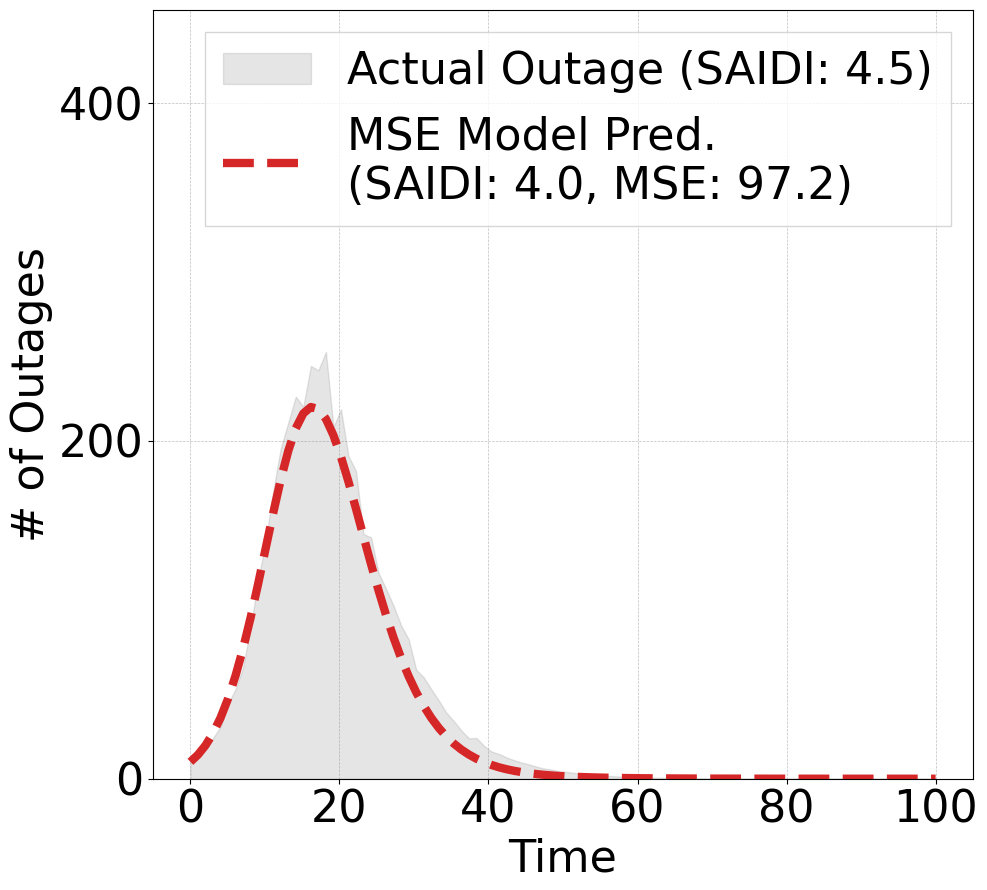

Plot saved to plots/city_2_MSE_train.pdf


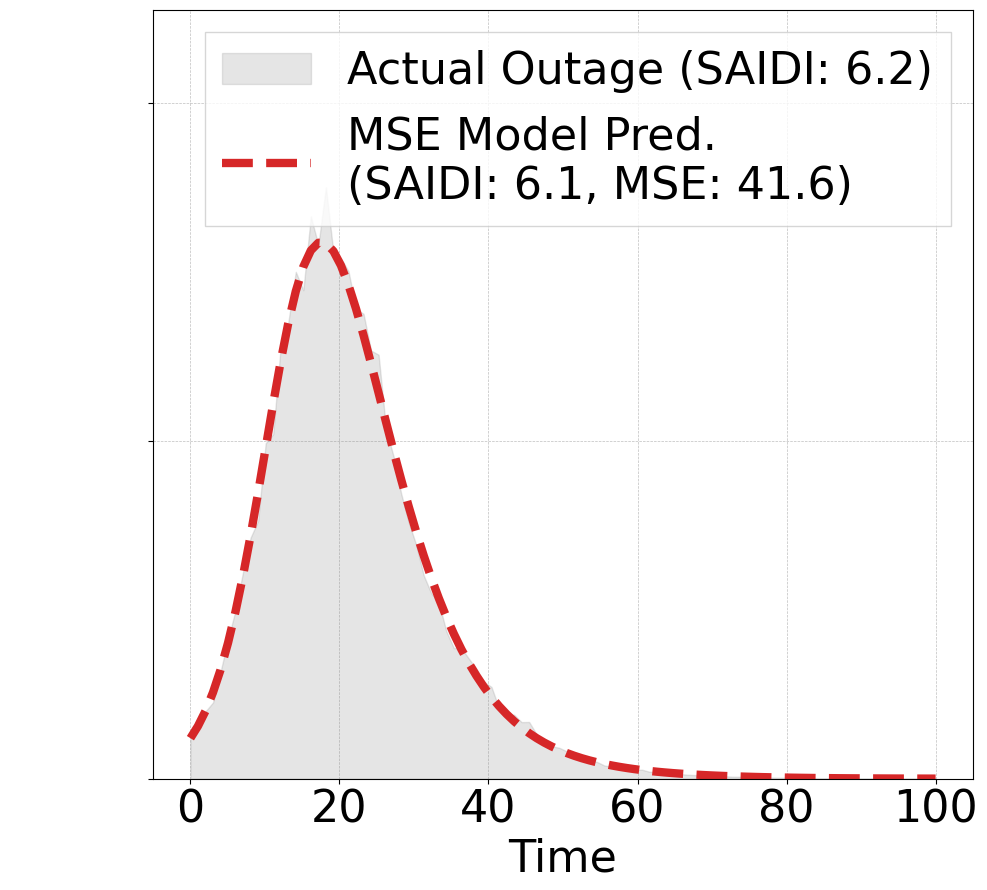

Plot saved to plots/city_3_MSE_train.pdf


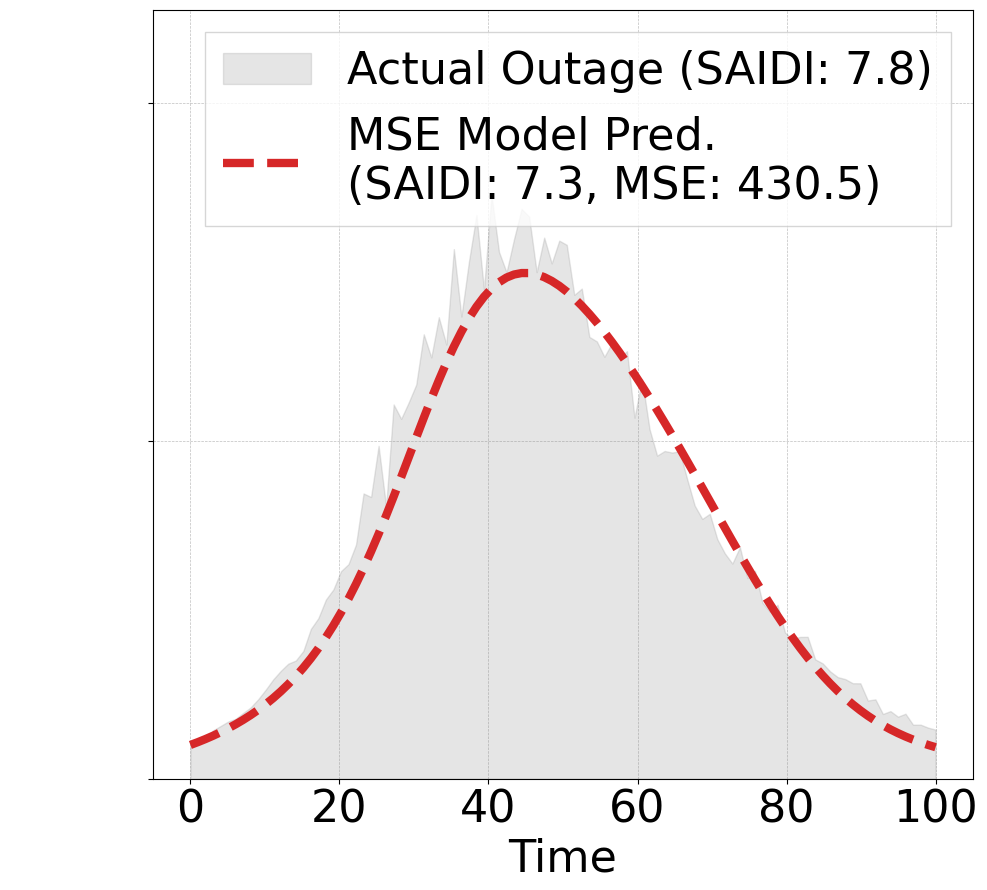

In [28]:
# Plot predictions vs true data after MSE training using the function
plot_predictions(time_points, synthetic_outages_noisy, pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE_train", save_path = PLOT_PATH)

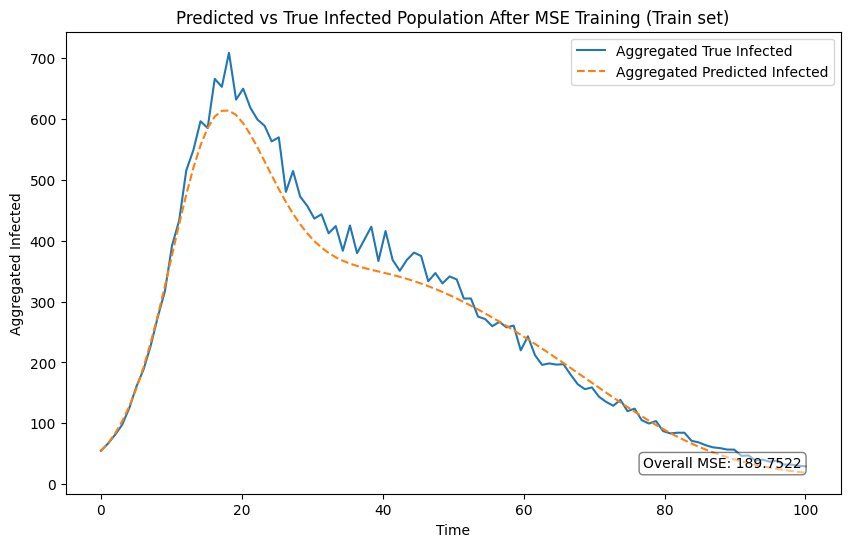

In [29]:
plot_aggregated_predictions(time_points, synthetic_outages_noisy, pred_outages, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training (Train set)")

In [30]:
with torch.no_grad():
    test_pred_outages = odeint(wind_sir_model, test_initial_conditions, time_points)
    test_loss = loss_fn(test_pred_outages[..., outage_idx], test_synthetic_outages_noisy[..., outage_idx])
print(f"Testing MSE Loss: {test_loss.item():.4f}")

Testing MSE Loss: 1869.4983


Plot saved to plots/city_1_MSE_test.pdf


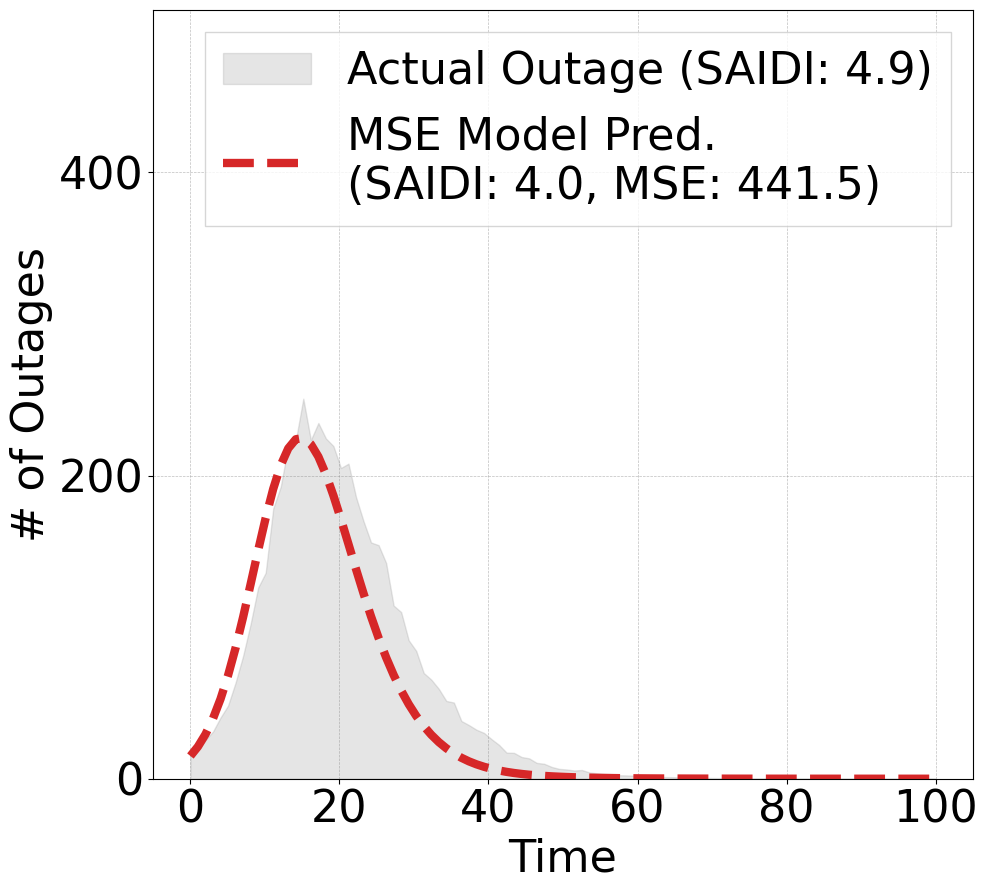

Plot saved to plots/city_2_MSE_test.pdf


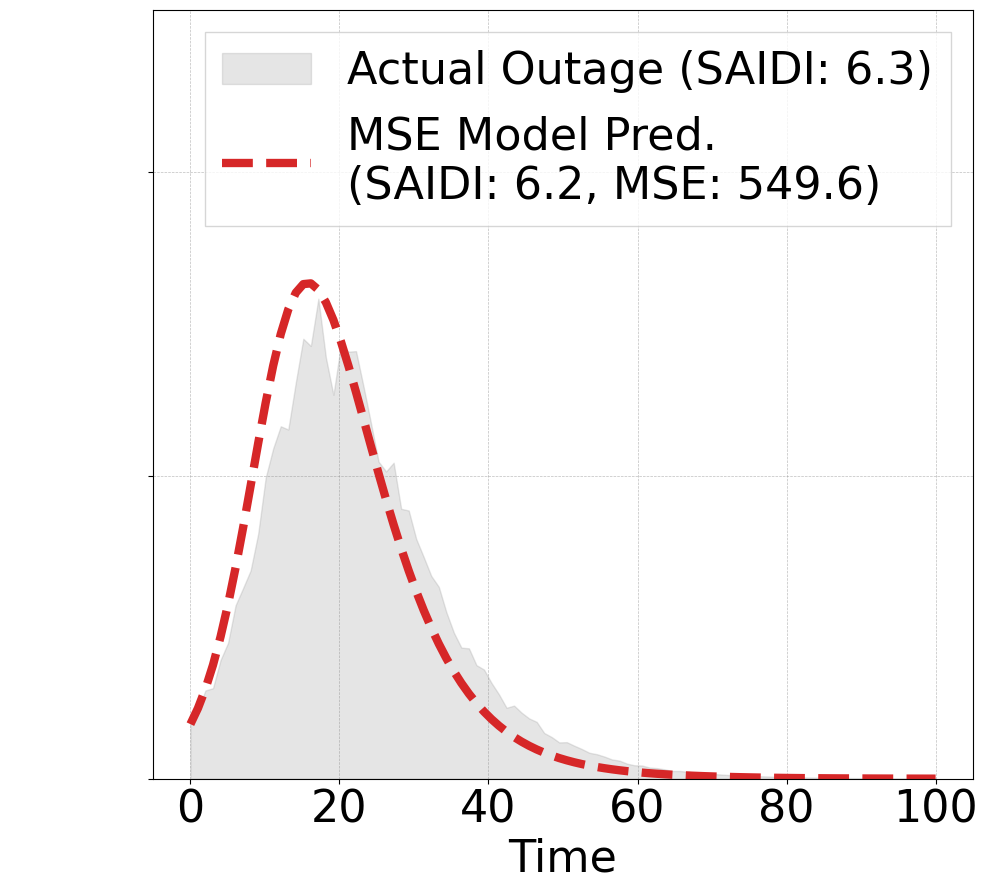

Plot saved to plots/city_3_MSE_test.pdf


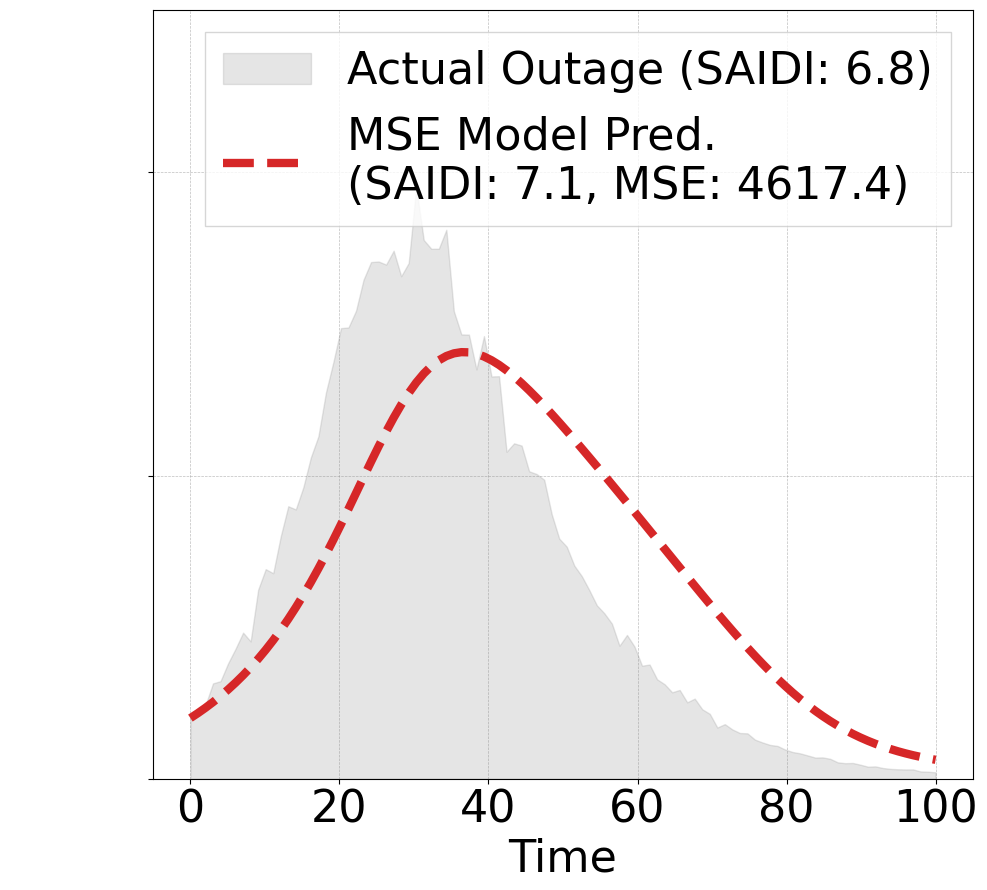

In [31]:
# Plot predictions vs true data after MSE training using the function
plot_predictions(time_points, test_synthetic_outages_noisy, test_pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE_test", save_path = PLOT_PATH) 

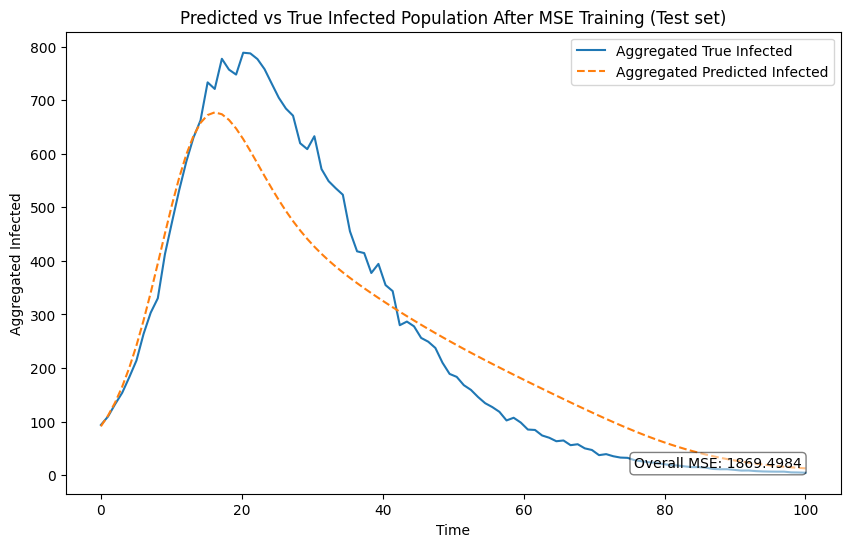

In [32]:
plot_aggregated_predictions(time_points, test_synthetic_outages_noisy, test_pred_outages, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training (Test set)")

# CVX Dispatch optimization demo

In [33]:
# def create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duartion):
#     # city_1_outage = cp.Parameter(outage_duartion)
#     # city_2_outage = cp.Parameter(outage_duartion)
#     # city_3_outage = cp.Parameter(outage_duartion)

#     Y = cp.Parameter((outage_duartion, num_cities))  # Predicted outages

#     x_to = cp.Variable((outage_duartion, num_cities), nonneg=True)  # Generators transported to cities
#     x_back = cp.Variable((outage_duartion, num_cities), nonneg=True)  # Generators transported back to warehouse
#     # stock at cities
#     q = cp.Variable((outage_duartion, num_cities), nonneg=True)
#     # stock at warehouse
#     s_w = cp.Variable(outage_duartion, nonneg=True)

#     constraints = []

#     # Inventory balance constraints at the warehouse
#     constraints += [x_to[0] == 0]
#     constraints += [x_back[0] == 0]
#     constraints += [q[0, :] == 0]
#     constraints += [s_w[0] == G_initial]

#     for t in range(1, outage_duartion):

#         # Warehouse inventory balance
#         constraints += [
#             s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :]) + cp.sum(x_back[t, :])
#         ]
#         # City inventory balance for each city
#         constraints += [
#             q[t, :] == q[t - 1, :] + x_to[t, :] - x_back[t, :]
#         ]

#     # flow conservation
#     for i in range(0, num_cities):
#         constraints += [q[0, i] == 0]
#         constraints += [cp.sum(x_to[:, i]) == cp.sum(x_back[:, i])]

#     economic_cost = tau * cp.sum(cp.pos(Y - N_g * q[:, :]))
#     transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
#     operational_cost = gamma * cp.sum(q[:, :])

#     total_cost = economic_cost + transportation_cost + operational_cost

#     objective = cp.Minimize(total_cost)

#     problem = cp.Problem(objective, constraints)
#     assert problem.is_dpp()
#     cvxpylayer = CvxpyLayer(problem, parameters=[Y], variables=[x_to, x_back, s_w, q])
#     return cvxpylayer


In [ ]:
# def create_gdp_cvxpy_layer_delay(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duartion, delta_t=1):
#     # Predicted outages for each time step and city
#     Y = cp.Parameter((outage_duartion, num_cities))
    
#     # Decision variables:
#     x_to = cp.Variable((outage_duartion, num_cities), nonneg=True)   # Generators dispatched to cities
#     x_back = cp.Variable((outage_duartion, num_cities), nonneg=True) # Generators transported back to warehouse
#     q = cp.Variable((outage_duartion, num_cities), nonneg=True)       # Stock at cities
#     s_w = cp.Variable(outage_duartion, nonneg=True)                   # Stock at warehouse

#     constraints = []

#     # Initial conditions: no dispatch at t=0 and warehouse starts with G_initial.
#     constraints += [x_to[0] == 0]
#     constraints += [x_back[0] == 0]
#     constraints += [s_w[0] == G_initial]
#     constraints += [q[0, :] == 0]

#     for t in range(1, outage_duartion):
#         # Warehouse inventory balance with travel delay for returns:
#         if t < delta_t:
#             constraints += [s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :])]
#         else:
#             constraints += [s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :]) + cp.sum(x_back[t - delta_t, :])]
            
#         # City inventory balance with delivery delay:
#         if t < delta_t:
#             # Before the delivery delay has passed, only returns affect city inventory.
#             constraints += [q[t, :] == q[t - 1, :] - x_back[t, :]]
#         else:
#             # After delta_t, dispatched generators become available in the city.
#             constraints += [q[t, :] == q[t - 1, :] + x_to[t - delta_t, :] - x_back[t, :]]

#     # Terminal constraint: ensure that at the end all generators are returned from cities.
#     constraints += [q[outage_duartion - 1, :] == 0]

#     economic_cost = tau * cp.sum(cp.pos(Y - N_g * q))
#     transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
#     operational_cost = gamma * cp.sum(q)
#     total_cost = economic_cost + transportation_cost + operational_cost

#     objective = cp.Minimize(total_cost)
#     problem = cp.Problem(objective, constraints)
#     assert problem.is_dpp()
#     cvxpylayer = CvxpyLayer(problem, parameters=[Y], variables=[x_to, x_back, s_w, q])
#     return cvxpylayer
def create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma,
                           G_initial, num_cities, outage_duration,
                           eps_strong_convex=1e-2):
    """
    Strongly-convex relaxation of generator-dispatch problem.
    """

    Y = cp.Parameter((outage_duration, num_cities))  # predicted or true outages

    x_to = cp.Variable((outage_duration, num_cities), nonneg=True)
    x_back = cp.Variable((outage_duration, num_cities), nonneg=True)
    q = cp.Variable((outage_duration, num_cities), nonneg=True)
    s_w = cp.Variable(outage_duration, nonneg=True)

    constraints = []
    constraints += [x_to[0] == 0, x_back[0] == 0, q[0, :] == 0, s_w[0] == G_initial]

    # Dynamics
    for t in range(1, outage_duration):
        constraints += [
            s_w[t] == s_w[t-1] - cp.sum(x_to[t, :]) + cp.sum(x_back[t, :])
        ]
        constraints += [
            q[t, :] == q[t-1, :] + x_to[t, :] - x_back[t, :]
        ]

    # flow conservation per city
    for i in range(num_cities):
        constraints += [cp.sum(x_to[:, i]) == cp.sum(x_back[:, i])]

    # Base costs
    economic_cost = tau * cp.sum(cp.pos(Y - N_g * q))
    transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
    operational_cost = gamma * cp.sum(q)

    # Strong convexity (fix Issue 3)
    strong_convex_term = eps_strong_convex * (
        cp.sum_squares(x_to) +
        cp.sum_squares(x_back) +
        cp.sum_squares(q)
    )

    total_cost = economic_cost + transportation_cost + operational_cost + strong_convex_term

    objective = cp.Minimize(total_cost)
    problem = cp.Problem(objective, constraints)
    
    assert problem.is_dpp()

    return CvxpyLayer(problem, parameters=[Y], variables=[x_to, x_back, s_w, q])


def create_gdp_cvxpy_layer_delay(
        tau, N_g, transport_cost_per_gen, gamma,
        G_initial, num_cities, outage_duration,
        delta_t=1, eps_strong_convex=1e-2):
    """
    Strongly convex relaxation of generator-dispatch problem WITH TRANSPORT DELAY.
    """

    # Predicted (or true) outages per time and city
    Y = cp.Parameter((outage_duration, num_cities))

    # Decision variables
    x_to = cp.Variable((outage_duration, num_cities), nonneg=True)
    x_back = cp.Variable((outage_duration, num_cities), nonneg=True)
    q = cp.Variable((outage_duration, num_cities), nonneg=True)
    s_w = cp.Variable(outage_duration, nonneg=True)

    constraints = []

    # Initial conditions at t = 0
    constraints += [x_to[0] == 0]
    constraints += [x_back[0] == 0]
    constraints += [q[0, :] == 0]
    constraints += [s_w[0] == G_initial]

    # Dynamics with delay
    for t in range(1, outage_duration):

        # Warehouse inventory
        if t < delta_t:
            # Returns not arrived yet
            constraints += [
                s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :])
            ]
        else:
            # Returns from delta_t steps ago
            constraints += [
                s_w[t] == s_w[t - 1]
                            - cp.sum(x_to[t, :])
                            + cp.sum(x_back[t - delta_t, :])
            ]

        # City inventory
        if t < delta_t:
            # Only returns affect q until first deliveries arrive
            constraints += [
                q[t, :] == q[t - 1, :] - x_back[t, :]
            ]
        else:
            # Deliveries from t-delta_t become available
            constraints += [
                q[t, :] == q[t - 1, :]
                            + x_to[t - delta_t, :]
                            - x_back[t, :]
            ]

    # All generators must be returned at horizon end
    constraints += [q[outage_duration - 1, :] == 0]

    # Cost terms
    economic_cost = tau * cp.sum(cp.pos(Y - N_g * q))
    transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
    operational_cost = gamma * cp.sum(q)

    # === Strong Convexity ===
    strong_convex_term = eps_strong_convex * (
        cp.sum_squares(x_to) +
        cp.sum_squares(x_back) +
        cp.sum_squares(q)
    )

    total_cost = (economic_cost
                  + transportation_cost
                  + operational_cost
                  + strong_convex_term)

    problem = cp.Problem(cp.Minimize(total_cost), constraints)
    assert problem.is_dpp()

    return CvxpyLayer(
        problem,
        parameters=[Y],
        variables=[x_to, x_back, s_w, q]
    )


In [35]:
# import cvxpy as cp
# from cvxpylayers.torch import CvxpyLayer

# def create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration):
#     # Parameters
#     Y = cp.Parameter((outage_duration, num_cities))  # Predicted outages

#     # Variables
#     x_to = cp.Variable((outage_duration, num_cities), integer=True)  # Generators transported to cities
#     x_back = cp.Variable((outage_duration, num_cities), integer=True)  # Generators transported back to warehouse
#     q = cp.Variable((outage_duration, num_cities), integer=True)  # Stock at cities
#     s_w = cp.Variable(outage_duration, integer=True)  # Stock at warehouse

#     constraints = []

#     # Initial conditions
#     constraints += [x_to[0] == 0]
#     constraints += [x_back[0] == 0]
#     constraints += [s_w[0] == G_initial]

#     # Inventory balance constraints
#     for t in range(1, outage_duration):
#         constraints += [
#             s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :]) + cp.sum(x_back[t, :]),
#             q[t, :] == q[t - 1, :] + x_to[t, :] - x_back[t, :]
#         ]

#     # Flow conservation
#     for i in range(num_cities):
#         constraints += [q[0, i] == 0]
#         constraints += [cp.sum(x_to[:, i]) == cp.sum(x_back[:, i])]

#     # Cost components
#     economic_cost = tau * cp.sum(cp.pos(Y - N_g * q))
#     transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
#     operational_cost = gamma * cp.sum(q)

#     total_cost = economic_cost + transportation_cost + operational_cost
#     objective = cp.Minimize(total_cost)

#     # Problem definition
#     problem = cp.Problem(objective, constraints)
#     assert problem.is_dpp()  # Ensure problem is DPP-compliant for CvxpyLayer

#     cvxpylayer = CvxpyLayer(problem, parameters=[Y], variables=[x_to, x_back, s_w, q])
#     return cvxpylayer


In [36]:
synthetic_outages_noisy.shape

torch.Size([100, 3, 3])

In [37]:
synthetic_outages_noisy[:,0,1]

tensor([1.0481e+01, 1.3687e+01, 1.7205e+01, 2.4004e+01, 3.0816e+01, 4.4219e+01,
        5.3134e+01, 6.5986e+01, 8.9820e+01, 1.1733e+02, 1.4082e+02, 1.7027e+02,
        1.9562e+02, 2.1091e+02, 2.2620e+02, 2.2031e+02, 2.4440e+02, 2.4182e+02,
        2.5272e+02, 2.0838e+02, 2.1871e+02, 1.9098e+02, 1.8222e+02, 1.4482e+02,
        1.4288e+02, 1.2176e+02, 1.1237e+02, 1.0225e+02, 9.0696e+01, 8.2497e+01,
        6.4577e+01, 5.9964e+01, 5.2950e+01, 4.6322e+01, 3.9111e+01, 3.4103e+01,
        2.8522e+01, 2.3973e+01, 2.4147e+01, 1.9492e+01, 1.6126e+01, 1.4677e+01,
        1.2585e+01, 1.0994e+01, 9.5822e+00, 8.4434e+00, 7.1303e+00, 6.0142e+00,
        5.4271e+00, 4.3483e+00, 3.9932e+00, 3.4206e+00, 2.8188e+00, 2.4447e+00,
        2.3319e+00, 1.8983e+00, 1.5574e+00, 1.2906e+00, 1.1903e+00, 9.4321e-01,
        8.7915e-01, 7.9526e-01, 6.0436e-01, 5.7337e-01, 5.0890e-01, 4.1893e-01,
        3.8700e-01, 3.2135e-01, 2.7976e-01, 2.1271e-01, 2.0390e-01, 1.7211e-01,
        1.5210e-01, 1.2057e-01, 1.0286e-

In [38]:
synthetic_outages_noisy[:,1,1]

tensor([2.3628e+01, 3.0507e+01, 3.9844e+01, 4.5142e+01, 6.3239e+01, 8.2582e+01,
        9.9733e+01, 1.2257e+02, 1.4277e+02, 1.5276e+02, 1.9858e+02, 2.0406e+02,
        2.5607e+02, 2.6996e+02, 3.0013e+02, 2.8922e+02, 3.3291e+02, 3.1596e+02,
        3.5011e+02, 3.1152e+02, 3.0817e+02, 3.0052e+02, 2.7822e+02, 2.7524e+02,
        2.5352e+02, 2.5103e+02, 2.0683e+02, 1.9070e+02, 1.6885e+02, 1.5183e+02,
        1.3843e+02, 1.2032e+02, 1.0979e+02, 1.0443e+02, 8.7288e+01, 7.7337e+01,
        7.7292e+01, 7.1053e+01, 6.5104e+01, 5.7393e+01, 5.4314e+01, 4.1752e+01,
        3.8093e+01, 3.7888e+01, 3.3521e+01, 3.3611e+01, 2.6273e+01, 2.0451e+01,
        1.9234e+01, 1.8327e+01, 1.6250e+01, 1.5064e+01, 1.1996e+01, 1.1243e+01,
        9.9759e+00, 7.8268e+00, 7.1041e+00, 7.2430e+00, 6.1882e+00, 5.1381e+00,
        5.3410e+00, 4.1172e+00, 4.0511e+00, 3.6804e+00, 2.7439e+00, 2.8101e+00,
        2.3791e+00, 2.1712e+00, 1.9364e+00, 1.8085e+00, 1.4522e+00, 1.4858e+00,
        1.1913e+00, 1.1416e+00, 9.5697e-

In [39]:
synthetic_outages_noisy[:,2,1]

tensor([ 20.7530,  22.4338,  24.0228,  28.6151,  31.1804,  33.8163,  35.4609,
         38.8888,  42.1856,  47.0217,  52.6752,  58.7942,  63.8183,  68.1132,
         69.9737,  75.6312,  88.6619,  95.0857, 106.0753, 112.0901, 122.8587,
        127.0440, 138.6439, 168.8934, 166.8043, 197.1038, 161.0790, 221.5887,
        213.0827, 222.7817, 233.3688, 263.1330, 249.4490, 273.2331, 257.0836,
        313.5728, 273.6536, 306.1451, 333.7125, 289.7093, 345.4608, 311.8734,
        299.8731, 319.6664, 337.3133, 332.8210, 299.9463, 320.3846, 305.1259,
        318.5909, 316.0995, 286.4739, 290.1954, 261.6097, 258.8960, 249.8087,
        257.9670, 249.0178, 253.1850, 213.7248, 236.6802, 206.9324, 191.2919,
        194.0408, 193.1227, 193.8600, 177.3095, 161.6983, 153.8249, 156.8463,
        141.8472, 133.4478, 127.3960, 137.1147, 118.8226, 123.0985, 104.2066,
         98.7973, 102.9690,  86.5027,  82.8357,  83.9627,  84.0184,  70.6987,
         68.2769,  63.5314,  60.1522,  58.9897,  56.5453,  56.50

In [40]:
synthetic_outages_noisy.shape

torch.Size([100, 3, 3])

In [41]:
synthetic_outages_noisy_gdp = synthetic_outages_noisy[:,:,1]

In [42]:
synthetic_outages_noisy_gdp.shape

torch.Size([100, 3])

In [43]:
import torch
import numpy as np

# Example parameters

torch.manual_seed(0)  # For reproducibility
# outage_duration = 10
outage_duration = 100
Y_true = synthetic_outages_noisy_gdp

# Example predicted outages (random data for testing)

# random outage
# Y_pred = torch.rand(outage_duration, num_cities) * 150  # Random outages between 0 and 150

# sir outage
# Y_pred = synthetic_outages_noisy_gdp

# test prediciton

pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
Y_pred = pred_outages[:,:,1]

In [44]:
Y_pred.shape

torch.Size([100, 3])

In [45]:
Y_true.shape

torch.Size([100, 3])

In [46]:
# transport_cost_per_gen = 100.0
transport_cost_per_gen = 400
gamma = 2.0
G_initial = 5.0
num_cities = 3
outage_duration = 100
tau = 1.0
N_g = 100.0
dt = 10

# Create the CVXPY layer
# gdp_cvxpy_layer = create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration)
# gdp_cvxpy_layer = create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration)
gdp_cvxpy_layer = create_gdp_cvxpy_layer_delay(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, delta_t=dt)



In [47]:
# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

# Display results
print("Generators Transported to Cities (x_to):")
print(x_to_np)
print("\nGenerators Transported Back to Warehouse (x_back):")
print(x_back_np)
print("\nGenerators at Warehouse Over Time (s_w):")
print(s_w_np)
print("\nGenerators at Each City Over Time (q):")
print(q_np)


Generators Transported to Cities (x_to):
[[ 1.43143313e-06  1.43144268e-06  1.43222178e-06]
 [ 7.46760726e-01  1.69515276e+00  4.78310466e-01]
 [-1.41235869e-02  1.43178068e-02  4.05723341e-02]
 [-4.11907956e-03 -2.48604245e-03  4.39660698e-02]
 [-8.71371536e-04  1.41939544e-03  4.75387201e-02]
 [-5.28731989e-03 -6.75449660e-03  5.14163487e-02]
 [-4.91751917e-03  4.32683947e-03  5.56905307e-02]
 [ 3.12330481e-03 -6.05348777e-03  6.22215569e-02]
 [ 4.78295702e-03 -1.80637278e-02  6.41800314e-02]
 [-3.13963252e-03  2.10927639e-04  7.11995661e-02]
 [-6.54107658e-03  6.78469241e-03  7.77844638e-02]
 [-7.86856655e-03 -4.35808557e-04  8.24290216e-02]
 [-7.51889497e-03 -6.69211103e-03  8.64062011e-02]
 [ 1.76632719e-03 -5.19756926e-03  9.41202715e-02]
 [ 6.46402547e-03 -4.20141080e-03  1.00001261e-01]
 [ 9.21836868e-03 -2.77425372e-03  1.05357848e-01]
 [ 4.53489693e-03 -2.95063900e-03  1.08825102e-01]
 [-6.17272453e-04 -1.05384248e-03  1.12222448e-01]
 [-1.02581950e-02  1.89564296e-03  1.1452

In [48]:
# print(gdp_cvxpy_layer.problem.value)

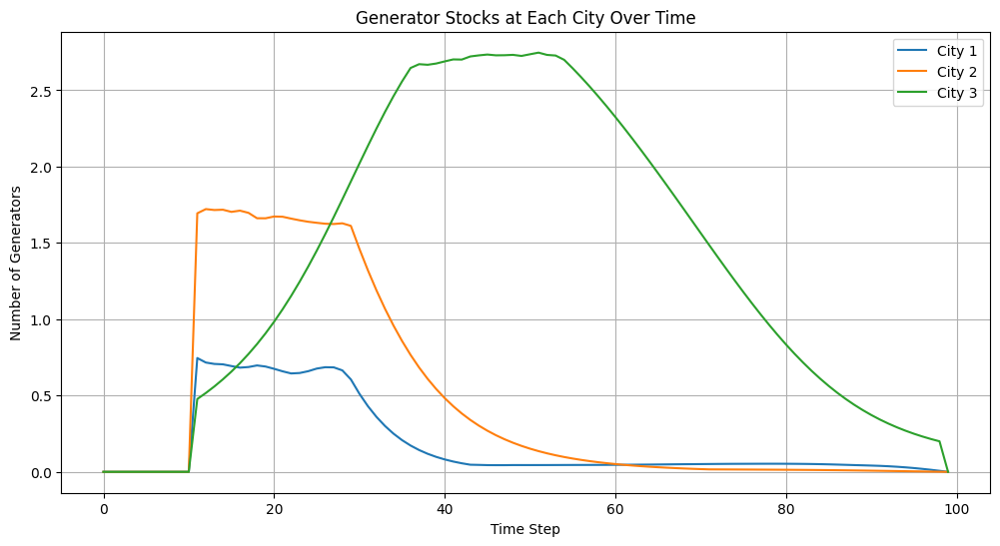

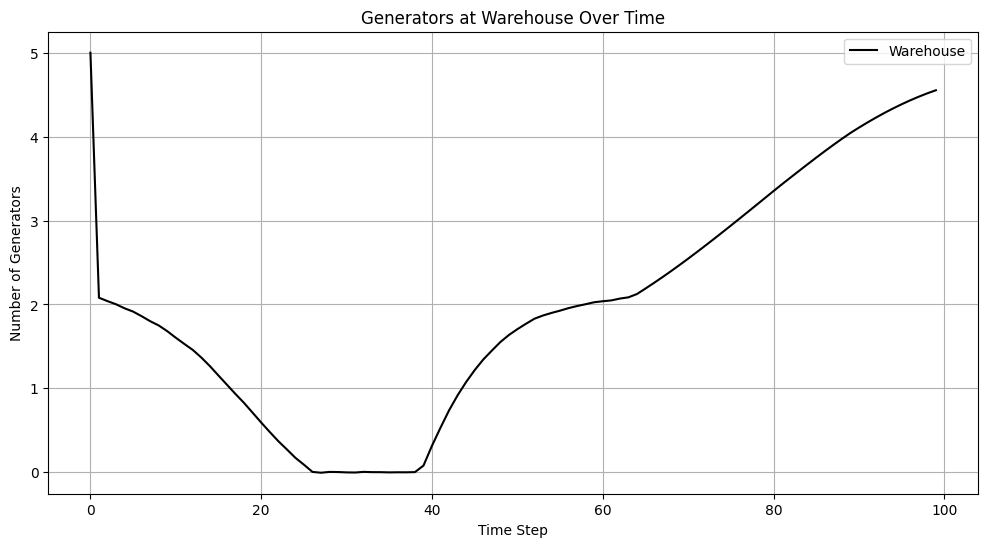

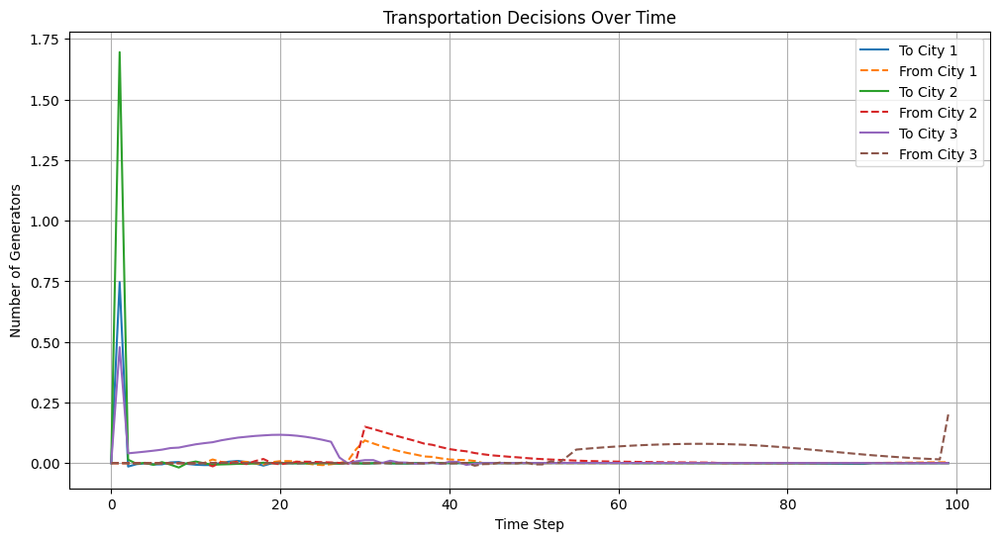

In [49]:
import matplotlib.pyplot as plt

def plot_results(x_to, x_back, s_w, q, num_cities):
    time_steps = x_to.shape[0]
    time = np.arange(time_steps)

    # Plot Generators at Each City Over Time
    plt.figure(figsize=(12, 6))
    for i in range(num_cities):
        plt.plot(time, q[:, i], label=f"City {i+1}")
    plt.xlabel("Time Step")
    plt.ylabel("Number of Generators")
    plt.title("Generator Stocks at Each City Over Time")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Generators at Warehouse Over Time
    plt.figure(figsize=(12, 6))
    plt.plot(time, s_w, label="Warehouse", color='black')
    plt.xlabel("Time Step")
    plt.ylabel("Number of Generators")
    plt.title("Generators at Warehouse Over Time")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot Transportation Decisions Over Time
    plt.figure(figsize=(12, 6))
    for i in range(num_cities):
        plt.plot(time, x_to[:, i], label=f"To City {i+1}")
        plt.plot(time, x_back[:, i], label=f"From City {i+1}", linestyle='--')
    plt.xlabel("Time Step")
    plt.ylabel("Number of Generators")
    plt.title("Transportation Decisions Over Time")
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage with the previously obtained optimization results
plot_results(x_to_np, x_back_np, s_w_np, q_np, num_cities)


In [50]:
import matplotlib.pyplot as plt

def plot_Y_pred_and_q(Y_pred_np, q_np, num_cities):
    """
    Plots predicted outages and generator stock for each city with separate y-axes.

    Parameters:
    - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
    - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
    - num_cities: Integer representing the number of cities
    """
    time_steps = Y_pred_np.shape[0]
    time = np.arange(time_steps)

    # Create a figure with subplots for each city
    fig, axs = plt.subplots(num_cities, 1, figsize=(14, 6 * num_cities), sharex=True)

    # If there's only one city, axs is not a list, so we make it a list for consistency
    if num_cities == 1:
        axs = [axs]

    for i in range(num_cities):
        ax1 = axs[i]
        ax1.plot(time, Y_pred_np[:, i], label='Predicted Outage', color='red', marker='o')
        ax1.set_ylabel('Predicted Outage', color='red', fontsize=12)
        ax1.tick_params(axis='y', labelcolor='red')
        ax1.set_title(f'City {i+1}', fontsize=14)
        ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Create a twin y-axis to plot generator stock
        ax2 = ax1.twinx()
        ax2.plot(time, q_np[:, i], label='Generator Stock', color='blue', marker='x')
        ax2.set_ylabel('Generator Stock', color='blue', fontsize=12)
        ax2.tick_params(axis='y', labelcolor='blue')

        # Combine legends from both axes
        lines_1, labels_1 = ax1.get_legend_handles_labels()
        lines_2, labels_2 = ax2.get_legend_handles_labels()
        ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

    plt.xlabel('Time Step', fontsize=12)
    plt.tight_layout()
    plt.show()


In [51]:
# Convert Y_pred to NumPy for plotting
Y_pred_np = Y_pred.detach().numpy()

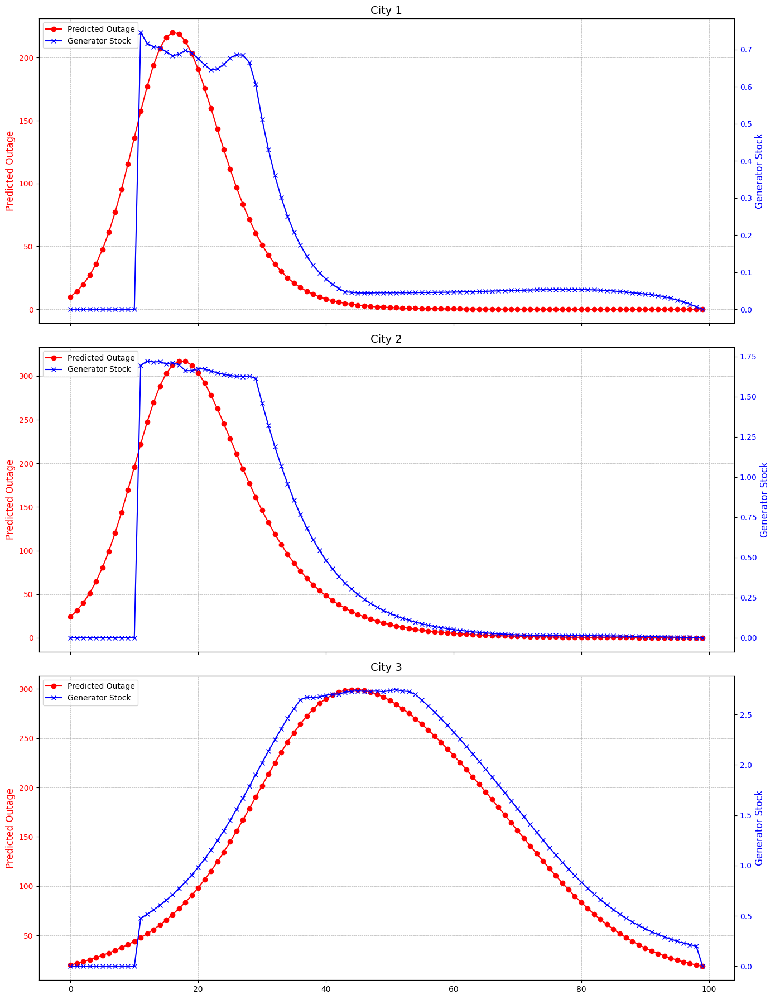

In [52]:
# Call the new plotting function
plot_Y_pred_and_q(Y_pred_np, q_np, num_cities)

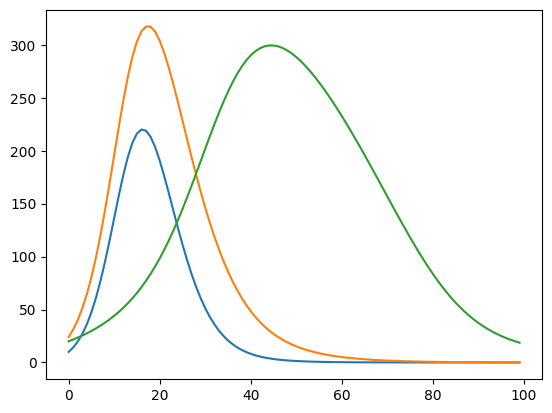

In [53]:
plt.plot(Y_pred_np)
# plt.legend()

In [54]:
def compute_and_print_costs(Y_true, q_np, x_to_np, x_back_np, tau, N_g, transport_cost_per_gen, gamma, num_cities):
    """
    Computes and prints the economic, transportation, and operational costs per city and their totals.

    Parameters:
    - Y_true: NumPy array of predicted outages (shape: [time_steps, num_cities])
    - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
    - x_to_np: NumPy array of generators transported to cities (shape: [time_steps, num_cities])
    - x_back_np: NumPy array of generators transported back to warehouse (shape: [time_steps, num_cities])
    - tau: Economic cost factor
    - N_g: Generators per unit (used in economic cost calculation)
    - transport_cost_per_gen: Transportation cost per generator
    - gamma: Operational cost factor
    - num_cities: Number of cities
    """
    # Economic Cost: tau * sum(max(0, Y_pred - N_g * q))
    economic_costs = tau * np.sum(np.maximum(0, Y_true - N_g * q_np), axis=0)

    # Transportation Cost: transport_cost_per_gen * sum(x_to + x_back)
    transportation_costs = transport_cost_per_gen * np.sum(x_to_np + x_back_np, axis=0)

    # Operational Cost: gamma * sum(q)
    operational_costs = gamma * np.sum(q_np, axis=0)

    # Total Costs per Category
    total_economic_cost = np.sum(economic_costs)
    total_transportation_cost = np.sum(transportation_costs)
    total_operational_cost = np.sum(operational_costs)
    sum_total_cost = total_economic_cost + total_transportation_cost + total_operational_cost

    # Print per-city costs
    print("\n=== Per-City Costs ===")
    for i in range(num_cities):
        print(f"City {i+1}:")
        print(f"  Economic Cost: ${economic_costs[i]:.2f}")
        print(f"  Transportation Cost: ${transportation_costs[i]:.2f}")
        print(f"  Operational Cost: ${operational_costs[i]:.2f}\n")

    # Print total costs
    print("=== Total Costs ===")
    print(f"Total Economic Cost: ${total_economic_cost:.2f}")
    print(f"Total Transportation Cost: ${total_transportation_cost:.2f}")
    print(f"Total Operational Cost: ${total_operational_cost:.2f}")
    print(f"Sum of All Costs: ${sum_total_cost:.2f}")


In [55]:
# # Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_true)

# # Convert to NumPy for inspection
# x_to_np = x_to_opt.detach().numpy()
# x_back_np = x_back_opt.detach().numpy()
# s_w_np = s_w_opt.detach().numpy()
# q_np = q_opt.detach().numpy()

# # Call the cost computation and printing function
# compute_and_print_costs(
#     Y_true_np,
#     q_np,
#     x_to_np,
#     x_back_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     num_cities
# )

In [56]:
# import cvxpy as cp
# from cvxpylayers.torch import CvxpyLayer
# import torch
# import numpy as np
# import matplotlib.pyplot as plt

# # def create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration):
# #     Y = cp.Parameter((outage_duration, num_cities))  # Predicted outages

# #     x_to = cp.Variable((outage_duration, num_cities), nonneg=True)  # Generators transported to cities
# #     x_back = cp.Variable((outage_duration, num_cities), nonneg=True)  # Generators transported back to warehouse
# #     # Stock at cities
# #     q = cp.Variable((outage_duration, num_cities), nonneg=True)
# #     # Stock at warehouse
# #     s_w = cp.Variable(outage_duration, nonneg=True)

# #     constraints = []

# #     # Inventory balance constraints at the warehouse
# #     constraints += [x_to[0] == 0]
# #     constraints += [x_back[0] == 0]
# #     constraints += [s_w[0] == G_initial]

# #     for t in range(1, outage_duration):
# #         # Warehouse inventory balance
# #         constraints += [
# #             s_w[t] == s_w[t - 1] - cp.sum(x_to[t, :]) + cp.sum(x_back[t, :])
# #         ]
# #         # City inventory balance for each city
# #         constraints += [
# #             q[t, :] == q[t - 1, :] + x_to[t, :] - x_back[t, :]
# #         ]

# #     # Flow conservation
# #     for i in range(num_cities):
# #         constraints += [cp.sum(q[0, i]) == 0]
# #         constraints += [cp.sum(x_to[:, i]) == cp.sum(x_back[:, i])]

# #     economic_cost = tau * cp.sum(cp.pos(Y - N_g * q[:, :]))
# #     transportation_cost = transport_cost_per_gen * cp.sum(x_to + x_back)
# #     operational_cost = gamma * cp.sum(q[:, :])

# #     total_cost = economic_cost + transportation_cost + operational_cost

# #     objective = cp.Minimize(total_cost)

# #     problem = cp.Problem(objective, constraints)
# #     assert problem.is_dpp()

# #     cvxpylayer = CvxpyLayer(problem, parameters=[Y], variables=[x_to, x_back, s_w, q])
# #     return cvxpylayer

# def baseline_greedy_online_strategy(
#     Y_pred_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     G_initial,
#     num_cities,
#     outage_duration
# ):
#     """
#     Implements a greedy online strategy for generator transportation.

#     Parameters:
#     - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
#     - tau: Economic cost factor
#     - N_g: Generators per unit (used in economic cost calculation)
#     - transport_cost_per_gen: Transportation cost per generator
#     - gamma: Operational cost factor
#     - G_initial: Initial number of generators at the warehouse
#     - num_cities: Number of cities
#     - outage_duration: Number of time steps

#     Returns:
#     - x_to_baseline: Generators transported to cities (shape: [time_steps, num_cities])
#     - x_back_baseline: Generators transported back to warehouse (shape: [time_steps, num_cities])
#     - s_w_baseline: Generators at warehouse over time (shape: [time_steps])
#     - q_baseline: Generators at each city over time (shape: [time_steps, num_cities])
#     - costs_baseline: Dictionary containing economic, transportation, operational costs
#     """
#     # Initialize transportation variables
#     x_to_baseline = np.zeros((outage_duration, num_cities))
#     x_back_baseline = np.zeros((outage_duration, num_cities))

#     # Initialize generator stocks
#     s_w_baseline = np.zeros(outage_duration)
#     q_baseline = np.zeros((outage_duration, num_cities))

#     # Set initial warehouse stock
#     s_w_baseline[0] = G_initial
#     # Set initial city stocks to zero (already initialized)

#     # Initialize costs
#     economic_cost_baseline = np.zeros(num_cities)
#     transportation_cost_baseline = np.zeros(num_cities)
#     operational_cost_baseline = np.zeros(num_cities)

#     for t in range(outage_duration):
#         if t > 0:
#             # Update warehouse stock based on previous transportation
#             s_w_baseline[t] = s_w_baseline[t-1] - np.sum(x_to_baseline[t-1, :]) + np.sum(x_back_baseline[t-1, :])
#             # Update city stocks based on previous transportation
#             q_baseline[t, :] = q_baseline[t-1, :] + x_to_baseline[t-1, :] - x_back_baseline[t-1, :]
#         else:
#             # At time t=0, city stocks remain zero
#             q_baseline[t, :] = 0

#         # Current outage
#         current_outage = Y_pred_np[t, :]

#         for i in range(num_cities):
#             # Calculate required generators to meet current outage
#             required_generators = np.ceil(current_outage[i] / N_g)

#             # Current generators at city
#             available_generators = q_baseline[t, i]

#             # Deficit
#             deficit = required_generators - available_generators

#             if deficit > 0 and t > 0:
#                 # Transport generators to cover the deficit
#                 transport = deficit
#                 # Ensure warehouse has enough generators
#                 transport = min(transport, s_w_baseline[t])
#                 x_to_baseline[t, i] = transport
#                 # Update warehouse and city stocks
#                 s_w_baseline[t] -= transport
#                 q_baseline[t, i] += transport

#                 # Transportation cost
#                 transportation_cost_baseline[i] += transport_cost_per_gen * transport

#             # Calculate unmet demand
#             unmet = max(0, current_outage[i] - N_g * q_baseline[t, i])
#             economic_cost_baseline[i] += tau * unmet

#             # Operational cost
#             operational_cost_baseline[i] += gamma * q_baseline[t, i]

#         # Note: In this baseline, we do not transport generators back to the warehouse
#         # Hence, x_back_baseline remains zero throughout

#     # Total costs
#     total_economic_cost_baseline = np.sum(economic_cost_baseline)
#     total_transportation_cost_baseline = np.sum(transportation_cost_baseline)
#     total_operational_cost_baseline = np.sum(operational_cost_baseline)
#     sum_total_cost_baseline = total_economic_cost_baseline + total_transportation_cost_baseline + total_operational_cost_baseline

#     # Store costs in a dictionary
#     costs_baseline = {
#         'economic_cost': economic_cost_baseline,
#         'transportation_cost': transportation_cost_baseline,
#         'operational_cost': operational_cost_baseline,
#         'total_economic_cost': total_economic_cost_baseline,
#         'total_transportation_cost': total_transportation_cost_baseline,
#         'total_operational_cost': total_operational_cost_baseline,
#         'sum_total_cost': sum_total_cost_baseline
#     }

#     return x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline


# def compute_and_print_costs_comparison(
#     costs_opt,
#     costs_baseline,
#     num_cities
# ):
#     """
#     Prints and compares the economic, transportation, and operational costs
#     for both the optimized and baseline strategies.

#     Parameters:
#     - costs_opt: Dictionary containing costs from the optimized strategy
#     - costs_baseline: Dictionary containing costs from the baseline strategy
#     - num_cities: Number of cities
#     """
#     print("\n=== Cost Comparison ===")
#     print(f"{'Cost Type':<25} {'Optimized':<20} {'Baseline':<20}")
#     print("-" * 65)
#     print(f"{'Total Economic Cost':<25} ${costs_opt['total_economic_cost']:<19.2f} ${costs_baseline['total_economic_cost']:<19.2f}")
#     print(f"{'Total Transportation Cost':<25} ${costs_opt['total_transportation_cost']:<19.2f} ${costs_baseline['total_transportation_cost']:<19.2f}")
#     print(f"{'Total Operational Cost':<25} ${costs_opt['total_operational_cost']:<19.2f} ${costs_baseline['total_operational_cost']:<19.2f}")
#     print(f"{'Sum of All Costs':<25} ${costs_opt['sum_total_cost']:<19.2f} ${costs_baseline['sum_total_cost']:<19.2f}")

# def plot_results_comparison(
#     x_to_opt, x_back_opt, s_w_opt, q_opt,
#     x_to_baseline, x_back_baseline, s_w_baseline, q_baseline,
#     num_cities
# ):
#     time_steps = x_to_opt.shape[0]
#     time = np.arange(time_steps)

#     # Plot Generator Stocks at Each City Over Time
#     plt.figure(figsize=(14, 6))
#     for i in range(num_cities):
#         plt.plot(time, q_opt[:, i], label=f"Optimized - City {i+1}", linestyle='-')
#         plt.plot(time, q_baseline[:, i], label=f"Baseline - City {i+1}", linestyle='--')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generator Stocks at Each City Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Generators at Warehouse Over Time
#     plt.figure(figsize=(14, 6))
#     plt.plot(time, s_w_opt, label="Optimized - Warehouse", color='green', linestyle='-')
#     plt.plot(time, s_w_baseline, label="Baseline - Warehouse", color='orange', linestyle='--')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generators at Warehouse Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Transportation Decisions Over Time
#     plt.figure(figsize=(14, 6))
#     for i in range(num_cities):
#         plt.plot(time, x_to_opt[:, i], label=f"Optimized To City {i+1}", linestyle='-')
#         plt.plot(time, x_to_baseline[:, i], label=f"Baseline To City {i+1}", linestyle='--')
#         plt.plot(time, x_back_opt[:, i], label=f"Optimized From City {i+1}", linestyle='-.')
#         plt.plot(time, x_back_baseline[:, i], label=f"Baseline From City {i+1}", linestyle=':')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Transportation Decisions Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# def compute_and_print_costs(Y_pred_np, q_np, x_to_np, x_back_np, tau, N_g, transport_cost_per_gen, gamma, num_cities):
#     """
#     Computes and prints the economic, transportation, and operational costs per city and their totals.

#     Parameters:
#     - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
#     - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
#     - x_to_np: NumPy array of generators transported to cities (shape: [time_steps, num_cities])
#     - x_back_np: NumPy array of generators transported back to warehouse (shape: [time_steps, num_cities])
#     - tau: Economic cost factor
#     - N_g: Generators per unit (used in economic cost calculation)
#     - transport_cost_per_gen: Transportation cost per generator
#     - gamma: Operational cost factor
#     - num_cities: Number of cities
#     """
#     # Economic Cost: tau * sum(max(0, Y_pred - N_g * q))
#     economic_costs = tau * np.sum(np.maximum(0, Y_pred_np - N_g * q_np), axis=0)

#     # Transportation Cost: transport_cost_per_gen * sum(x_to + x_back)
#     transportation_costs = transport_cost_per_gen * np.sum(x_to_np + x_back_np, axis=0)

#     # Operational Cost: gamma * sum(q)
#     operational_costs = gamma * np.sum(q_np, axis=0)

#     # Total Costs per Category
#     total_economic_cost = np.sum(economic_costs)
#     total_transportation_cost = np.sum(transportation_costs)
#     total_operational_cost = np.sum(operational_costs)
#     sum_total_cost = total_economic_cost + total_transportation_cost + operational_costs.sum()

#     # Print per-city costs
#     print("\n=== Optimized Strategy Costs ===")
#     for i in range(num_cities):
#         print(f"City {i+1}:")
#         print(f"  Economic Cost: ${economic_costs[i]:.2f}")
#         print(f"  Transportation Cost: ${transportation_costs[i]:.2f}")
#         print(f"  Operational Cost: ${operational_costs[i]:.2f}\n")

#     # Print total costs
#     print("=== Optimized Total Costs ===")
#     print(f"Total Economic Cost: ${total_economic_cost:.2f}")
#     print(f"Total Transportation Cost: ${total_transportation_cost:.2f}")
#     print(f"Total Operational Cost: ${total_operational_cost:.2f}")
#     print(f"Sum of All Costs: ${sum_total_cost:.2f}")

# def compute_and_print_costs_comparison(
#     costs_opt,
#     costs_baseline,
#     num_cities
# ):
#     """
#     Prints and compares the economic, transportation, and operational costs
#     for both the optimized and baseline strategies.

#     Parameters:
#     - costs_opt: Dictionary containing costs from the optimized strategy
#     - costs_baseline: Dictionary containing costs from the baseline strategy
#     - num_cities: Number of cities
#     """
#     print("\n=== Cost Comparison ===")
#     print(f"{'Cost Type':<25} {'Optimized':<20} {'Baseline':<20}")
#     print("-" * 65)
#     print(f"{'Total Economic Cost':<25} ${costs_opt['total_economic_cost']:<19.2f} ${costs_baseline['total_economic_cost']:<19.2f}")
#     print(f"{'Total Transportation Cost':<25} ${costs_opt['total_transportation_cost']:<19.2f} ${costs_baseline['total_transportation_cost']:<19.2f}")
#     print(f"{'Total Operational Cost':<25} ${costs_opt['total_operational_cost']:<19.2f} ${costs_baseline['total_operational_cost']:<19.2f}")
#     print(f"{'Sum of All Costs':<25} ${costs_opt['sum_total_cost']:<19.2f} ${costs_baseline['sum_total_cost']:<19.2f}")

# def plot_results_comparison(
#     x_to_opt, x_back_opt, s_w_opt, q_opt,
#     x_to_baseline, x_back_baseline, s_w_baseline, q_baseline,
#     num_cities
# ):
#     time_steps = x_to_opt.shape[0]
#     time = np.arange(time_steps)

#     # Plot Generator Stocks at Each City Over Time
#     plt.figure(figsize=(14, 6))
#     for i in range(num_cities):
#         plt.plot(time, q_opt[:, i], label=f"Optimized - City {i+1}", linestyle='-')
#         plt.plot(time, q_baseline[:, i], label=f"Baseline - City {i+1}", linestyle='--')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generator Stocks at Each City Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Generators at Warehouse Over Time
#     plt.figure(figsize=(14, 6))
#     plt.plot(time, s_w_opt, label="Optimized - Warehouse", color='green', linestyle='-')
#     plt.plot(time, s_w_baseline, label="Baseline - Warehouse", color='orange', linestyle='--')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generators at Warehouse Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Transportation Decisions Over Time
#     plt.figure(figsize=(14, 6))
#     for i in range(num_cities):
#         plt.plot(time, x_to_opt[:, i], label=f"Optimized To City {i+1}", linestyle='-')
#         plt.plot(time, x_to_baseline[:, i], label=f"Baseline To City {i+1}", linestyle='--')
#         plt.plot(time, x_back_opt[:, i], label=f"Optimized From City {i+1}", linestyle='-.')
#         plt.plot(time, x_back_baseline[:, i], label=f"Baseline From City {i+1}", linestyle=':')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Transportation Decisions Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# # # Example parameters
# # tau = 1.0
# # N_g = 100.0
# transport_cost_per_gen = 100.0
# # gamma = 2.0
# # G_initial = 500.0  # Increased initial generators for better demonstration
# # num_cities = 3
# # outage_duration = 10

# # # Create the CVXPY layer
# # gdp_cvxpy_layer = create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration)

# # # Example predicted outages (random data for testing)
# # torch.manual_seed(0)  # For reproducibility
# # Y_pred = torch.rand(outage_duration, num_cities) * 150  # Random outages between 0 and 150

# # Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

# # Convert to NumPy for inspection
# x_to_opt_np = x_to_opt.detach().numpy()
# x_back_opt_np = x_back_opt.detach().numpy()
# s_w_opt_np = s_w_opt.detach().numpy()
# q_opt_np = q_opt.detach().numpy()

# # Convert Y_pred to NumPy for plotting and cost calculations
# Y_pred_np = Y_pred.detach().numpy()

# # Display optimized strategy results
# print("=== Optimized Strategy Results ===")
# print("Generators Transported to Cities (x_to):")
# print(x_to_opt_np)
# print("\nGenerators Transported Back to Warehouse (x_back):")
# print(x_back_opt_np)
# print("\nGenerators at Warehouse Over Time (s_w):")
# print(s_w_opt_np)
# print("\nGenerators at Each City Over Time (q):")
# print(q_opt_np)

# # Existing plot_results function
# def plot_results(x_to, x_back, s_w, q, num_cities):
#     time_steps = x_to.shape[0]
#     time = np.arange(time_steps)

#     # Plot Generators at Each City Over Time
#     plt.figure(figsize=(12, 6))
#     for i in range(num_cities):
#         plt.plot(time, q[:, i], label=f"City {i+1}")
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generator Stocks at Each City Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Generators at Warehouse Over Time
#     plt.figure(figsize=(12, 6))
#     plt.plot(time, s_w, label="Warehouse", color='black')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Generators at Warehouse Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot Transportation Decisions Over Time
#     plt.figure(figsize=(12, 6))
#     for i in range(num_cities):
#         plt.plot(time, x_to[:, i], label=f"To City {i+1}")
#         plt.plot(time, x_back[:, i], label=f"From City {i+1}", linestyle='--')
#     plt.xlabel("Time Step")
#     plt.ylabel("Number of Generators")
#     plt.title("Transportation Decisions Over Time")
#     plt.legend()
#     plt.grid(True)
#     plt.show()

# # Call the existing plotting function
# plot_results(x_to_opt_np, x_back_opt_np, s_w_opt_np, q_opt_np, num_cities)

# # Implement the baseline greedy online strategy
# x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline = baseline_greedy_online_strategy(
#     Y_pred_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     G_initial,
#     num_cities,
#     outage_duration
# )

# # Display baseline strategy results
# print("\n=== Baseline Strategy Results ===")
# print("Generators Transported to Cities (x_to):")
# print(x_to_baseline)
# print("\nGenerators Transported Back to Warehouse (x_back):")
# print(x_back_baseline)
# print("\nGenerators at Warehouse Over Time (s_w):")
# print(s_w_baseline)
# print("\nGenerators at Each City Over Time (q):")
# print(q_baseline)

# # Call the new plotting function for comparison
# plot_results_comparison(
#     x_to_opt_np, x_back_opt_np, s_w_opt_np, q_opt_np,
#     x_to_baseline, x_back_baseline, s_w_baseline, q_baseline,
#     num_cities
# )

# # Compute and print optimized costs
# compute_and_print_costs(
#     Y_pred_np,
#     q_opt_np,
#     x_to_opt_np,
#     x_back_opt_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     num_cities
# )

# # Compute and print cost comparison
# compute_and_print_costs_comparison(
#     costs_opt = {
#         'total_economic_cost': np.sum(tau * np.sum(np.maximum(0, Y_pred_np - N_g * q_opt_np), axis=0)),
#         'total_transportation_cost': np.sum(transport_cost_per_gen * (x_to_opt_np + x_back_opt_np)),
#         'total_operational_cost': np.sum(gamma * np.sum(q_opt_np, axis=0)),
#         'sum_total_cost': np.sum(tau * np.sum(np.maximum(0, Y_pred_np - N_g * q_opt_np), axis=0)) +
#                            np.sum(transport_cost_per_gen * (x_to_opt_np + x_back_opt_np)) +
#                            np.sum(gamma * np.sum(q_opt_np, axis=0))
#     },
#     costs_baseline = costs_baseline,
#     num_cities = num_cities
# )


# GDF training and reporting

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_Y_pred_and_q_combined(Y_pred_np, q_np, num_cities, N_g=100, save_path=PLOT_PATH + 'plot.pdf'):
    """
    Plots predicted outages and generator stock for each city with separate y-axes.
    Ensures generator stock starts at zero and drops to zero at last time step.
    Saves the plot to a PDF file.

    Parameters:
      - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
      - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
      - num_cities: Integer representing the number of cities
      - N_g: Scaling factor for generator stock (default: 100)
      - save_path: File path for saving the PDF (default: 'plot.pdf')
    """
    time_steps = Y_pred_np.shape[0]
    time = np.arange(time_steps)

    # Set font sizes: one for general labels and one for the legend.
    label_font_size = 30
    legend_font_size = 40

    # Use black for the box lines.
    box_color = 'black'

    # Define a deeper blue for outage data.
    outage_color = 'royalblue'

    # Create subplots with adjusted margins.
    fig, axs = plt.subplots(num_cities, 1, figsize=(20, 6 * num_cities), sharex=True)
    plt.subplots_adjust(left=0.25, top=0.9, bottom=0.15, hspace=0.3)

    # Ensure axs is a list even if num_cities == 1.
    if num_cities == 1:
        axs = [axs]

    for i in range(num_cities):
        ax = axs[i]

        # Make a copy of q for city i, then force the first and last value to zero.
        modified_q = q_np[:, i].copy()
        modified_q[0] = 0     # Force the initial city stock to zero
        modified_q[-1] = 0    # Force the final city stock to zero

        # --- Plot generator data (red) ---
        # Fill area under generator curve
        ax.fill_between(time, N_g * modified_q, color='red', alpha=0.1)
        # Plot as a solid red line
        ax.plot(time, N_g * modified_q, color='red', linewidth=4)

        # --- Plot outage data (royalblue) ---
        ax.fill_between(time, Y_pred_np[:, i], color=outage_color, alpha=0.1)
        ax.plot(time, Y_pred_np[:, i], linestyle='--', color=outage_color, linewidth=4)

        # Place "City X" label
        ax.text(-0.1, 0.5, f'City {i+1}', fontsize=label_font_size,
                verticalalignment='center', horizontalalignment='right',
                rotation='vertical', transform=ax.transAxes, weight='bold')

        # Set y-axis label
        ax.set_ylabel('Outage Households', fontsize=label_font_size)

        # Style the axes
        for spine in ax.spines.values():
            spine.set_color(box_color)
            spine.set_linewidth(2)
        ax.tick_params(axis='both', labelsize=label_font_size)

    # Shared x-axis label
    plt.xlabel('Time Steps', fontsize=label_font_size)

    # Create custom legend handles
    legend_handles = [
        mpatches.Patch(color='red', alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=outage_color, alpha=0.1, label='True Outage')
    ]

    # Place the legend
    fig.legend(handles=legend_handles, loc='upper center', ncol=2,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, 0.08))

    # Tight layout
    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    # Save to PDF
    plt.savefig(save_path, format='pdf')
    plt.show()


In [58]:
# transport_cost_per_gen = 400
transport_cost_per_gen = 100
# transport_cost_per_gen = 1
gamma = 2.0
G_initial = 5
num_cities = 3
outage_duration = 100
tau = 1
N_g = 100.0
lambda_mse = 0.1

dt = 10

In [59]:
Y_true = synthetic_outages_noisy_gdp
Y_true_np = Y_true.detach().numpy()

In [60]:
Y_true.shape

torch.Size([100, 3])

In [61]:
N_g

100.0

In [62]:
time_points = torch.linspace(0, 100, 100)
# gdp_cvxpy_layer = create_gdp_cvxpy_layer(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration)
gdp_cvxpy_layer = create_gdp_cvxpy_layer_delay(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, delta_t= dt)


In [63]:
# # Training loop
# num_epochs = 1000
# for epoch in range(num_epochs):
#     optimizer.zero_grad()

#     # Predict outages using the SIR model
#     pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
#     # Assuming pred_outages has shape (outage_duration, num_cities)

#     # Ensure pred_outages is a torch tensor with appropriate dtype and device
#     pred_outages = pred_outages.float()

#     # Pass the predicted outages to the CvxpyLayer
#     x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(pred_outages[:,:,1])

#     # Compute total cost (as defined in your CVXPY layer)
#     economic_cost = tau * torch.sum(torch.relu(Y_true - N_g * q_opt))
#     transportation_cost = transport_cost_per_gen * torch.sum(x_to_opt + x_back_opt)
#     operational_cost = gamma * torch.sum(q_opt)
#     total_cost = economic_cost + transportation_cost + operational_cost

#     # Backpropagate the total cost
#     total_cost.backward()

#     # Update the SIR model parameters
#     optimizer.step()

#     if epoch % 10 == 0:
#         print(f"Epoch {epoch}, Total Cost: {total_cost.item()}")

# # After training, you can inspect the optimized parameters
# # print("Optimized SIR Parameters:", sir_params.detach().cpu().numpy())

num_epochs = 200
load_model = False
if not load_model:
    # optimizer = torch.optim.Adam(wind_sir_model.parameters(), lr=0.01)

    # # Record costs for plotting
    # total_costs, economic_costs, transportation_costs, operational_costs,mse_error_list = [], [], [], [],[]

    # # Training loop
    # num_epochs = 200
    # for epoch in range(num_epochs):
    #     optimizer.zero_grad()

    #     # Predict outages using the SIR model
    #     pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
    #     pred_outages = pred_outages.float()  # Ensure proper dtype

    #     # Pass the predicted outages to the CVXPY layer
    #     x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(pred_outages[:,:, 1])

    #     # Compute costs
    #     economic_cost = tau * torch.sum(torch.relu(Y_true - N_g * q_opt))
    #     transportation_cost = transport_cost_per_gen * torch.sum(x_to_opt + x_back_opt)
    #     operational_cost = gamma * torch.sum(q_opt)
    #     total_cost = economic_cost + transportation_cost + operational_cost

    #     # Record costs
    #     total_costs.append(total_cost.item())
    #     economic_costs.append(economic_cost.item())
    #     transportation_costs.append(transportation_cost.item())
    #     operational_costs.append(operational_cost.item())

    #     # Compute MSE error.
    #     mse_error = loss_fn(pred_outages, synthetic_outages_noisy)
    #     mse_error_list.append(mse_error.item())

    #     # Combined loss.
    #     loss = total_cost + lambda_mse * mse_error

    #     # Backpropagation
    #     loss.backward()
    #     optimizer.step()

    #     # Print progress
    #     if epoch % 10 == 0:
    #         print(f"Epoch {epoch}, Total Cost: {total_cost.item()}", end = " ")
    #         print("Economic Cost: ", economic_cost.item(), end = " ")
    #         print("Trans Cost: ", transportation_cost.item(), end = " ")
    #         print("Ops Cost: ", operational_cost.item())


    # Training loop with regret loss + preserved logging lists
    optimizer = torch.optim.Adam(wind_sir_model.parameters(), lr=0.01)

    total_costs = []
    economic_costs = []
    transportation_costs = []
    operational_costs = []
    mse_error_list = []

    for epoch in range(num_epochs):
        optimizer.zero_grad()

        # --------------------------------------------------------------
        # 1. Predict outages using the SIR model
        # --------------------------------------------------------------
        pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
        pred_outages = pred_outages.float()
        Y_pred = pred_outages[:, :, 1]     # predicted outages (T, C)

        # --------------------------------------------------------------
        # 2. Solve QP with predicted outages (decision under predicted Y)
        # --------------------------------------------------------------
        x_to_pred, x_back_pred, s_w_pred, q_pred = gdp_cvxpy_layer(Y_pred)

        # --------------------------------------------------------------
        # 3. Solve QP with TRUE outages (baseline optimal decision)
        # --------------------------------------------------------------
        with torch.no_grad():
            x_to_true, x_back_true, s_w_true, q_true = gdp_cvxpy_layer(Y_true)

        # --------------------------------------------------------------
        # 4. Compute economic/transport/operational costs in PyTorch
        #    (these go in your lists EXACTLY like before)
        # --------------------------------------------------------------
        def compute_components(Y, x_to, x_back, q):
            economic = tau * torch.sum(torch.relu(Y - N_g * q))
            transport = transport_cost_per_gen * torch.sum(x_to + x_back)
            operational = gamma * torch.sum(q)
            return economic, transport, operational

        # Costs for predicted decision (evaluated under TRUE outages)
        econ_pred, trans_pred, ops_pred = compute_components(Y_true, x_to_pred, x_back_pred, q_pred)
        total_pred = econ_pred + trans_pred + ops_pred

        # Costs for TRUE decision (optimal baseline under true outages)
        econ_true, trans_true, ops_true = compute_components(Y_true, x_to_true, x_back_true, q_true)
        total_true = econ_true + trans_true + ops_true

        # --------------------------------------------------------------
        # 5. REGRET loss (DFL)
        # --------------------------------------------------------------
        # regret = cost_predicted_decisions − cost_optimal_decisions
        decision_loss = total_pred - total_true

        # --------------------------------------------------------------
        # 6. MSE loss for the predictive model
        # --------------------------------------------------------------
        mse_error = loss_fn(pred_outages, synthetic_outages_noisy)

        # --------------------------------------------------------------
        # 7. Combined objective
        # --------------------------------------------------------------
        loss = decision_loss + lambda_mse * mse_error
        loss.backward()
        optimizer.step()

        # --------------------------------------------------------------
        # 8. LOGGING (kept exactly as in your original code)
        # --------------------------------------------------------------
        total_costs.append(total_pred.item())          # same as before
        economic_costs.append(econ_pred.item())        
        transportation_costs.append(trans_pred.item())
        operational_costs.append(ops_pred.item())
        mse_error_list.append(mse_error.item())

        if epoch % 10 == 0:
            print(f"[Epoch {epoch}] "
                f"Regret Loss: {decision_loss.item():.3f} | "
                f"Total Cost(pred): {total_pred.item():.3f} | "
                f"Econ: {econ_pred.item():.3f} | "
                f"Trans: {trans_pred.item():.3f} | "
                f"Ops: {ops_pred.item():.3f} | "
                f"MSE: {mse_error.item():.3f}")


        # Y_pred = pred_outages[:,:,1]

        # # Solve the optimization problem
        # x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

        # # Convert to NumPy for inspection
        # x_to_np = x_to_opt.detach().numpy()
        # x_back_np = x_back_opt.detach().numpy()
        # s_w_np = s_w_opt.detach().numpy()
        # q_np = q_opt.detach().numpy()


        # # Call the cost computation and printing function
        # compute_and_print_costs(
        #     Y_true,
        #     q_np,
        #     x_to_np,
        #     x_back_np,
        #     tau,
        #     N_g,
        #     transport_cost_per_gen,
        #     gamma,
        #     num_cities
        # )

/Users/ryanchen/miniconda3/envs/dfl/lib/python3.12/site-packages/diffcp/cone_program.py:295: UserWarning: Solved/Inaccurate.
  warnings.warn("Solved/Inaccurate.")


[Epoch 0] Regret Loss: 834.156 | Total Cost(pred): 8430.060 | Econ: 6822.696 | Trans: 1168.501 | Ops: 438.862 | MSE: 1143.497
[Epoch 10] Regret Loss: -1418.984 | Total Cost(pred): 6176.919 | Econ: 3829.768 | Trans: 1693.029 | Ops: 654.123 | MSE: 11636.244
[Epoch 20] Regret Loss: -1058.918 | Total Cost(pred): 6536.986 | Econ: 3914.152 | Trans: 2044.042 | Ops: 578.792 | MSE: 7732.084
[Epoch 30] Regret Loss: -1438.342 | Total Cost(pred): 6157.562 | Econ: 3384.103 | Trans: 2220.103 | Ops: 553.356 | MSE: 4936.169
[Epoch 40] Regret Loss: 286.048 | Total Cost(pred): 7881.952 | Econ: 6063.152 | Trans: 1312.035 | Ops: 506.766 | MSE: 2310.403
[Epoch 50] Regret Loss: 278.907 | Total Cost(pred): 7874.811 | Econ: 6131.309 | Trans: 1244.302 | Ops: 499.200 | MSE: 2015.619
[Epoch 60] Regret Loss: 359.203 | Total Cost(pred): 7955.106 | Econ: 6214.290 | Trans: 1229.673 | Ops: 511.143 | MSE: 1540.408
[Epoch 70] Regret Loss: 296.200 | Total Cost(pred): 7892.104 | Econ: 6183.407 | Trans: 1195.738 | Ops: 51

In [134]:
# Save the model parameters after MSE-on-outage training
model_save_path = WEIGHTS_PATH + f"wind_sir_model_GDF_{num_epochs}.pth"
torch.save(wind_sir_model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")

Model saved to weights/wind_sir_model_GDF_200.pth


In [64]:
transport_cost_per_gen * torch.sum(x_back_pred + x_to_pred)

tensor(1227.9937, grad_fn=<MulBackward0>)

In [65]:
torch.sum(x_back_pred + x_to_pred)

tensor(12.2799, grad_fn=<SumBackward0>)

In [66]:
if not load_model:
    # Predict outages using the SIR model
    pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
    pred_outages = pred_outages.float()  # Ensure proper dtype

    Y_pred = pred_outages[:,:,1]
    Y_true = synthetic_outages_noisy_gdp
    Y_true_np = Y_true.detach().numpy()


    # Solve the optimization problem
    x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

    # Convert to NumPy for inspection
    x_to_np = x_to_opt.detach().numpy()
    x_back_np = x_back_opt.detach().numpy()
    s_w_np = s_w_opt.detach().numpy()
    q_np = q_opt.detach().numpy()

    compute_and_print_costs(
        Y_true_np,
        q_np,
        x_to_np,
        x_back_np,
        tau,
        N_g,
        transport_cost_per_gen,
        gamma,
        num_cities
    )

/Users/ryanchen/miniconda3/envs/dfl/lib/python3.12/site-packages/diffcp/cone_program.py:295: UserWarning: Solved/Inaccurate.
  warnings.warn("Solved/Inaccurate.")



=== Per-City Costs ===
City 1:
  Economic Cost: $2349.02
  Transportation Cost: $158.31
  Operational Cost: $67.99

City 2:
  Economic Cost: $3043.71
  Transportation Cost: $341.39
  Operational Cost: $113.02

City 3:
  Economic Cost: $603.95
  Transportation Cost: $733.18
  Operational Cost: $335.45

=== Total Costs ===
Total Economic Cost: $5996.68
Total Transportation Cost: $1232.88
Total Operational Cost: $516.46
Sum of All Costs: $7746.03


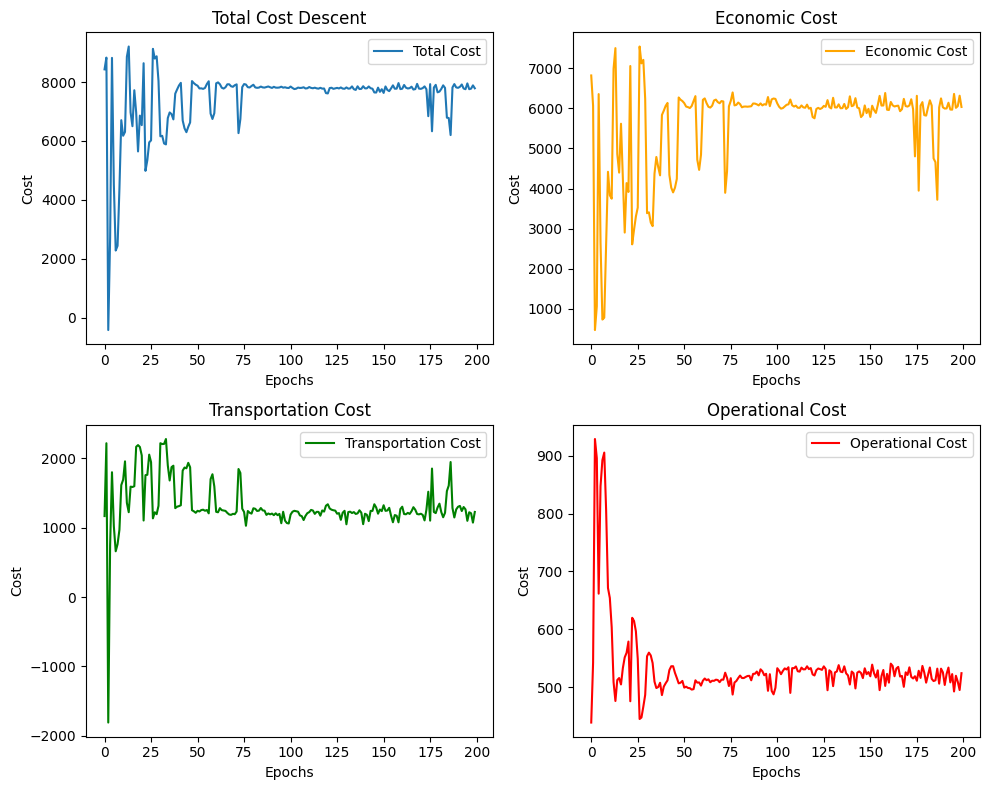

In [67]:
if not load_model:
    # Plotting the results
    plt.figure(figsize=(10, 8))

    # Plot total cost
    plt.subplot(2, 2, 1)
    plt.plot(total_costs, label="Total Cost")
    plt.title("Total Cost Descent")
    plt.xlabel("Epochs")
    plt.ylabel("Cost")
    plt.legend()

    # Plot economic cost
    plt.subplot(2, 2, 2)
    plt.plot(economic_costs, label="Economic Cost", color='orange')
    plt.title("Economic Cost")
    plt.xlabel("Epochs")
    plt.ylabel("Cost")
    plt.legend()

    # Plot transportation cost
    plt.subplot(2, 2, 3)
    plt.plot(transportation_costs, label="Transportation Cost", color='green')
    plt.title("Transportation Cost")
    plt.xlabel("Epochs")
    plt.ylabel("Cost")
    plt.legend()

    # Plot operational cost
    plt.subplot(2, 2, 4)
    plt.plot(operational_costs, label="Operational Cost", color='red')
    plt.title("Operational Cost")
    plt.xlabel("Epochs")
    plt.ylabel("Cost")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [68]:
# load_model = False
if load_model:
    dfl_model_save_path = WEIGHTS_PATH + 'wind_sir_model_dfl_epoch_200_cost_100.pth'
    # To load the model parameters later
    # Create a new instance of the model (make sure the model architecture is the same)
    # beta_gamma_nn_loaded = BetaGammaNN(input_size, hidden_size, num_cities)
    # wind_sir_model_loaded = WindSIRModel(beta_gamma_nn_loaded, wind_speeds, time_points)
    # beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

    # # Initialize the WindSIRModel
    # wind_sir_model_dfl = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
    # # Load the saved state dictionary into the model
    # wind_sir_model_dfl.load_state_dict(torch.load(model_save_path))
    # print("Model loaded from", model_save_path)
else:
    # Save the model parameters after MSE training
    dfl_model_save_path = WEIGHTS_PATH + 'wind_sir_model_dfl_epoch_200_cost_{}.pth'.format(transport_cost_per_gen)
    torch.save(wind_sir_model.state_dict(), dfl_model_save_path)
    # print(f"Model saved to {model_save_path}")

beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# Initialize the WindSIRModel
wind_sir_model_dfl = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
# Load the saved state dictionary into the model
wind_sir_model_dfl.load_state_dict(torch.load(dfl_model_save_path))
print("Model loaded from", dfl_model_save_path)


Model loaded from weights/wind_sir_model_dfl_epoch_200_cost_100.pth


In [69]:
beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# Initialize the WindSIRModel
wind_sir_model = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
# Load the saved state dictionary into the model
wind_sir_model.load_state_dict(torch.load(model_save_path))
print("Model loaded from", model_save_path)

Model loaded from weights/wind_sir_model_epochs_2000_seed_0.pth


In [70]:
# model_save_path = 'wind_sir_model_dfl.pth'
# # To load the model parameters later
# # Create a new instance of the model (make sure the model architecture is the same)
# # beta_gamma_nn_loaded = BetaGammaNN(input_size, hidden_size, num_cities)
# # wind_sir_model_loaded = WindSIRModel(beta_gamma_nn_loaded, wind_speeds, time_points)
# beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# # Initialize the WindSIRModel
# wind_sir_model = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
# # Load the saved state dictionary into the model
# wind_sir_model.load_state_dict(torch.load(model_save_path))
# print("Model loaded from", model_save_path)

In [71]:
pred_outages = odeint(wind_sir_model_dfl, initial_conditions, time_points)
Y_pred = pred_outages[:,:,1]

In [72]:
pred_outages[:,:,1].shape

torch.Size([100, 3])

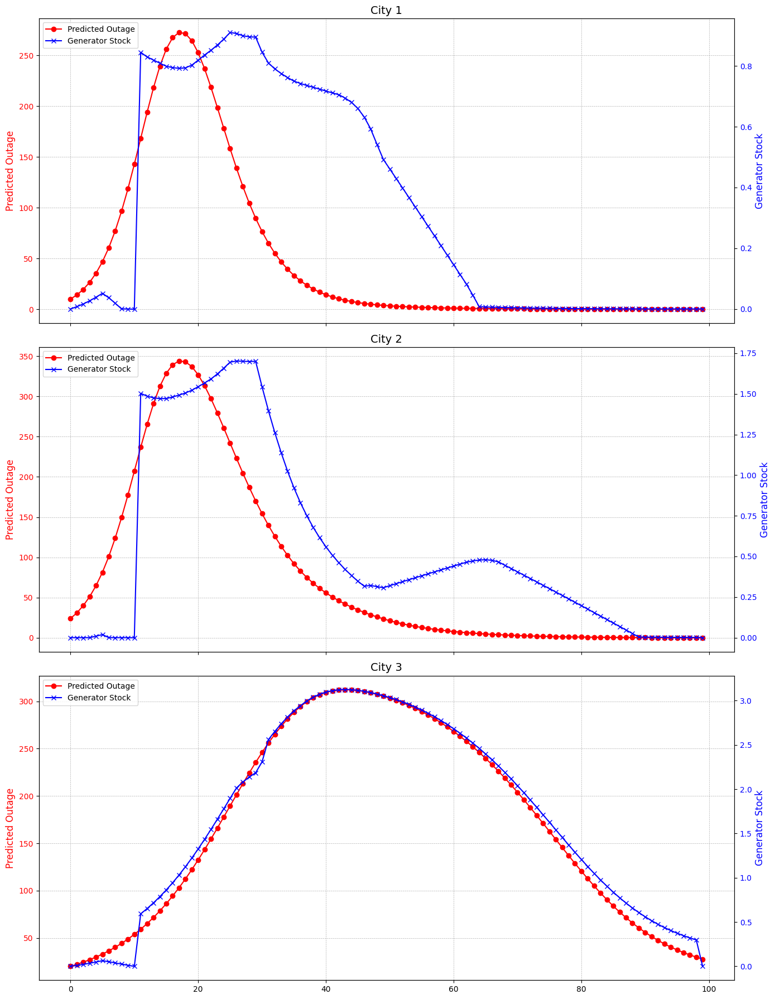

In [73]:
# Call the new plotting function
# Convert Y_pred to NumPy for plotting
Y_pred_np = pred_outages[:,:,1].detach().numpy()
plot_Y_pred_and_q(Y_pred_np, q_np, num_cities)

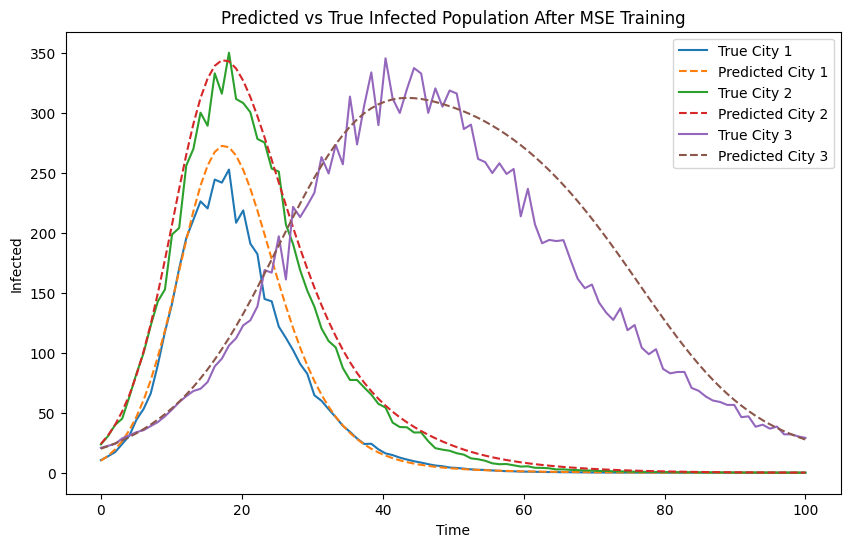

In [74]:
# Plot predictions vs true data after MSE training
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), synthetic_outages_noisy[:, city, 1].numpy(), label=f"True City {city+1}")
    plt.plot(time_points.numpy(), pred_outages[:, city, 1].detach().numpy(), linestyle='--', label=f"Predicted City {city+1}")
plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("Predicted vs True Infected Population After MSE Training")
plt.show()

Plot saved to plots/city_1_MSE_Post_DFL_test.pdf


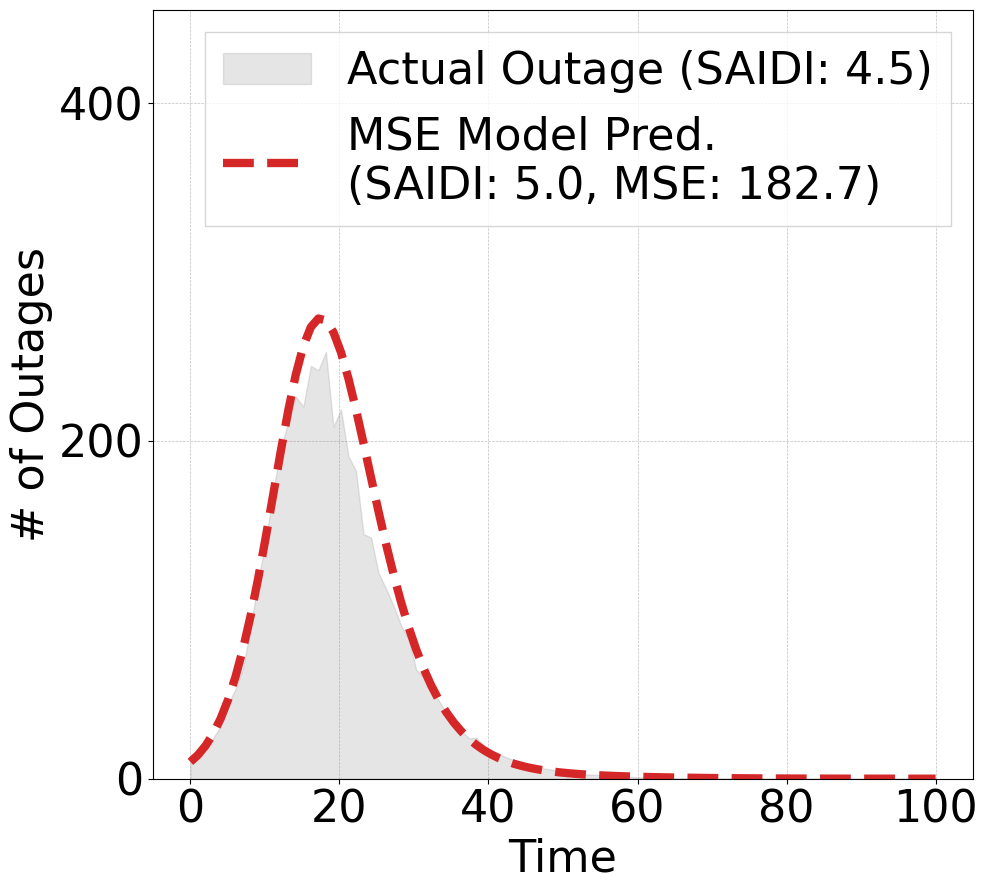

Plot saved to plots/city_2_MSE_Post_DFL_test.pdf


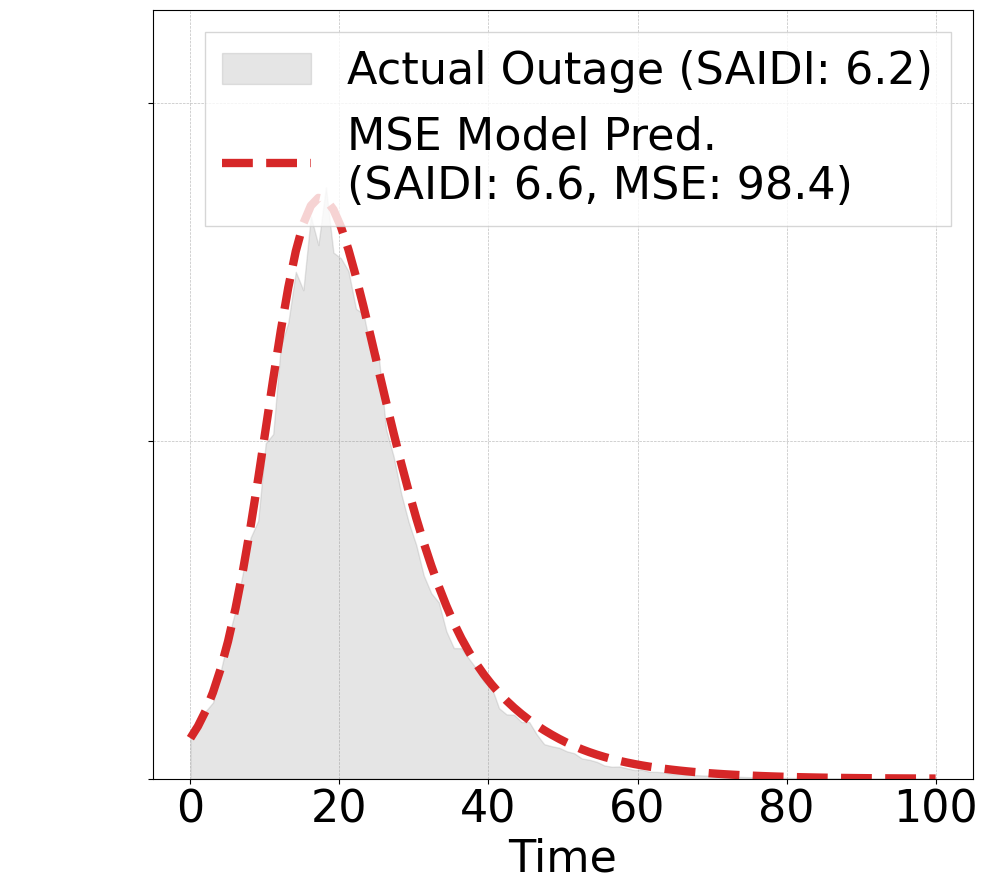

Plot saved to plots/city_3_MSE_Post_DFL_test.pdf


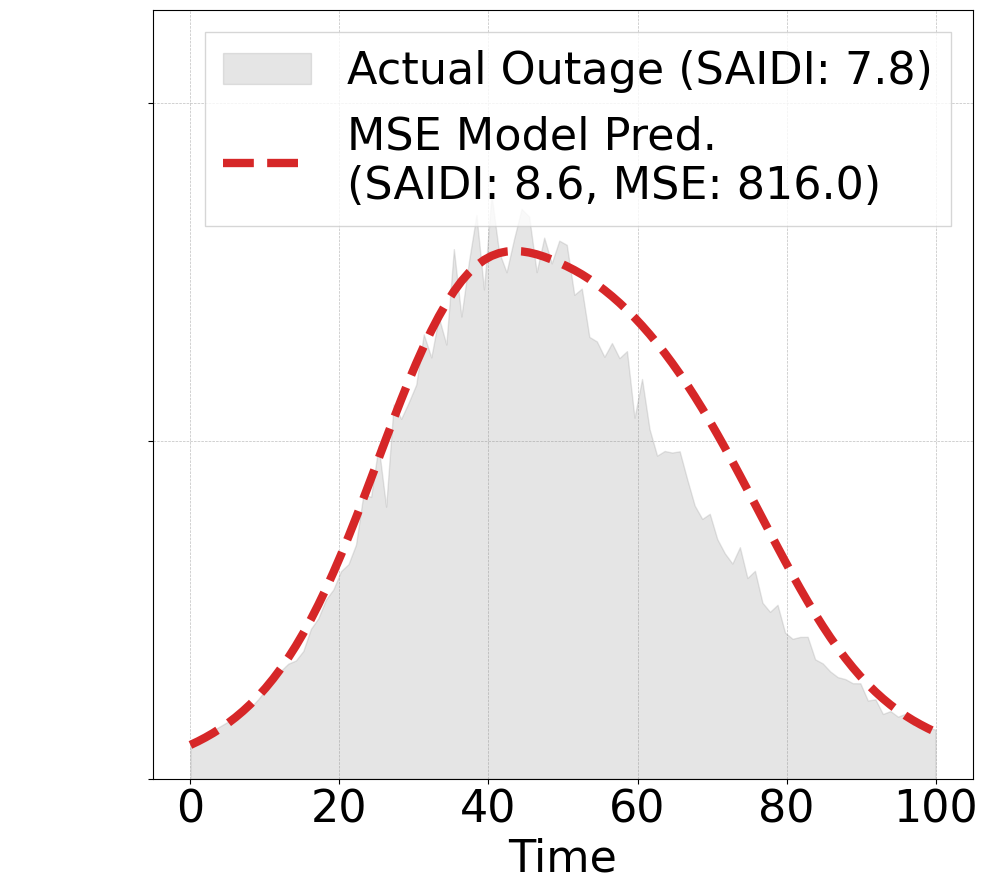

In [75]:
# Plot predictions vs true data after MSE training using the function
pred_outages = odeint(wind_sir_model_dfl, initial_conditions, time_points)
plot_predictions(time_points, synthetic_outages_noisy, pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE_Post_DFL_test", save_path = PLOT_PATH)

In [76]:
# model_save_path = 'wind_sir_model_2000.pth'
# # To load the model parameters later
# # Create a new instance of the model (make sure the model architecture is the same)
# # beta_gamma_nn_loaded = BetaGammaNN(input_size, hidden_size, num_cities)
# # wind_sir_model_loaded = WindSIRModel(beta_gamma_nn_loaded, wind_speeds, time_points)
# beta_gamma_nn = BetaGammaNN(input_size, hidden_size, num_cities)

# # Initialize the WindSIRModel
# wind_sir_model = WindSIRModel(beta_gamma_nn, wind_speeds, time_points)
# # Load the saved state dictionary into the model
# wind_sir_model.load_state_dict(torch.load(model_save_path))
# print("Model loaded from", model_save_path)

In [77]:
# Predict outages using the SIR model
pred_outages = odeint(wind_sir_model_dfl, initial_conditions, time_points)
pred_outages = pred_outages.float()  # Ensure proper dtype

Y_pred_dfl = pred_outages[:,:,1]
Y_true = synthetic_outages_noisy_gdp
Y_true_np = Y_true.detach().numpy()

# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $2349.02
  Transportation Cost: $158.31
  Operational Cost: $67.99

City 2:
  Economic Cost: $3043.71
  Transportation Cost: $341.39
  Operational Cost: $113.02

City 3:
  Economic Cost: $603.95
  Transportation Cost: $733.18
  Operational Cost: $335.45

=== Total Costs ===
Total Economic Cost: $5996.68
Total Transportation Cost: $1232.88
Total Operational Cost: $516.46
Sum of All Costs: $7746.03


/Users/ryanchen/miniconda3/envs/dfl/lib/python3.12/site-packages/diffcp/cone_program.py:295: UserWarning: Solved/Inaccurate.
  warnings.warn("Solved/Inaccurate.")


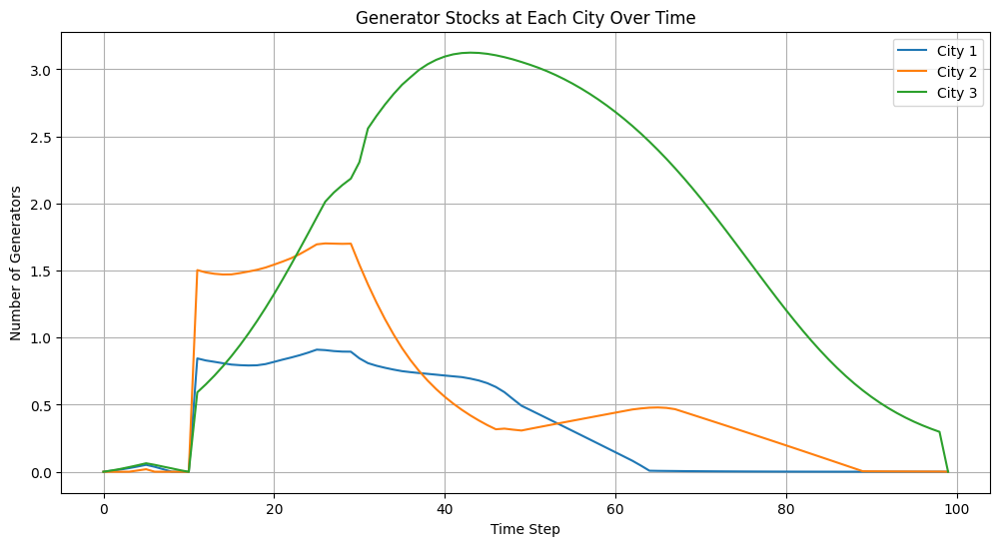

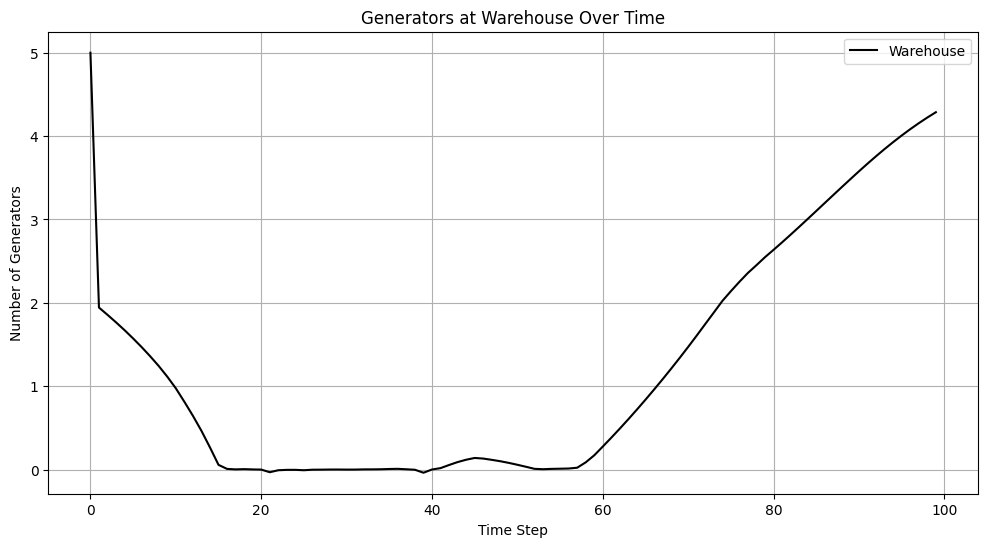

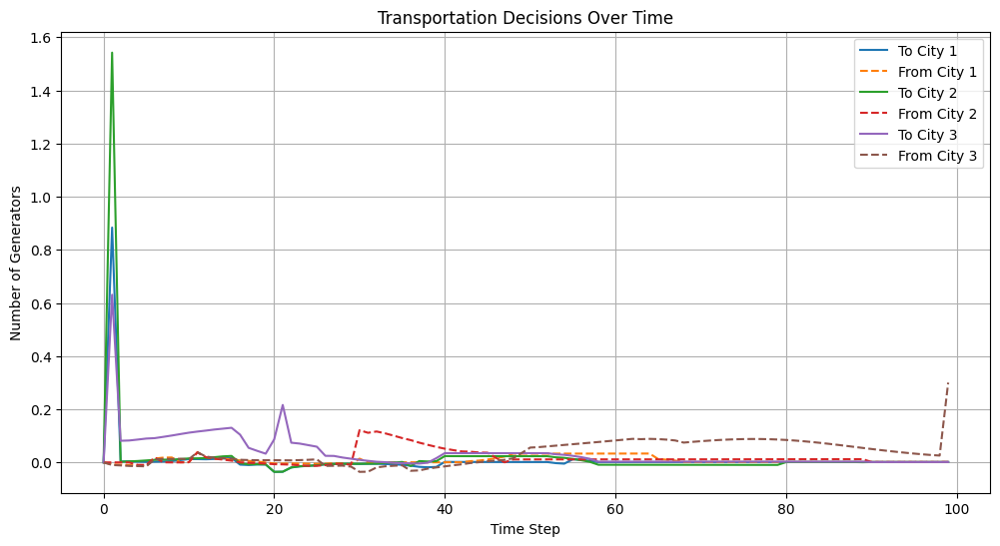

In [78]:
# Example usage with the previously obtained optimization results
plot_results(x_to_np, x_back_np, s_w_np, q_np, num_cities)

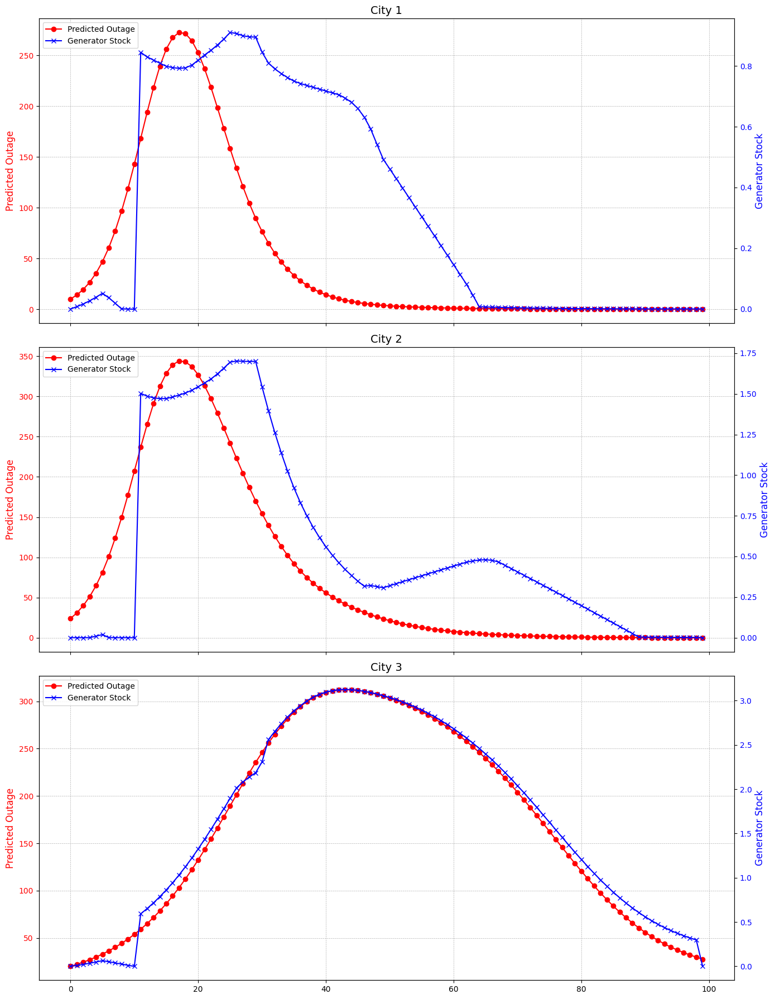

In [79]:
# Call the new plotting function
plot_Y_pred_and_q(Y_pred_np, q_np, num_cities)

In [80]:
# Predict outages using the SIR model
pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
pred_outages = pred_outages.float()  # Ensure proper dtype

Y_pred = pred_outages[:,:,1]
Y_true = synthetic_outages_noisy_gdp
Y_true_np = Y_true.detach().numpy()

# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $2706.02
  Transportation Cost: $101.41
  Operational Cost: $48.47

City 2:
  Economic Cost: $2395.34
  Transportation Cost: $420.94
  Operational Cost: $108.11

City 3:
  Economic Cost: $1721.34
  Transportation Cost: $646.15
  Operational Cost: $282.28

=== Total Costs ===
Total Economic Cost: $6822.69
Total Transportation Cost: $1168.50
Total Operational Cost: $438.86
Sum of All Costs: $8430.06


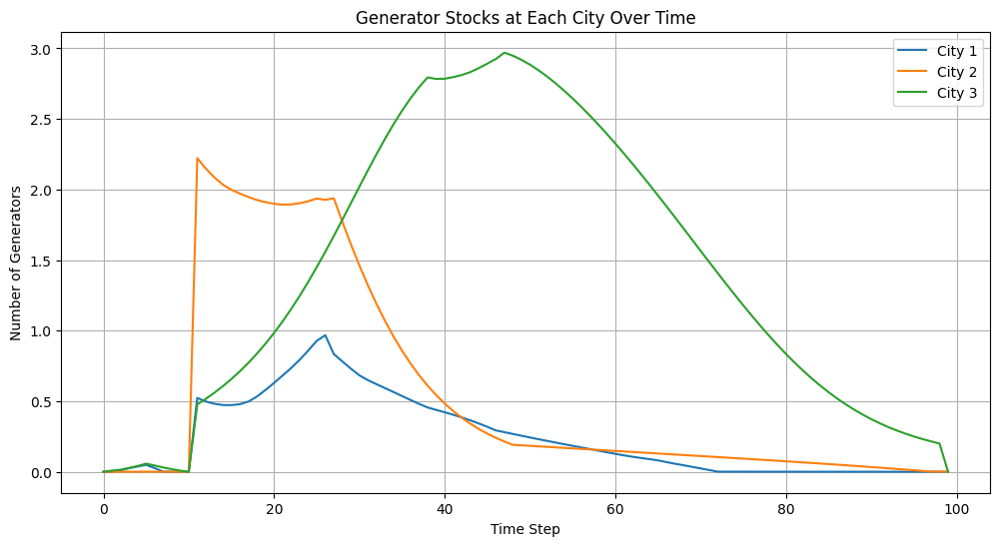

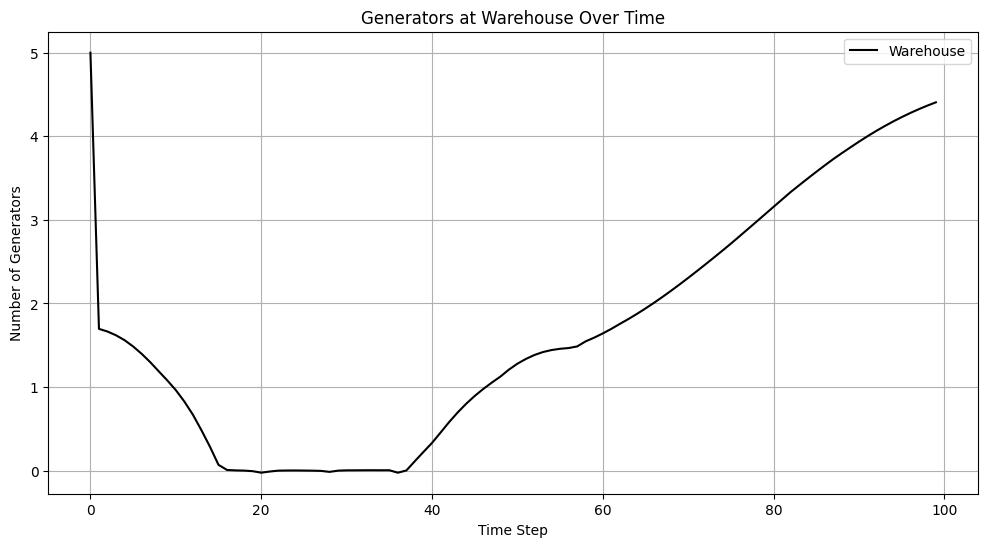

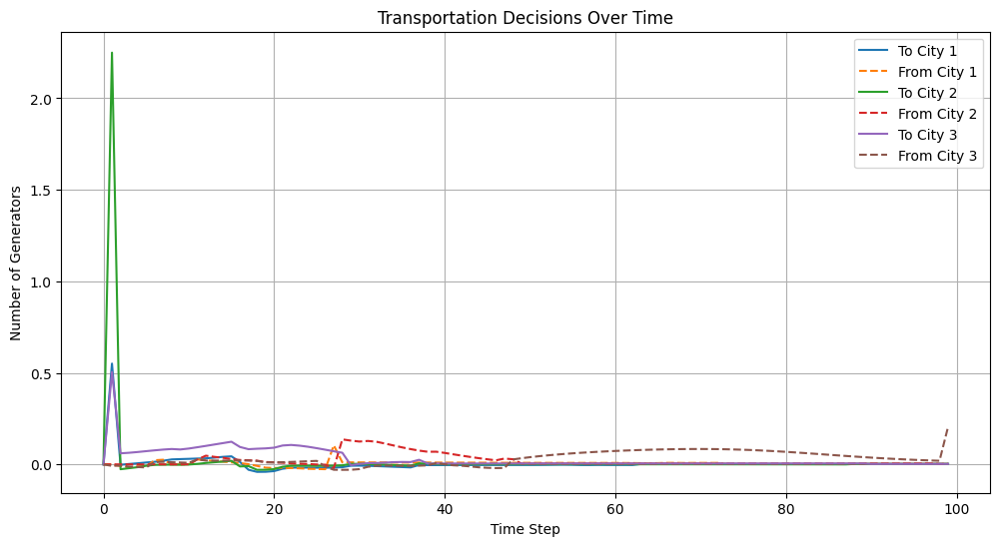

In [81]:
# Example usage with the previously obtained optimization results
plot_results(x_to_np, x_back_np, s_w_np, q_np, num_cities)

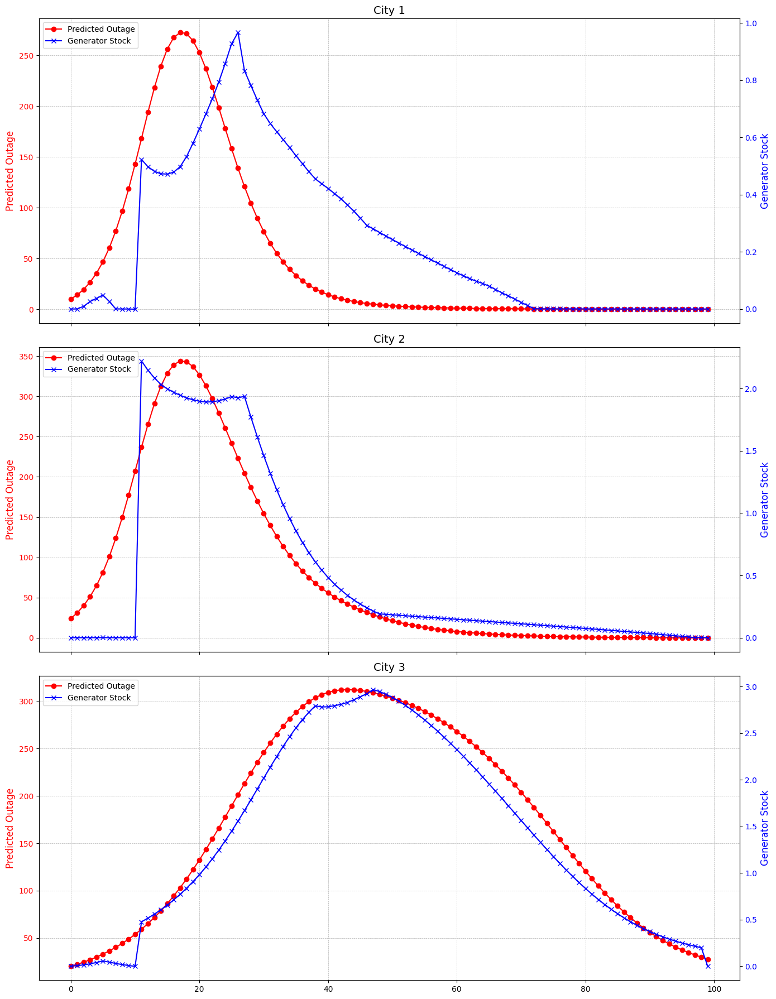

In [82]:
# Call the new plotting function
plot_Y_pred_and_q(Y_pred_np, q_np, num_cities)

In [83]:
# Predict outages using the SIR model

# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_true)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $2504.96
  Transportation Cost: $151.96
  Operational Cost: $46.38

City 2:
  Economic Cost: $2609.76
  Transportation Cost: $414.10
  Operational Cost: $117.87

City 3:
  Economic Cost: $691.95
  Transportation Cost: $758.98
  Operational Cost: $299.94

=== Total Costs ===
Total Economic Cost: $5806.67
Total Transportation Cost: $1325.04
Total Operational Cost: $464.19
Sum of All Costs: $7595.90


In [84]:
pred_outages_dfl = odeint(wind_sir_model_dfl, initial_conditions, time_points)
pred_outages = odeint(wind_sir_model, initial_conditions, time_points)

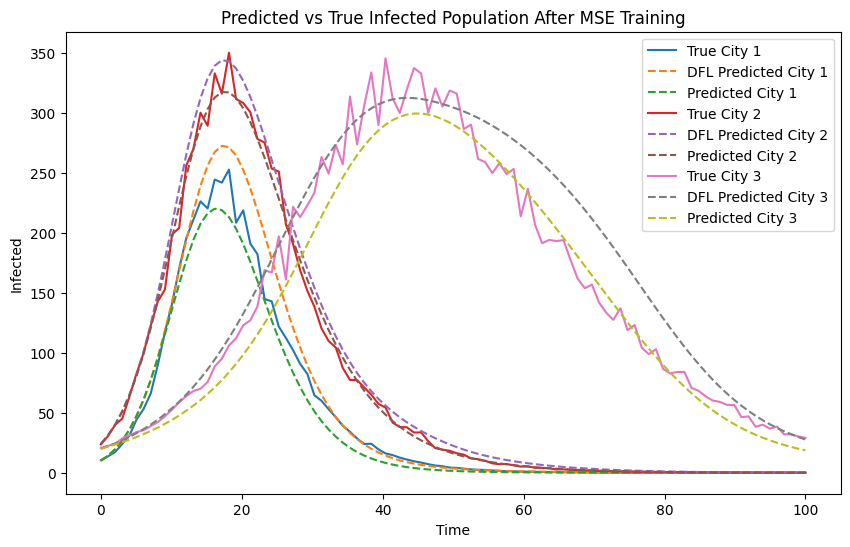

In [85]:
# Plot predictions vs true data after MSE training
plt.figure(figsize=(10, 6))
for city in range(num_cities):
    plt.plot(time_points.numpy(), synthetic_outages_noisy[:, city, 1].numpy(), label=f"True City {city+1}")
    plt.plot(time_points.numpy(), pred_outages_dfl[:, city, 1].detach().numpy(), linestyle='--', label=f"DFL Predicted City {city+1}")
    plt.plot(time_points.numpy(), pred_outages[:, city, 1].detach().numpy(), linestyle='--', label=f"Predicted City {city+1}")

plt.xlabel("Time")
plt.ylabel("Infected")
plt.legend()
plt.title("Predicted vs True Infected Population After MSE Training")
plt.show()

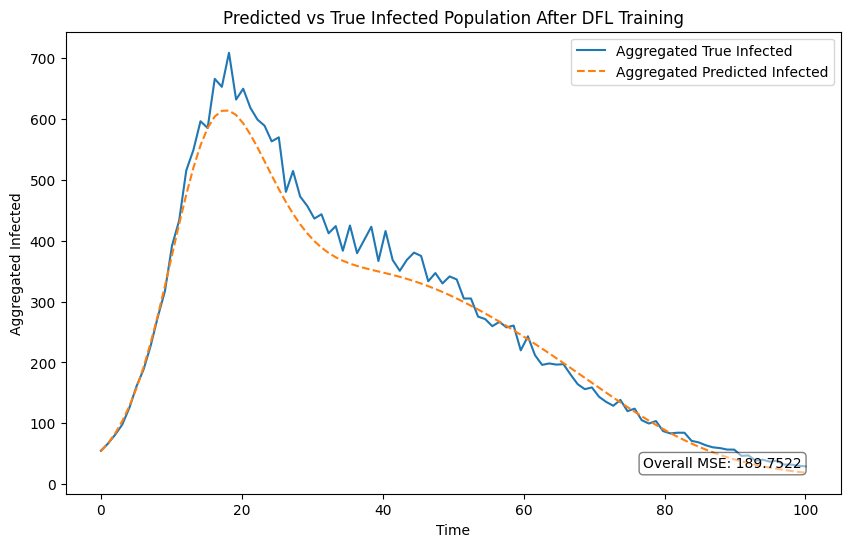

In [86]:
plot_aggregated_predictions(time_points, synthetic_outages_noisy, pred_outages, num_cities = num_cities, title="Predicted vs True Infected Population After DFL Training")

In [87]:
def plot_predictions_with_comparison(
    time_points, synthetic_outages, pred_outages, pred_outages_alt, customer_tensor, city_indices, save_flag=True, filename_suffix="", align_y=True, save_path = PLOT_PATH):
    """
    Plots the true and predicted outages for each city, highlighting areas where predictions overestimate or underestimate the actual outages.
    Adds another predicted outage line for comparison.
    Saves each plot as a PDF file.

    Args:
        time_points (torch.tensor): Time points used in simulation.
        synthetic_outages (torch.tensor): True outage data. Shape: (len(time_points), num_cities, 3)
        pred_outages (torch.tensor): First predicted outage data. Shape: (len(time_points), num_cities, 3)
        pred_outages_alt (torch.tensor): Alternative predicted outage data for comparison. Shape: (len(time_points), num_cities, 3)
        customer_tensor (torch.tensor): Total customers for each city. Shape: (num_cities,)
        city_indices (list): List of city indices to plot.
        save_flag (bool): Whether to save the plots. Defaults to True.
        filename_suffix (str): Suffix to append to the filename. Defaults to "".
        align_y (bool): Whether to align the y-axis across all plots. Defaults to True.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Determine the global maximum outage value across all cities if alignment is desired
    if align_y:
        outage_true_all = synthetic_outages[:, city_indices, 1]
        outage_pred_all = pred_outages[:, city_indices, 1]
        outage_pred_alt_all = pred_outages_alt[:, city_indices, 1]
        max_outage_true = torch.max(outage_true_all).item()
        max_outage_pred = torch.max(outage_pred_all).item()
        max_outage_pred_alt = torch.max(outage_pred_alt_all).item()
        global_max = max(max_outage_true, max_outage_pred, max_outage_pred_alt)
        y_max = global_max * 1.3  # Adding 30% padding for better visualization

    for idx, city in enumerate(city_indices):
        # Extract data for the city
        time = time_points.numpy()
        outage_true = synthetic_outages[:, city, 1].numpy()
        outage_pred = pred_outages[:, city, 1].detach().numpy()
        outage_pred_alt = pred_outages_alt[:, city, 1].detach().numpy()
        customer = customer_tensor[city].item()

        # Calculate SAIDI and MSE
        saidi_true = np.sum(outage_true) / customer
        saidi_pred = np.sum(outage_pred) / customer
        saidi_pred_alt = np.sum(outage_pred_alt) / customer
        mse_value = np.mean((outage_pred - outage_true) ** 2)
        mse_value_alt = np.mean((outage_pred_alt - outage_true) ** 2)

        # Determine y-axis maximum for the current plot
        if not align_y:
            current_max = max(np.max(outage_true), np.max(outage_pred), np.max(outage_pred_alt))
            y_max_current = current_max * 1.1  # Adding 10% padding
        else:
            y_max_current = y_max

        # Create the plot
        plt.figure(figsize=(10, 9))

        # Plot true outages
        plt.fill_between(
            time,
            outage_true,
            color="grey",
            alpha=0.2,
            label=f"Actual Outage (SAIDI: {saidi_true:.1f})",
        )

        # Plot first predicted outages
        plt.plot(
            time,
            outage_pred,
            label=f"Model 1 Pred.\n(SAIDI: {saidi_pred:.1f}, MSE: {mse_value:.1f})",
            linewidth=6,
            linestyle="--",
            color="tab:red",
        )

        # Plot alternative predicted outages
        plt.plot(
            time,
            outage_pred_alt,
            label=f"Model 2 Pred.\n(SAIDI: {saidi_pred_alt:.1f}, MSE: {mse_value_alt:.1f})",
            linewidth=6,
            linestyle=":",
            color="blue",
        )

        # Set labels and ticks
        plt.xlabel("Time", fontsize=32)
        plt.ylabel("# of Outages", fontsize=32)
        plt.xticks(fontsize=32)
        plt.yticks(fontsize=32)

        # Set y-axis limit
        plt.ylim(0, y_max_current)

        # Add grid
        plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="grey", alpha=0.5)

        # Add legend
        plt.legend(fontsize=24, loc="upper right", fancybox=True)

        # Tight layout to minimize white space
        plt.tight_layout()

        # Save the plot
        if save_flag:
            filename = save_path + f"city_{city + 1}_{filename_suffix}.pdf"
            plt.savefig(filename, format="pdf", dpi=300, bbox_inches="tight")
            print(f"Plot saved to {filename}")

        # Show the plot
        plt.show()

        # Close the figure to free memory
        plt.close()


Plot saved to plots/city_1_Comparison_train.pdf


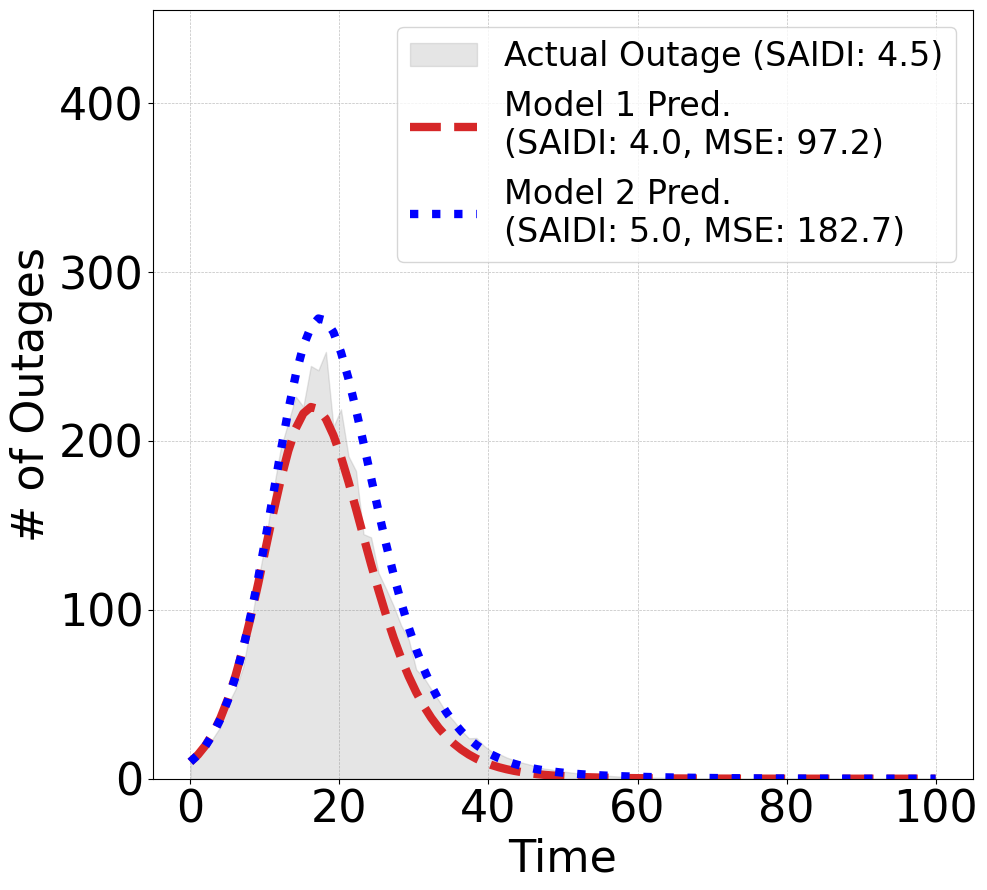

Plot saved to plots/city_2_Comparison_train.pdf


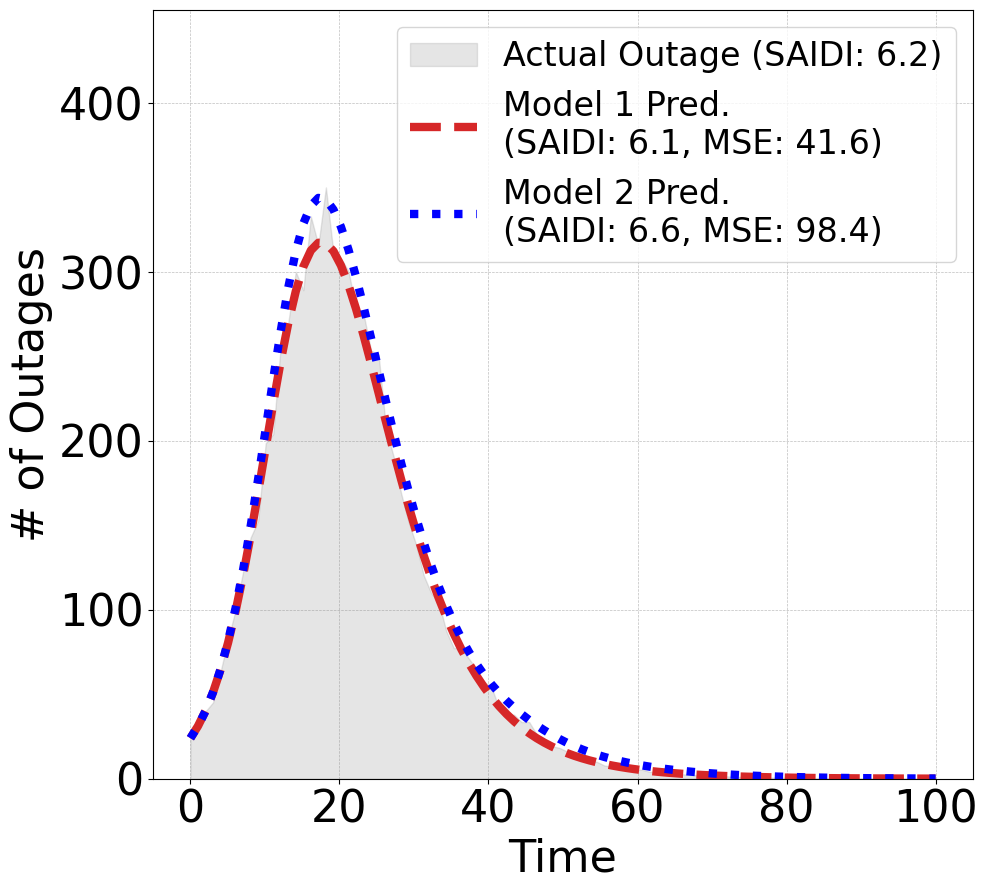

Plot saved to plots/city_3_Comparison_train.pdf


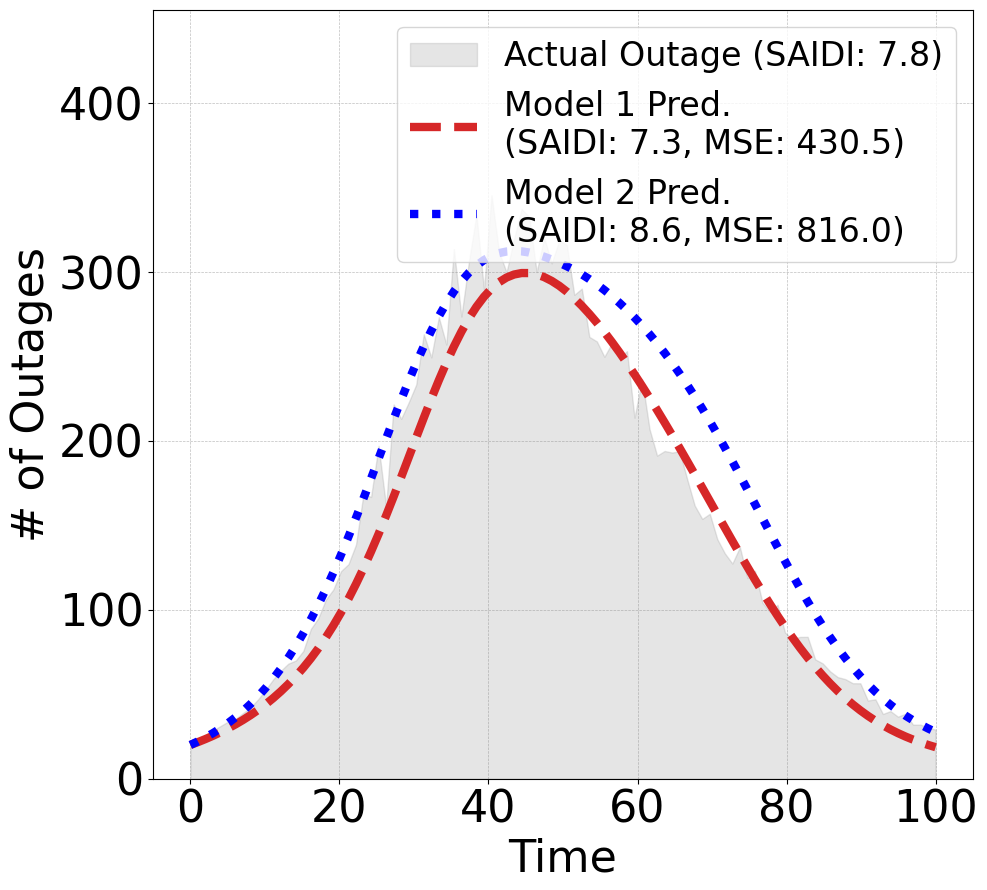

In [88]:
# Plot predictions vs true data after MSE training using the function
plot_predictions_with_comparison(time_points, synthetic_outages_noisy, pred_outages, pred_outages_dfl, customer_tensor, city_indices=range(num_cities), filename_suffix="Comparison_train", save_path = PLOT_PATH)

Plot saved to plots/city_1_Comparison_test.pdf


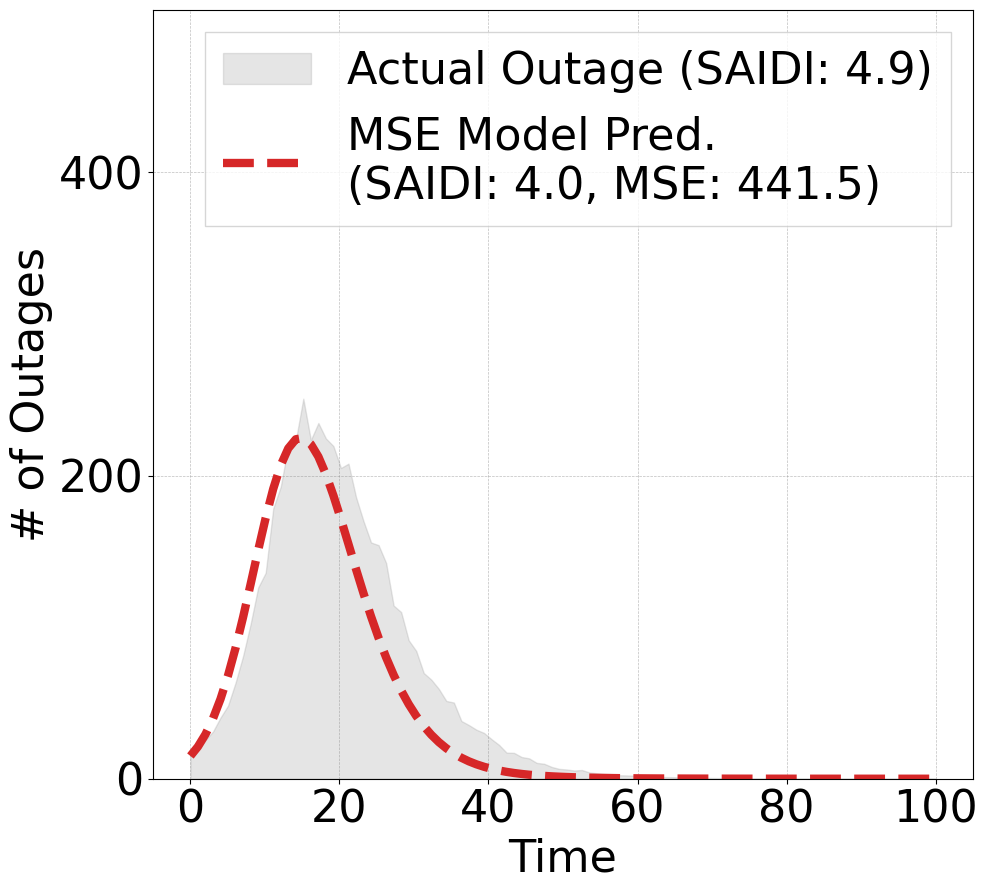

Plot saved to plots/city_2_Comparison_test.pdf


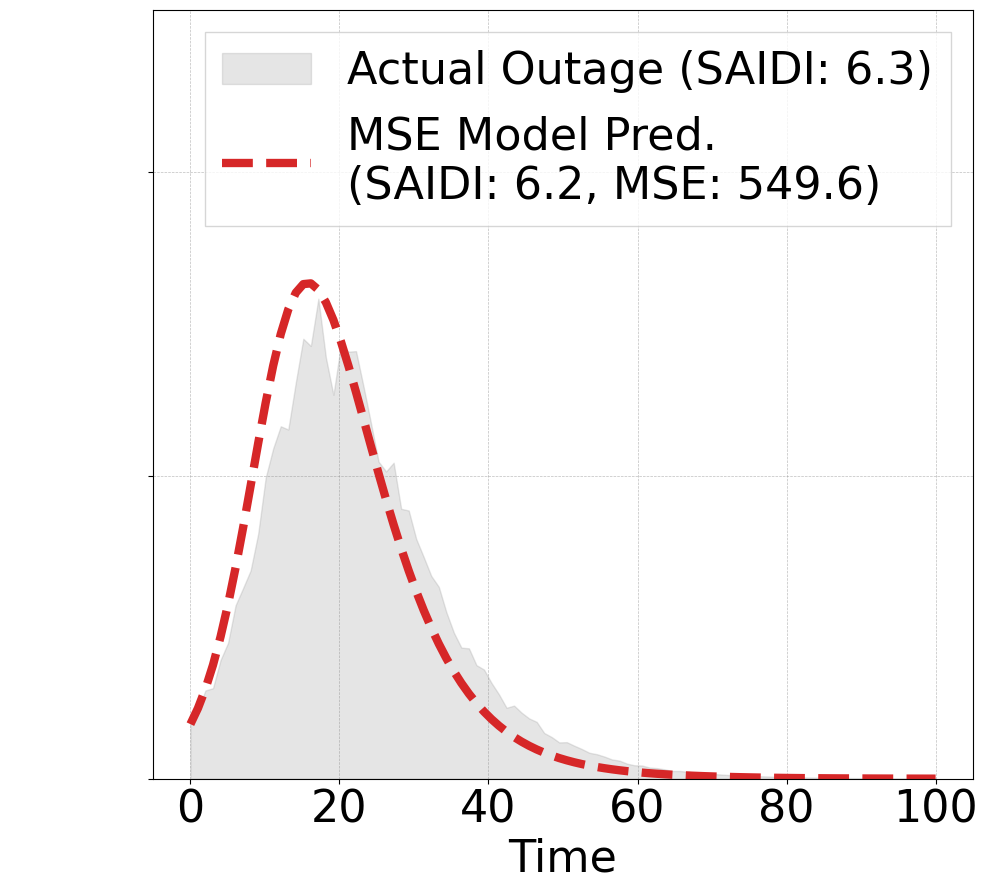

Plot saved to plots/city_3_Comparison_test.pdf


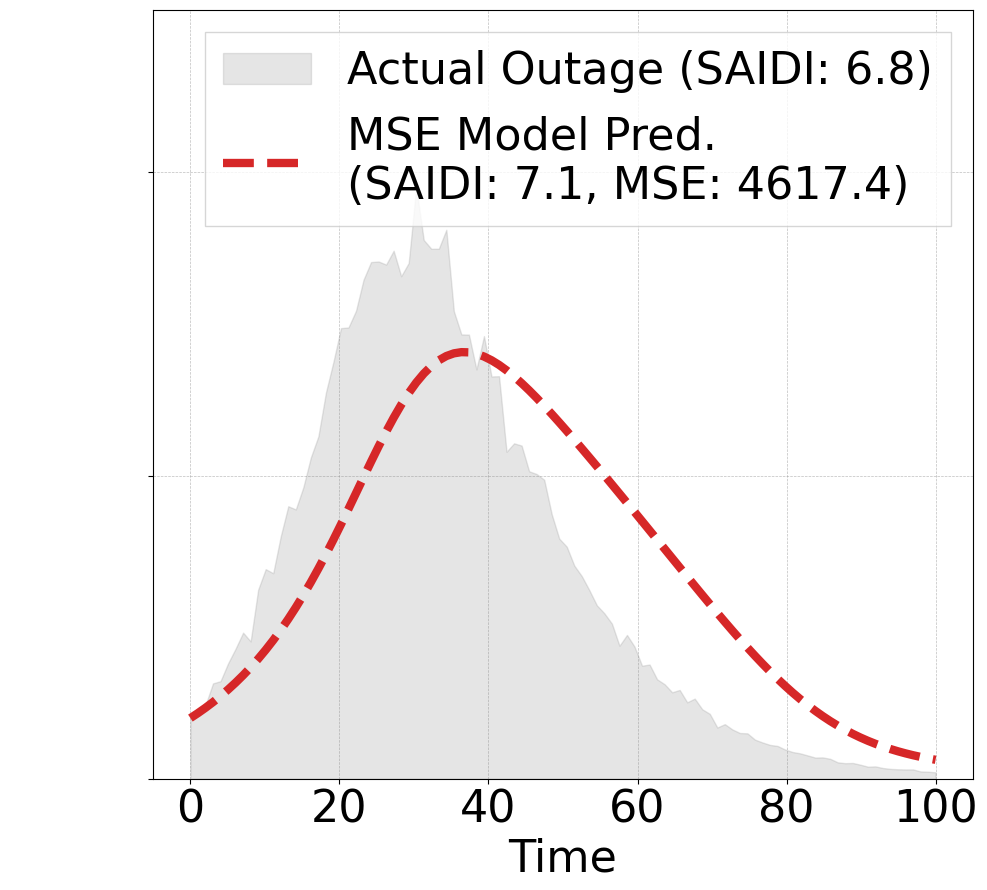

In [89]:
# Plot predictions vs true data after MSE training using the function
plot_predictions(time_points, test_synthetic_outages_noisy, test_pred_outages, customer_tensor, city_indices=range(num_cities), filename_suffix="Comparison_test", save_path = PLOT_PATH)

In [90]:
from gurobipy import Model, GRB, quicksum
import numpy as np

def solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, Y_pred):
    """
    Solves the GDP problem using Gurobi with discrete decision variables.

    Args:
        tau (float): Penalty for unmet generator demand.
        N_g (float): Maximum generators supplied per city.
        transport_cost_per_gen (float): Transportation cost per generator.
        gamma (float): Operational cost coefficient.
        G_initial (int): Initial number of generators in the warehouse.
        num_cities (int): Number of cities.
        outage_duration (int): Duration of the outages.
        Y_pred (np.ndarray): Predicted outages (outage_duration x num_cities).

    Returns:
        dict: Solution with keys 'x_to', 'x_back', 's_w', 'q', and 'objective'.
    """
    model = Model("GDP_Discrete")

    # Decision variables
    x_to = model.addVars(outage_duration, num_cities, lb = 0, vtype=GRB.INTEGER, name="x_to")
    x_back = model.addVars(outage_duration, num_cities, lb = 0, vtype=GRB.INTEGER, name="x_back")
    q = model.addVars(outage_duration, num_cities, vtype=GRB.INTEGER, name="q")
    s_w = model.addVars(outage_duration, vtype=GRB.INTEGER, name="s_w")
    # Auxiliary variables to represent the positive part
    z = model.addVars(outage_duration, num_cities, vtype=GRB.CONTINUOUS, name="z")

    # Constraints
    # Initial conditions
    model.addConstr(s_w[0] == G_initial, name="initial_warehouse_stock")
    for i in range(num_cities):
        model.addConstr(q[0, i] == 0, name=f"initial_city_stock_{i}")

    # Inventory balance constraints
    for t in range(1, outage_duration):
        # Warehouse inventory balance
        model.addConstr(
            s_w[t] == s_w[t - 1] - quicksum(x_to[t, i] for i in range(num_cities)) + quicksum(x_back[t, i] for i in range(num_cities)),
            name=f"warehouse_balance_{t}"
        )
        # City inventory balance
        for i in range(num_cities):
            model.addConstr(
                q[t, i] == q[t - 1, i] + x_to[t, i] - x_back[t, i],
                name=f"city_balance_{t}_{i}"
            )

    # Flow conservation constraints
    for i in range(num_cities):
        model.addConstr(quicksum(x_to[t, i] for t in range(outage_duration)) == quicksum(x_back[t, i] for t in range(outage_duration)),
                        name=f"flow_conservation_{i}")

    # Constraints for the positive part
    for t in range(outage_duration):
        for i in range(num_cities):
            model.addConstr(z[t, i] >= Y_pred[t, i] - N_g * q[t, i], name=f"pos_part_constraint1_{t}_{i}")
            model.addConstr(z[t, i] >= 0, name=f"pos_part_constraint2_{t}_{i}") # Ensure z is non-negative


    # Objective function
    economic_cost = tau * quicksum(z[t, i] for t in range(outage_duration) for i in range(num_cities)) # Sum over the auxiliary variable
    transportation_cost = transport_cost_per_gen * quicksum(x_to[t, i] + x_back[t, i] for t in range(outage_duration) for i in range(num_cities))
    operational_cost = gamma * quicksum(q[t, i] for t in range(outage_duration) for i in range(num_cities))

    total_cost = economic_cost + transportation_cost + operational_cost

    model.setObjective(total_cost, GRB.MINIMIZE)

    # Solve the problem
    model.optimize()

    # Extract the solution
    if model.status == GRB.OPTIMAL:
        solution = {
            "x_to": np.array([[x_to[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "x_back": np.array([[x_back[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "s_w": np.array([s_w[t].x for t in range(outage_duration)]),
            "q": np.array([[q[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "objective": model.objVal
        }
        return solution
    else:
        raise ValueError("Optimization problem did not converge.")

In [91]:
def solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, delta_t, Y_pred):
    """
    Solves the GDP problem using Gurobi with discrete decision variables and a delivery delay parameter.

    Args:
        tau (float): Penalty for unmet generator demand.
        N_g (float): Maximum generators supplied per city.
        transport_cost_per_gen (float): Transportation cost per generator.
        gamma (float): Operational cost coefficient.
        G_initial (int): Initial number of generators in the warehouse.
        num_cities (int): Number of cities.
        outage_duration (int): Duration of the outages.
        delta_t (int): Delivery delay (in time steps) for generator dispatch.
        Y_pred (np.ndarray): Predicted outages (outage_duration x num_cities).

    Returns:
        dict: Solution with keys 'x_to', 'x_back', 's_w', 'q', and 'objective'.
    """
    model = Model("GDP_Discrete")

    # Decision variables
    x_to = model.addVars(outage_duration, num_cities, lb=0, vtype=GRB.INTEGER, name="x_to")
    x_back = model.addVars(outage_duration, num_cities, lb=0, vtype=GRB.INTEGER, name="x_back")
    q = model.addVars(outage_duration, num_cities, vtype=GRB.INTEGER, name="q")
    s_w = model.addVars(outage_duration, vtype=GRB.INTEGER, name="s_w")
    # Auxiliary variables to represent the positive part of unmet demand
    z = model.addVars(outage_duration, num_cities, vtype=GRB.CONTINUOUS, name="z")

    # Initial conditions
    model.addConstr(s_w[0] == G_initial, name="initial_warehouse_stock")
    for i in range(num_cities):
        model.addConstr(q[0, i] == 0, name=f"initial_city_stock_{i}")
        # Optional: enforce no dispatch at t=0
        model.addConstr(x_to[0, i] == 0, name=f"initial_dispatch_{i}")
        model.addConstr(x_back[0, i] == 0, name=f"initial_return_{i}")

    # Inventory balance constraints for the warehouse
    for t in range(1, outage_duration):
        model.addConstr(
            s_w[t] == s_w[t - 1] - quicksum(x_to[t, i] for i in range(num_cities)) + quicksum(x_back[t, i] for i in range(num_cities)),
            name=f"warehouse_balance_{t}"
        )
        
    # City inventory balance constraints with delivery delay
    for t in range(1, outage_duration):
        for i in range(num_cities):
            if t < delta_t:
                # Before the delivery delay has elapsed, no dispatched generators have arrived
                model.addConstr(
                    q[t, i] == q[t - 1, i] - x_back[t, i],
                    name=f"city_balance_{t}_{i}"
                )
            else:
                # After delta_t time steps, generators dispatched at t-delta_t arrive at the city
                model.addConstr(
                    q[t, i] == q[t - 1, i] + x_to[t - delta_t, i] - x_back[t, i],
                    name=f"city_balance_{t}_{i}"
                )

    # Flow conservation constraints for each city
    for i in range(num_cities):
        model.addConstr(
            quicksum(x_to[t, i] for t in range(outage_duration)) == quicksum(x_back[t, i] for t in range(outage_duration)),
            name=f"flow_conservation_{i}"
        )

    # Constraints for the positive part of unmet demand
    for t in range(outage_duration):
        for i in range(num_cities):
            model.addConstr(
                z[t, i] >= Y_pred[t, i] - N_g * q[t, i],
                name=f"pos_part_constraint1_{t}_{i}"
            )
            model.addConstr(
                z[t, i] >= 0,
                name=f"pos_part_constraint2_{t}_{i}"
            )

    # Objective function components
    economic_cost = tau * quicksum(z[t, i] for t in range(outage_duration) for i in range(num_cities))
    transportation_cost = transport_cost_per_gen * quicksum(x_to[t, i] + x_back[t, i] for t in range(outage_duration) for i in range(num_cities))
    operational_cost = gamma * quicksum(q[t, i] for t in range(outage_duration) for i in range(num_cities))
    total_cost = economic_cost + transportation_cost + operational_cost

    model.setObjective(total_cost, GRB.MINIMIZE)

    # Solve the optimization problem
    model.optimize()

    # Extract and return the solution if optimal
    if model.status == GRB.OPTIMAL:
        solution = {
            "x_to": np.array([[x_to[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "x_back": np.array([[x_back[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "s_w": np.array([s_w[t].x for t in range(outage_duration)]),
            "q": np.array([[q[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "objective": model.objVal
        }
        return solution
    else:
        raise ValueError("Optimization problem did not converge.")

# Example of solving the optimization problem with the updated Gurobi solver:
# solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, delta_t, Y_pred)


In [92]:
def solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, delta_t, Y_pred):
    """
    Solves the GDP problem using Gurobi with discrete decision variables and a delivery delay parameter.

    Args:
        tau (float): Penalty for unmet generator demand.
        N_g (float): Maximum generators supplied per city.
        transport_cost_per_gen (float): Transportation cost per generator.
        gamma (float): Operational cost coefficient.
        G_initial (int): Initial number of generators in the warehouse.
        num_cities (int): Number of cities.
        outage_duration (int): Duration of the outages.
        delta_t (int): Delivery delay (in time steps) for generator dispatch.
        Y_pred (np.ndarray): Predicted outages (outage_duration x num_cities).

    Returns:
        dict: Solution with keys 'x_to', 'x_back', 's_w', 'q', and 'objective'.
    """
    model = Model("GDP_Discrete")

    # Decision variables
    x_to = model.addVars(outage_duration, num_cities, lb=0, vtype=GRB.INTEGER, name="x_to")
    x_back = model.addVars(outage_duration, num_cities, lb=0, vtype=GRB.INTEGER, name="x_back")
    q = model.addVars(outage_duration, num_cities, vtype=GRB.INTEGER, name="q")
    s_w = model.addVars(outage_duration, vtype=GRB.INTEGER, name="s_w")
    # Auxiliary variables to represent the positive part of unmet demand
    z = model.addVars(outage_duration, num_cities, vtype=GRB.CONTINUOUS, name="z")

    # Initial conditions
    model.addConstr(s_w[0] == G_initial, name="initial_warehouse_stock")
    for i in range(num_cities):
        model.addConstr(q[0, i] == 0, name=f"initial_city_stock_{i}")
        # Enforce no dispatch at t=0
        model.addConstr(x_to[0, i] == 0, name=f"initial_dispatch_{i}")
        model.addConstr(x_back[0, i] == 0, name=f"initial_return_{i}")

    for t in range(1, outage_duration):
        # Inventory balance constraints for the warehouse
        if t < delta_t:
            model.addConstr(
            s_w[t] == s_w[t - 1] - quicksum(x_to[t, i] for i in range(num_cities)),
            name=f"warehouse_balance_{t}"
        )
        else:
            model.addConstr(
            s_w[t] == s_w[t - 1] - quicksum(x_to[t, i] for i in range(num_cities)) + quicksum(x_back[t-delta_t, i] for i in range(num_cities)),
            name=f"warehouse_balance_{t}"
        )
        
        # City inventory balance constraints with delivery delay
        for i in range(num_cities):
            if t < delta_t:
                # Before the delivery delay has elapsed, no dispatched generators have arrived
                model.addConstr(
                    q[t, i] == q[t - 1, i] - x_back[t, i],
                    name=f"city_balance_{t}_{i}"
                )
            else:
                # After delta_t time steps, generators dispatched at t-delta_t arrive at the city
                model.addConstr(
                    q[t, i] == q[t - 1, i] + x_to[t - delta_t, i] - x_back[t, i],
                    name=f"city_balance_{t}_{i}"
                )

    # Instead of per-city flow conservation, enforce that all generators return to the warehouse
    # by forcing the city inventory to be zero at the final time step.
    for i in range(num_cities):
        model.addConstr(q[outage_duration - 1, i] == 0, name=f"terminal_city_inventory_{i}")

    # Constraints for the positive part of unmet demand
    for t in range(outage_duration):
        for i in range(num_cities):
            model.addConstr(
                z[t, i] >= Y_pred[t, i] - N_g * q[t, i],
                name=f"pos_part_constraint1_{t}_{i}"
            )
            model.addConstr(
                z[t, i] >= 0,
                name=f"pos_part_constraint2_{t}_{i}"
            )

    # Objective function components
    economic_cost = tau * quicksum(z[t, i] for t in range(outage_duration) for i in range(num_cities))
    transportation_cost = transport_cost_per_gen * quicksum(x_to[t, i] + x_back[t, i] for t in range(outage_duration) for i in range(num_cities))
    operational_cost = gamma * quicksum(q[t, i] for t in range(outage_duration) for i in range(num_cities))
    total_cost = economic_cost + transportation_cost + operational_cost

    model.setObjective(total_cost, GRB.MINIMIZE)

    # Solve the optimization problem
    model.optimize()

    # Extract and return the solution if optimal
    if model.status == GRB.OPTIMAL:
        solution = {
            "x_to": np.array([[x_to[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "x_back": np.array([[x_back[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "s_w": np.array([s_w[t].x for t in range(outage_duration)]),
            "q": np.array([[q[t, i].x for i in range(num_cities)] for t in range(outage_duration)]),
            "objective": model.objVal
        }
        return solution
    else:
        raise ValueError("Optimization problem did not converge.")


In [93]:
# Solve the optimization problem
solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, dt, Y_pred)

# Convert to NumPy for inspection
x_to_np = solution.get("x_to")
x_back_np = solution.get("x_back")
s_w_np = solution.get("s_w")
q_np = solution.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Set parameter Username
Set parameter LicenseID to value 2612721
Academic license - for non-commercial use only - expires 2026-01-21
Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0x38be8bc4
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-04, 3e+02]
Found heuristic solution: objective 30877.588784
Presolve removed 592 rows and 431 columns
Presolve time: 0.04s
Presolved: 417 rows, 869 columns, 1936 nonzeros
Variable types: 91 continuous, 778 integer (143 binary)

Root relaxation: objective 7.523829e+03, 491 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |

In [94]:
# Solve the optimization problem
solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, dt,Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = solution.get("x_to")
x_back_np = solution.get("x_back")
s_w_np = solution.get("s_w")
q_np = solution.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0x137f2d96
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-03, 3e+02]
Found heuristic solution: objective 35174.697617
Presolve removed 590 rows and 427 columns
Presolve time: 0.01s
Presolved: 419 rows, 873 columns, 1946 nonzeros
Variable types: 106 continuous, 767 integer (132 binary)

Root relaxation: objective 9.231787e+03, 525 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 9231.78744    0  133 35174.697

In [95]:
# Solve the optimization problem
solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration,dt, Y_true)

# Convert to NumPy for inspection
x_to_np = solution.get("x_to")
x_back_np = solution.get("x_back")
s_w_np = solution.get("s_w")
q_np = solution.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0x2e19ff54
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 4e+02]
Found heuristic solution: objective 32446.746845
Presolve removed 593 rows and 432 columns
Presolve time: 0.01s
Presolved: 416 rows, 868 columns, 1931 nonzeros
Variable types: 100 continuous, 768 integer (138 binary)

Root relaxation: objective 8.349637e+03, 478 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 8349.63682    0  114 32446.746

## baseline model test

In [96]:
import numpy as np

def baseline_greedy_online_strategy(
    Y_pred_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    G_initial,
    num_cities,
    outage_duration
):
    """
    Implements a myopic (greedy) online strategy for generator transportation,
    ensuring initial city stocks are zero and all initial stock is in the warehouse.
    Surpluses are shipped back, and all stock returns to warehouse at final step.

    Parameters:
    - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
    - tau: Economic cost factor (unmet demand penalty)
    - N_g: Generators needed per outage unit
    - transport_cost_per_gen: Transportation cost per generator
    - gamma: Operational (holding) cost factor
    - G_initial: Initial # of generators in the warehouse
    - num_cities: Number of cities
    - outage_duration: Number of time steps

    Returns:
    - x_to_baseline: Generators sent to cities [T, num_cities]
    - x_back_baseline: Generators returned to warehouse [T, num_cities]
    - s_w_baseline: Warehouse stock over time [T]
    - q_baseline: City stocks over time [T, num_cities]
    - costs_baseline: Dictionary with cost breakdowns
    """

    x_to_baseline   = np.zeros((outage_duration, num_cities))
    x_back_baseline = np.zeros((outage_duration, num_cities))
    s_w_baseline    = np.zeros(outage_duration)
    q_baseline      = np.zeros((outage_duration, num_cities))

    # 1. Initial conditions: all stock is in warehouse, city stocks are zero
    s_w_baseline[0] = G_initial
    q_baseline[0, :] = 0

    # Cost trackers
    economic_cost_baseline       = np.zeros(num_cities)
    transportation_cost_baseline = np.zeros(num_cities)
    operational_cost_baseline    = np.zeros(num_cities)

    for t in range(outage_duration):
        if t > 0:
            # Update stocks from prior shipments
            s_w_baseline[t] = (
                s_w_baseline[t - 1]
                - np.sum(x_to_baseline[t - 1, :])
                + np.sum(x_back_baseline[t - 1, :])
            )
            q_baseline[t, :] = (
                q_baseline[t - 1, :]
                + x_to_baseline[t - 1, :]
                - x_back_baseline[t - 1, :]
            )

        # Prevent negative stock due to any rounding
        s_w_baseline[t] = max(s_w_baseline[t], 0)
        q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

        # Greedy shipping decisions based on current forecast/demand
        if t == 0:
            # no previous data for t=0; assume 0 or some default
            current_outage = np.zeros(num_cities)
        else:
            current_outage = Y_pred_np[t-1, :]

        for i in range(num_cities):
            required_generators = np.ceil(current_outage[i] / N_g)
            available_generators = q_baseline[t, i]
            deficit = required_generators - available_generators

            # If city is short on generators:
            if deficit > 0:
                can_ship = min(deficit, s_w_baseline[t])
                x_to_baseline[t, i] = can_ship
                s_w_baseline[t]    -= can_ship
                q_baseline[t, i]   += can_ship
                transportation_cost_baseline[i] += transport_cost_per_gen * can_ship

            # If city has surplus:
            elif deficit < 0:
                surplus = -deficit  # a positive number
                to_return = min(surplus, q_baseline[t, i])
                x_back_baseline[t, i] = to_return
                s_w_baseline[t]       += to_return
                q_baseline[t, i]      -= to_return
                transportation_cost_baseline[i] += transport_cost_per_gen * to_return

        # Ensure no negative stock
        s_w_baseline[t] = max(s_w_baseline[t], 0)
        q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

        # At final time step, force-return all city generators
        if t == outage_duration - 1:
            for i in range(num_cities):
                left_in_city = q_baseline[t, i]
                if left_in_city > 0:
                    x_back_baseline[t, i] += left_in_city
                    s_w_baseline[t]       += left_in_city
                    q_baseline[t, i]      = 0
                    transportation_cost_baseline[i] += transport_cost_per_gen * left_in_city

        # Calculate costs for time t
        for i in range(num_cities):
            unmet = max(0, current_outage[i] - N_g * q_baseline[t, i])
            economic_cost_baseline[i] += tau * unmet
            operational_cost_baseline[i] += gamma * q_baseline[t, i]

    # Aggregate total costs
    total_economic_cost_baseline   = np.sum(economic_cost_baseline)
    total_transportation_cost_baseline = np.sum(transportation_cost_baseline)
    total_operational_cost_baseline    = np.sum(operational_cost_baseline)
    sum_total_cost_baseline            = (
        total_economic_cost_baseline
        + total_transportation_cost_baseline
        + total_operational_cost_baseline
    )

    costs_baseline = {
        'economic_cost': economic_cost_baseline,
        'transportation_cost': transportation_cost_baseline,
        'operational_cost': operational_cost_baseline,
        'total_economic_cost': total_economic_cost_baseline,
        'total_transportation_cost': total_transportation_cost_baseline,
        'total_operational_cost': total_operational_cost_baseline,
        'sum_total_cost': sum_total_cost_baseline
    }

    return x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline


In [97]:
# import numpy as np

# def baseline_greedy_online_strategy(
#     Y_pred_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     G_initial,
#     num_cities,
#     outage_duration
# ):
#     """
#     Implements a myopic (greedy) online strategy for generator transportation under the
#     restriction that at each time step, for each city, no more than 1 generator may be shipped
#     either to the city (from the warehouse) or back from the city (to the warehouse).

#     Initial conditions: all stock is in the warehouse and city stocks are zero.
#     Surpluses are shipped back (limited to 1 per time step), and on the final step at most 1
#     generator is returned from each city.

#     Parameters:
#       - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
#       - tau: Economic cost factor (penalty for unmet demand)
#       - N_g: Number of generators needed per unit outage
#       - transport_cost_per_gen: Transportation cost per generator moved
#       - gamma: Operational (holding) cost factor per generator in a city
#       - G_initial: Initial number of generators in the warehouse
#       - num_cities: Number of cities
#       - outage_duration: Number of time steps

#     Returns:
#       - x_to_baseline: Generators sent to cities [T, num_cities]
#       - x_back_baseline: Generators returned to warehouse [T, num_cities]
#       - s_w_baseline: Warehouse stock over time [T]
#       - q_baseline: City stocks over time [T, num_cities]
#       - costs_baseline: Dictionary with cost breakdowns
#     """

#     # Initialize shipping and stock arrays.
#     x_to_baseline   = np.zeros((outage_duration, num_cities))
#     x_back_baseline = np.zeros((outage_duration, num_cities))
#     s_w_baseline    = np.zeros(outage_duration)
#     q_baseline      = np.zeros((outage_duration, num_cities))

#     # Initial conditions: all generators start in the warehouse.
#     s_w_baseline[0] = G_initial
#     q_baseline[0, :] = 0

#     # Cost trackers (per city)
#     economic_cost_baseline       = np.zeros(num_cities)
#     transportation_cost_baseline = np.zeros(num_cities)
#     operational_cost_baseline    = np.zeros(num_cities)

#     for t in range(outage_duration):
#         if t > 0:
#             # Update warehouse and city stocks from shipments made in the previous time step.
#             s_w_baseline[t] = (
#                 s_w_baseline[t - 1]
#                 - np.sum(x_to_baseline[t - 1, :])
#                 + np.sum(x_back_baseline[t - 1, :])
#             )
#             q_baseline[t, :] = (
#                 q_baseline[t - 1, :]
#                 + x_to_baseline[t - 1, :]
#                 - x_back_baseline[t - 1, :]
#             )

#         # Prevent negative stock (due to rounding issues).
#         s_w_baseline[t] = max(s_w_baseline[t], 0)
#         q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

#         # Greedy shipping decisions based on previous forecast/demand.
#         # For t==0 we use a default of zero demand.
#         if t == 0:
#             current_outage = np.zeros(num_cities)
#         else:
#             current_outage = Y_pred_np[t-1, :]

#         # For each city, decide whether to ship to or from the city.
#         for i in range(num_cities):
#             required_generators = np.ceil(current_outage[i] / N_g)
#             available_generators = q_baseline[t, i]
#             deficit = required_generators - available_generators

#             if deficit > 0:
#                 # City is short on generators.
#                 # Limit shipment to at most 1 generator (and not more than what's in the warehouse).
#                 can_ship = min(deficit, s_w_baseline[t], 1)
#                 x_to_baseline[t, i] = can_ship
#                 s_w_baseline[t]    -= can_ship
#                 q_baseline[t, i]   += can_ship
#                 transportation_cost_baseline[i] += transport_cost_per_gen * can_ship

#             elif deficit < 0:
#                 # City has surplus generators.
#                 surplus = -deficit  # positive value
#                 # Limit the return shipment to at most 1 generator (and not more than present in the city).
#                 to_return = min(surplus, q_baseline[t, i], 1)
#                 x_back_baseline[t, i] = to_return
#                 s_w_baseline[t]       += to_return
#                 q_baseline[t, i]      -= to_return
#                 transportation_cost_baseline[i] += transport_cost_per_gen * to_return

#         # Ensure no negative stocks.
#         s_w_baseline[t] = max(s_w_baseline[t], 0)
#         q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

#         # On the final time step, force a return shipment for each city,
#         # but still limit the shipment to at most 1 generator per city.
#         if t == outage_duration - 1:
#             for i in range(num_cities):
#                 left_in_city = q_baseline[t, i]
#                 if left_in_city > 0:
#                     to_return_final = min(left_in_city, 1)
#                     x_back_baseline[t, i] += to_return_final
#                     s_w_baseline[t]       += to_return_final
#                     q_baseline[t, i]      -= to_return_final
#                     transportation_cost_baseline[i] += transport_cost_per_gen * to_return_final

#         # Update cost trackers for this time step.
#         for i in range(num_cities):
#             unmet = max(0, current_outage[i] - N_g * q_baseline[t, i])
#             economic_cost_baseline[i] += tau * unmet
#             operational_cost_baseline[i] += gamma * q_baseline[t, i]

#     # Aggregate total costs.
#     total_economic_cost_baseline   = np.sum(economic_cost_baseline)
#     total_transportation_cost_baseline = np.sum(transportation_cost_baseline)
#     total_operational_cost_baseline    = np.sum(operational_cost_baseline)
#     sum_total_cost_baseline            = (
#         total_economic_cost_baseline
#         + total_transportation_cost_baseline
#         + total_operational_cost_baseline
#     )

#     costs_baseline = {
#         'economic_cost': economic_cost_baseline,
#         'transportation_cost': transportation_cost_baseline,
#         'operational_cost': operational_cost_baseline,
#         'total_economic_cost': total_economic_cost_baseline,
#         'total_transportation_cost': total_transportation_cost_baseline,
#         'total_operational_cost': total_operational_cost_baseline,
#         'sum_total_cost': sum_total_cost_baseline
#     }

#     return x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline


In [98]:
import numpy as np

def baseline_greedy_online_strategy(
    Y_pred_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    G_initial,
    num_cities,
    outage_duration
):
    """
    Implements a myopic (greedy) online strategy for generator transportation under the
    restriction that at each time step, for each city, no more than 1 generator may be shipped
    either to the city (from the warehouse) or back from the city (to the warehouse), except on
    the final time step where all remaining generators are returned.
    
    The algorithm now also ensures that by the final time step, all generators are returned to
    the warehouse (i.e. city stocks become zero).

    Parameters:
      - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
      - tau: Economic cost factor (penalty for unmet demand)
      - N_g: Number of generators needed per unit outage
      - transport_cost_per_gen: Transportation cost per generator moved
      - gamma: Operational (holding) cost factor per generator in a city
      - G_initial: Initial number of generators in the warehouse
      - num_cities: Number of cities
      - outage_duration: Number of time steps

    Returns:
      - x_to_baseline: Generators sent to cities [T, num_cities]
      - x_back_baseline: Generators returned to warehouse [T, num_cities]
      - s_w_baseline: Warehouse stock over time [T]
      - q_baseline: City stocks over time [T, num_cities]
      - costs_baseline: Dictionary with cost breakdowns
    """

    # Initialize shipping and stock arrays.
    x_to_baseline   = np.zeros((outage_duration, num_cities))
    x_back_baseline = np.zeros((outage_duration, num_cities))
    s_w_baseline    = np.zeros(outage_duration)
    q_baseline      = np.zeros((outage_duration, num_cities))

    # Initial conditions: all generators start in the warehouse.
    s_w_baseline[0] = G_initial
    q_baseline[0, :] = 0

    # Cost trackers (per city)
    economic_cost_baseline       = np.zeros(num_cities)
    transportation_cost_baseline = np.zeros(num_cities)
    operational_cost_baseline    = np.zeros(num_cities)

    for t in range(outage_duration):
        if t > 0:
            # Update warehouse and city stocks based on shipments from the previous time step.
            s_w_baseline[t] = (
                s_w_baseline[t - 1]
                - np.sum(x_to_baseline[t - 1, :])
                + np.sum(x_back_baseline[t - 1, :])
            )
            q_baseline[t, :] = (
                q_baseline[t - 1, :]
                + x_to_baseline[t - 1, :]
                - x_back_baseline[t - 1, :]
            )

        # Prevent negative stock (due to numerical issues).
        s_w_baseline[t] = max(s_w_baseline[t], 0)
        q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

        # Greedy shipping decisions based on previous forecast/demand.
        # For t==0 we use a default of zero demand.
        if t == 0:
            current_outage = np.zeros(num_cities)
        else:
            current_outage = Y_pred_np[t-1, :]

        # For each city, decide whether to ship to or from the city.
        for i in range(num_cities):
            required_generators = np.ceil(current_outage[i] / N_g)
            available_generators = q_baseline[t, i]
            deficit = required_generators - available_generators

            if deficit > 0:
                # Compute remaining steps until the final step.
                remaining_steps = outage_duration - t - 1
                # In each remaining nonfinal step, at most one generator can be returned.
                # Hence, the maximum additional generators that can be cleared before the final step is:
                available_slots = max(remaining_steps - q_baseline[t, i], 0)
                # We dispatch only if there is room to eventually return this generator.
                if available_slots > 0:
                    can_ship = min(deficit, s_w_baseline[t], 1, available_slots)
                    x_to_baseline[t, i] = can_ship
                    s_w_baseline[t]    -= can_ship
                    q_baseline[t, i]   += can_ship
                    transportation_cost_baseline[i] += transport_cost_per_gen * can_ship

            elif deficit < 0:
                # City has surplus generators.
                surplus = -deficit  # positive value
                # Limit the return shipment to at most 1 generator (and not more than present in the city).
                to_return = min(surplus, q_baseline[t, i], 1)
                x_back_baseline[t, i] = to_return
                s_w_baseline[t]       += to_return
                q_baseline[t, i]      -= to_return
                transportation_cost_baseline[i] += transport_cost_per_gen * to_return

        # Ensure no negative stocks.
        s_w_baseline[t] = max(s_w_baseline[t], 0)
        q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

        # On the final time step, force a return shipment for each city:
        # Override the per-step shipping limit to ensure that city stock becomes zero.
        if t == outage_duration - 1:
            for i in range(num_cities):
                left_in_city = q_baseline[t, i]
                if left_in_city > 0:
                    # Force return all remaining generators from city i.
                    x_back_baseline[t, i] += left_in_city
                    s_w_baseline[t]       += left_in_city
                    q_baseline[t, i]       = 0
                    transportation_cost_baseline[i] += transport_cost_per_gen * left_in_city

        # Update cost trackers for this time step.
        for i in range(num_cities):
            unmet = max(0, current_outage[i] - N_g * q_baseline[t, i])
            economic_cost_baseline[i] += tau * unmet
            operational_cost_baseline[i] += gamma * q_baseline[t, i]

    # Aggregate total costs.
    total_economic_cost_baseline       = np.sum(economic_cost_baseline)
    total_transportation_cost_baseline = np.sum(transportation_cost_baseline)
    total_operational_cost_baseline    = np.sum(operational_cost_baseline)
    sum_total_cost_baseline            = (
        total_economic_cost_baseline
        + total_transportation_cost_baseline
        + total_operational_cost_baseline
    )

    costs_baseline = {
        'economic_cost': economic_cost_baseline,
        'transportation_cost': transportation_cost_baseline,
        'operational_cost': operational_cost_baseline,
        'total_economic_cost': total_economic_cost_baseline,
        'total_transportation_cost': total_transportation_cost_baseline,
        'total_operational_cost': total_operational_cost_baseline,
        'sum_total_cost': sum_total_cost_baseline
    }

    return x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline


In [99]:
x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline = baseline_greedy_online_strategy(
    Y_true_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    G_initial,
    num_cities,
    outage_duration
)

# Solve the optimization problem
# solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, Y_true)

# Convert to NumPy for inspection
x_to_np = solution.get("x_to")
x_back_np = solution.get("x_back")
s_w_np = solution.get("s_w")
q_np = solution.get("q")

compute_and_print_costs(
    Y_true_np,
    q_baseline,
    x_to_baseline,
    x_back_baseline,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $64.93
  Transportation Cost: $8900.00
  Operational Cost: $250.00

City 2:
  Economic Cost: $155.37
  Transportation Cost: $8300.00
  Operational Cost: $290.00

City 3:
  Economic Cost: $285.80
  Transportation Cost: $6800.00
  Operational Cost: $396.00

=== Total Costs ===
Total Economic Cost: $506.10
Total Transportation Cost: $24000.00
Total Operational Cost: $936.00
Sum of All Costs: $25442.10


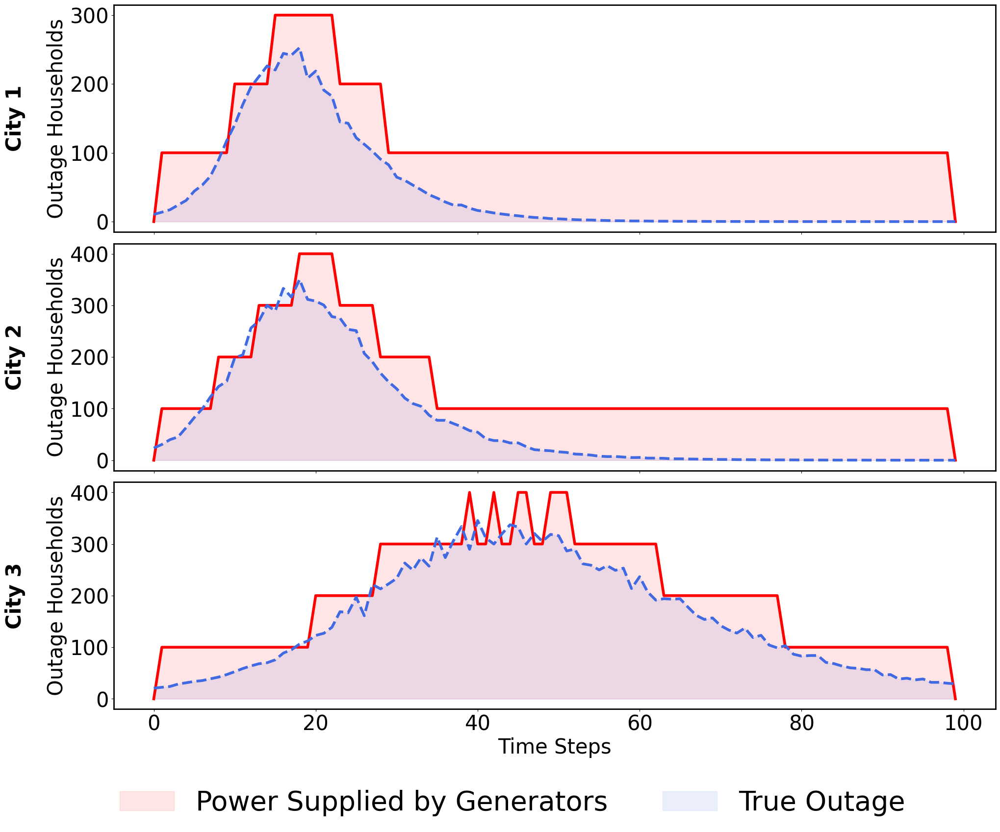

In [100]:
plot_Y_pred_and_q_combined(Y_true_np, q_baseline, num_cities, N_g)

In [101]:
# def baseline_greedy_online_plus_strategy(
#     Y_pred_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     G_initial,
#     num_cities,
#     outage_duration,
#     delta_t  # length of the expected period
# ):
#     x_to_baseline   = np.zeros((outage_duration, num_cities))
#     x_back_baseline = np.zeros((outage_duration, num_cities))
#     s_w_baseline    = np.zeros(outage_duration)
#     q_baseline      = np.zeros((outage_duration, num_cities))

#     # 1. Initial conditions: all stock is in warehouse, city stocks are zero
#     s_w_baseline[0] = G_initial
#     q_baseline[0, :] = 0

#     # Cost trackers
#     economic_cost_baseline       = np.zeros(num_cities)
#     transportation_cost_baseline = np.zeros(num_cities)
#     operational_cost_baseline    = np.zeros(num_cities)

#     for t in range(outage_duration):
#         if t > 0:
#             # Update stocks from prior shipments
#             s_w_baseline[t] = (
#                 s_w_baseline[t - 1]
#                 - np.sum(x_to_baseline[t - 1, :])
#                 + np.sum(x_back_baseline[t - 1, :])
#             )
#             q_baseline[t, :] = (
#                 q_baseline[t - 1, :]
#                 + x_to_baseline[t - 1, :]
#                 - x_back_baseline[t - 1, :]
#             )

#         # Prevent negative stock due to any rounding
#         s_w_baseline[t] = max(s_w_baseline[t], 0)
#         q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

#         # Greedy shipping decisions based on current forecast/demand
#         if t == 0:
#             # no previous data for t=0; assume 0 or some default
#             current_outage = np.zeros(num_cities)
#         else:
#             current_outage = Y_pred_np[t-1, :]

#         for i in range(num_cities):
#             required_generators = np.ceil(current_outage[i] / N_g)
#             available_generators = q_baseline[t, i]
#             deficit = required_generators - available_generators

#             # If city is short on generators:
#             if deficit > 0:
#                 can_ship = min(deficit, s_w_baseline[t])
#                 x_to_baseline[t, i] = can_ship
#                 s_w_baseline[t]    -= can_ship
#                 q_baseline[t, i]   += can_ship
#                 transportation_cost_baseline[i] += transport_cost_per_gen * can_ship

#             # If city has surplus:
#             elif deficit < 0:
#                 surplus = -deficit  # a positive number
#                 to_return = min(surplus, q_baseline[t, i])
#                 x_back_baseline[t, i] = to_return
#                 s_w_baseline[t]       += to_return
#                 q_baseline[t, i]      -= to_return
#                 transportation_cost_baseline[i] += transport_cost_per_gen * to_return

#         # Ensure no negative stock
#         s_w_baseline[t] = max(s_w_baseline[t], 0)
#         q_baseline[t, :] = np.maximum(q_baseline[t, :], 0)

#         # At final time step, force-return all city generators
#         if t == outage_duration - 1:
#             for i in range(num_cities):
#                 left_in_city = q_baseline[t, i]
#                 if left_in_city > 0:
#                     x_back_baseline[t, i] += left_in_city
#                     s_w_baseline[t]       += left_in_city
#                     q_baseline[t, i]      = 0
#                     transportation_cost_baseline[i] += transport_cost_per_gen * left_in_city

#         # Calculate costs for time t
#         for i in range(num_cities):
#             unmet = max(0, current_outage[i] - N_g * q_baseline[t, i])
#             economic_cost_baseline[i] += tau * unmet
#             operational_cost_baseline[i] += gamma * q_baseline[t, i]

#     # Aggregate total costs
#     total_economic_cost_baseline   = np.sum(economic_cost_baseline)
#     total_transportation_cost_baseline = np.sum(transportation_cost_baseline)
#     total_operational_cost_baseline    = np.sum(operational_cost_baseline)
#     sum_total_cost_baseline            = (
#         total_economic_cost_baseline
#         + total_transportation_cost_baseline
#         + total_operational_cost_baseline
#     )

#     costs_baseline = {
#         'economic_cost': economic_cost_baseline,
#         'transportation_cost': transportation_cost_baseline,
#         'operational_cost': operational_cost_baseline,
#         'total_economic_cost': total_economic_cost_baseline,
#         'total_transportation_cost': total_transportation_cost_baseline,
#         'total_operational_cost': total_operational_cost_baseline,
#         'sum_total_cost': sum_total_cost_baseline
#     }

#     return x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline


In [102]:
import numpy as np

def baseline_greedy_online_strategy(
    Y_pred_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    G_initial,
    num_cities,
    outage_duration,
    lag,      # number of time steps to lag the forecast (e.g. use Y_pred_np[t-lag])
    delta_t   # travel delay (in time steps) for shipments in both directions
):
    """
    Implements a myopic (greedy) online strategy for generator transportation with 
    an adjustable forecast lag and travel delay.
    
    At each time step, for each city, at most 1 generator can be dispatched from the warehouse
    (and similarly at most 1 can be returned from the city), except on the final time step when all
    remaining generators in a city are forced to return.
    
    Shipments are not instantaneous: generators shipped from the warehouse arrive at the city
    after delta_t time steps, and generators shipped from a city return to the warehouse after delta_t
    time steps.
    
    Additionally, the current forecast (i.e. predicted outage) is taken from Y_pred_np with the specified lag.
    
    Parameters:
      - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
      - tau: Economic cost factor (penalty for unmet demand)
      - N_g: Number of generators needed per unit outage
      - transport_cost_per_gen: Transportation cost per generator moved
      - gamma: Operational (holding) cost factor per generator in a city
      - G_initial: Initial number of generators in the warehouse
      - num_cities: Number of cities
      - outage_duration: Number of time steps in the horizon
      - lag: Time lag for using the outage forecast (e.g., lag=1 uses Y_pred_np[t-1] for current decisions)
      - delta_t: Travel delay (in time steps) for shipments between warehouse and cities.
      
    Returns:
      - x_to: Generators dispatched from the warehouse to cities [T, num_cities]
      - x_back: Generators shipped from cities back to the warehouse [T, num_cities]
      - s_w: Warehouse stock available at each time step [T]
      - q: City stocks over time [T, num_cities]
      - costs: Dictionary with cost breakdowns.
    """
    # Initialize decision arrays.
    x_to = np.zeros((outage_duration, num_cities))
    x_back = np.zeros((outage_duration, num_cities))
    # s_w[t] and q[t,i] represent the stock available at the beginning of time step t.
    s_w = np.zeros(outage_duration)
    q = np.zeros((outage_duration, num_cities))
    
    # Initial conditions.
    s_w[0] = G_initial
    q[0, :] = 0
    
    # Cost trackers (per city)
    economic_cost = np.zeros(num_cities)
    transportation_cost = np.zeros(num_cities)
    operational_cost = np.zeros(num_cities)
    
    # Loop over time steps.
    for t in range(outage_duration):
        # At time t, determine the forecast using the specified lag.
        if t >= lag:
            current_outage = Y_pred_np[t - lag, :]
        else:
            current_outage = np.zeros(num_cities)
        
        # Process decisions for each city.
        for i in range(num_cities):
            # Determine the number of generators required (rounded up).
            required_generators = np.ceil(current_outage[i] / N_g)
            # The city stock available now is q[t,i] (shipments from warehouse have not yet arrived if t < delta_t).
            deficit = required_generators - q[t, i]
            
            if deficit > 0:
                # Compute how many return shipments can possibly occur in the remaining time.
                # Since at most one generator can be returned per time step, but returns only arrive after delta_t,
                # the number of return opportunities from time t to the final time step is floor((outage_duration - t - 1) / delta_t).
                available_slots = max(int((outage_duration - t - 1) // delta_t) - q[t, i], 0)
                if available_slots > 0:
                    # Limit shipment to at most 1 generator, not more than warehouse stock, and not more than available slots.
                    can_ship = min(deficit, s_w[t], 1, available_slots)
                    x_to[t, i] = can_ship
                    s_w[t] -= can_ship  # Subtract immediately from warehouse stock.
                    transportation_cost[i] += transport_cost_per_gen * can_ship
                    # Note: the city stock will increase when this shipment arrives after delta_t steps.
            
            elif deficit < 0:
                # There is a surplus at the city.
                surplus = -deficit  # positive number
                # Return at most one generator (and not more than what is available in the city).
                to_return = min(surplus, q[t, i], 1)
                x_back[t, i] = to_return
                q[t, i] -= to_return  # Subtract immediately from city stock.
                transportation_cost[i] += transport_cost_per_gen * to_return
        
        # On the final time step, force any remaining generators in the cities to be returned.
        if t == outage_duration - 1:
            for i in range(num_cities):
                left = q[t, i]
                if left > 0:
                    # Force return all remaining generators from city i.
                    x_back[t, i] += left
                    q[t, i] = 0
                    transportation_cost[i] += transport_cost_per_gen * left
        
        # Update cost trackers for the current time step using current forecast and city stock.
        for i in range(num_cities):
            # Unmet outage is computed relative to the city stock (which affects supplied power).
            unmet = max(0, current_outage[i] - N_g * q[t, i])
            economic_cost[i] += tau * unmet
            operational_cost[i] += gamma * q[t, i]
        
        # Update stocks for the next time step.
        if t < outage_duration - 1:
            # For the warehouse: next stock equals the current (after decisions)
            # plus any returns arriving now (i.e. shipments dispatched delta_t steps ago).
            if t + 1 - delta_t >= 0:
                returns = np.sum(x_back[t + 1 - delta_t, :])
            else:
                returns = 0
            s_w[t + 1] = s_w[t] + returns
            
            # For each city: next stock equals the current (after decisions)
            # plus any arrivals from shipments sent delta_t steps ago.
            if t + 1 - delta_t >= 0:
                arrivals = x_to[t + 1 - delta_t, :]
            else:
                arrivals = np.zeros(num_cities)
            q[t + 1, :] = q[t, :] + arrivals
            # (Note: shipments sent in the current step do not arrive until delta_t steps later.)
    
    total_economic_cost = np.sum(economic_cost)
    total_transportation_cost = np.sum(transportation_cost)
    total_operational_cost = np.sum(operational_cost)
    sum_total_cost = total_economic_cost + total_transportation_cost + total_operational_cost
    
    costs = {
        'economic_cost': economic_cost,
        'transportation_cost': transportation_cost,
        'operational_cost': operational_cost,
        'total_economic_cost': total_economic_cost,
        'total_transportation_cost': total_transportation_cost,
        'total_operational_cost': total_operational_cost,
        'sum_total_cost': sum_total_cost
    }
    
    return x_to, x_back, s_w, q, costs


In [103]:
# x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline = baseline_greedy_online_plus_strategy(
#     Y_true_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     G_initial,
#     num_cities,
#     outage_duration,
#     delta_t = 100
# )

# # Solve the optimization problem
# # solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, Y_true)

# # Convert to NumPy for inspection
# x_to_np = solution.get("x_to")
# x_back_np = solution.get("x_back")
# s_w_np = solution.get("s_w")
# q_np = solution.get("q")

# compute_and_print_costs(
#     Y_true_np,
#     q_baseline,
#     x_to_baseline,
#     x_back_baseline,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     num_cities
# )

## test set

In [104]:
# --- Helper Function: Compute Total Cost ---
def compute_total_cost(Y_true, solution, tau, N_g, transport_cost, gamma):
    """
    Compute total cost given:
      - Y_true: (time_steps, num_cities) true outages
      - solution: a dict with keys "x_to", "x_back", "q" (all arrays of appropriate shape)
      - tau: cost factor for unmet demand (economic cost)
      - N_g: scaling factor for generator stock
      - transport_cost: transportation cost factor (for generators moved)
      - gamma: operational cost factor per unit generator operation
    """
    # Ensure the arrays are numpy arrays
    q = solution["q"]
    x_to = solution["x_to"]
    x_back = solution["x_back"]

    # Economic cost: unmet demand cost (using a ReLU-like formulation)
    economic_cost = tau * np.sum(np.maximum(Y_true - N_g * q, 0))

    # Transportation cost: cost for moving generators (x_to + x_back)
    transportation_cost = transport_cost * np.sum(x_to + x_back)

    # Operational cost: cost proportional to generator use.
    operational_cost = gamma * np.sum(q)

    total_cost = economic_cost + transportation_cost + operational_cost
    return total_cost, economic_cost, transportation_cost, operational_cost


In [105]:
# Predict outages using the SIR model
# pred_outages = odeint(wind_sir_model, initial_conditions, time_points)
test_pred_outages_dfl = odeint(wind_sir_model_dfl, test_initial_conditions, time_points)
test_pred_outages = odeint(wind_sir_model, test_initial_conditions, time_points)

pred_outages_dfl = test_pred_outages_dfl.float()  # Ensure proper dtype
pred_outages = test_pred_outages.float()  # Ensure proper dtype


Y_pred_dfl = pred_outages_dfl[:,:,1]
S_pred_dfl = pred_outages_dfl[:,:,0]
R_pred_dfl = pred_outages_dfl[:,:,2]

Y_pred = pred_outages[:,:,1]
S_pred = pred_outages[:,:,0]
R_pred = pred_outages[:,:,2]

Y_pred = pred_outages[:,:,1]

Y_pred_dfl_np = Y_pred_dfl.detach().numpy()
S_pred_dfl_np = S_pred_dfl.detach().numpy()
R_pred_dfl_np = R_pred_dfl.detach().numpy()

Y_pred_np = Y_pred.detach().numpy()
S_pred_np = S_pred.detach().numpy()
R_pred_np = R_pred.detach().numpy()

Y_pred_np = Y_pred.detach().numpy()

Y_true = test_synthetic_outages_noisy[:,:,1]
Y_true_np = Y_true.detach().numpy()


In [106]:
mse_error = loss_fn(test_pred_outages, test_synthetic_outages_noisy)
print(mse_error)

tensor(8992.9160, grad_fn=<MseLossBackward0>)


In [107]:
mse_error = loss_fn(test_pred_outages_dfl, test_synthetic_outages_noisy)
print(mse_error)

tensor(6235.4648, grad_fn=<MseLossBackward0>)


Plot saved to plots/city_1_MSE.pdf


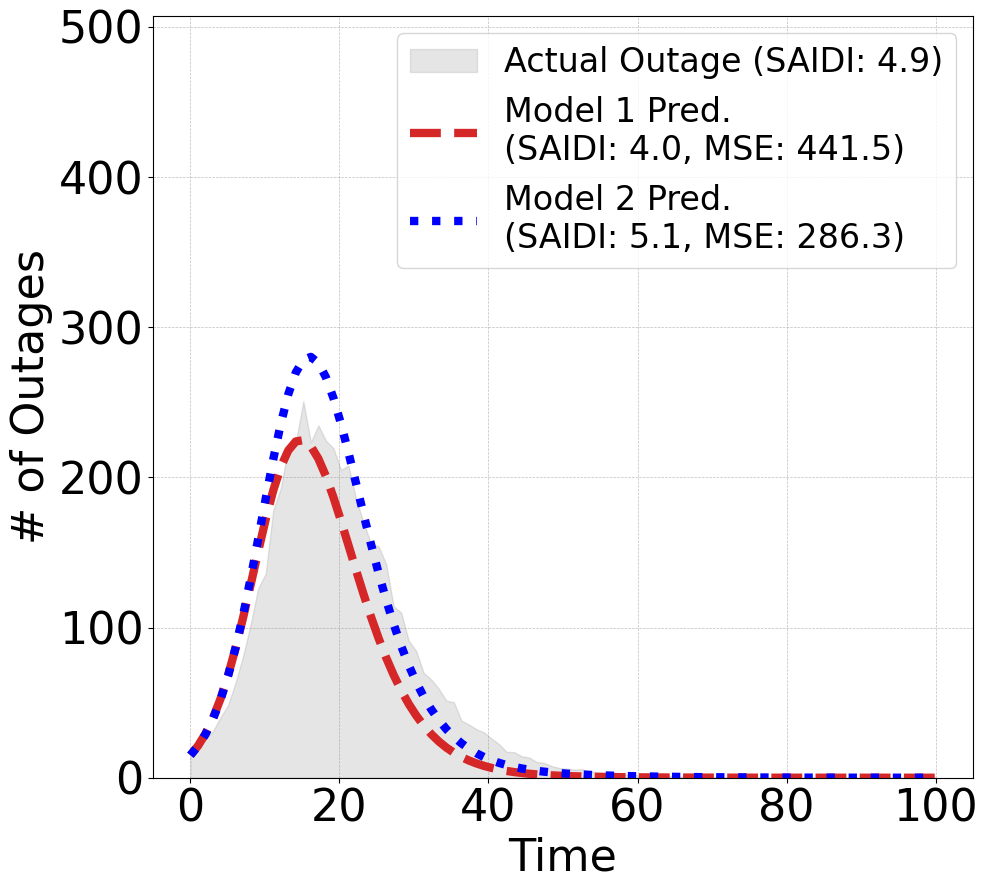

Plot saved to plots/city_2_MSE.pdf


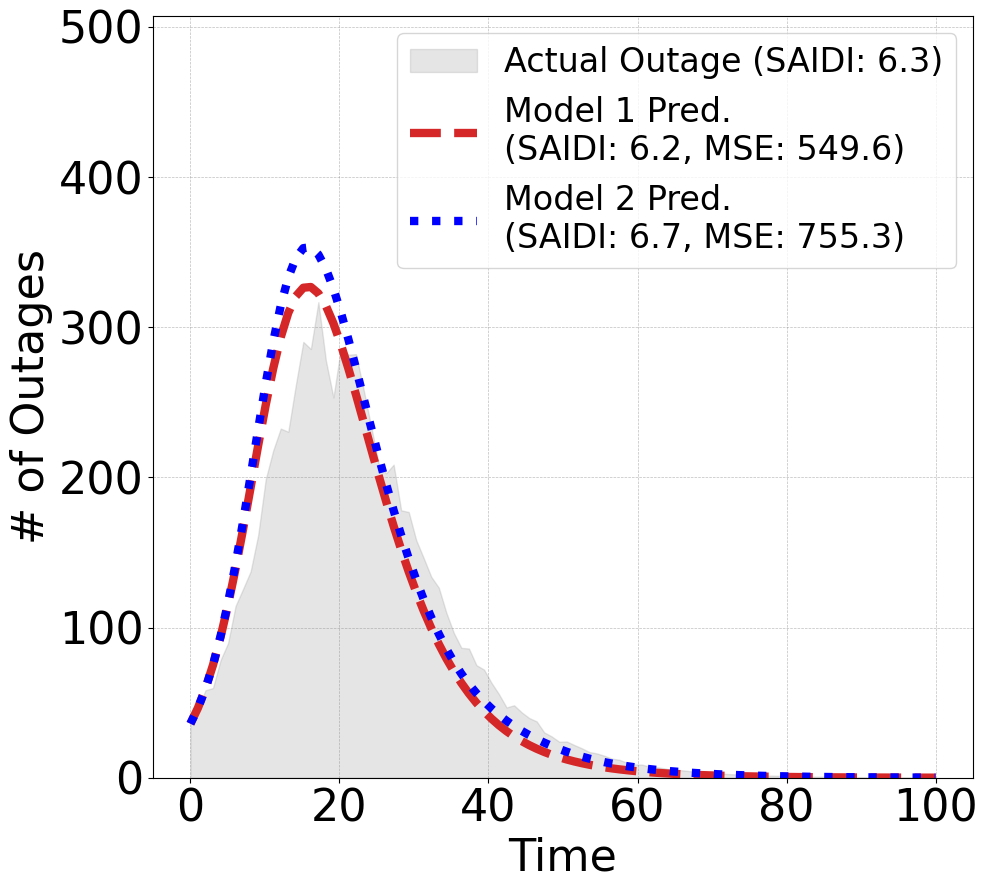

Plot saved to plots/city_3_MSE.pdf


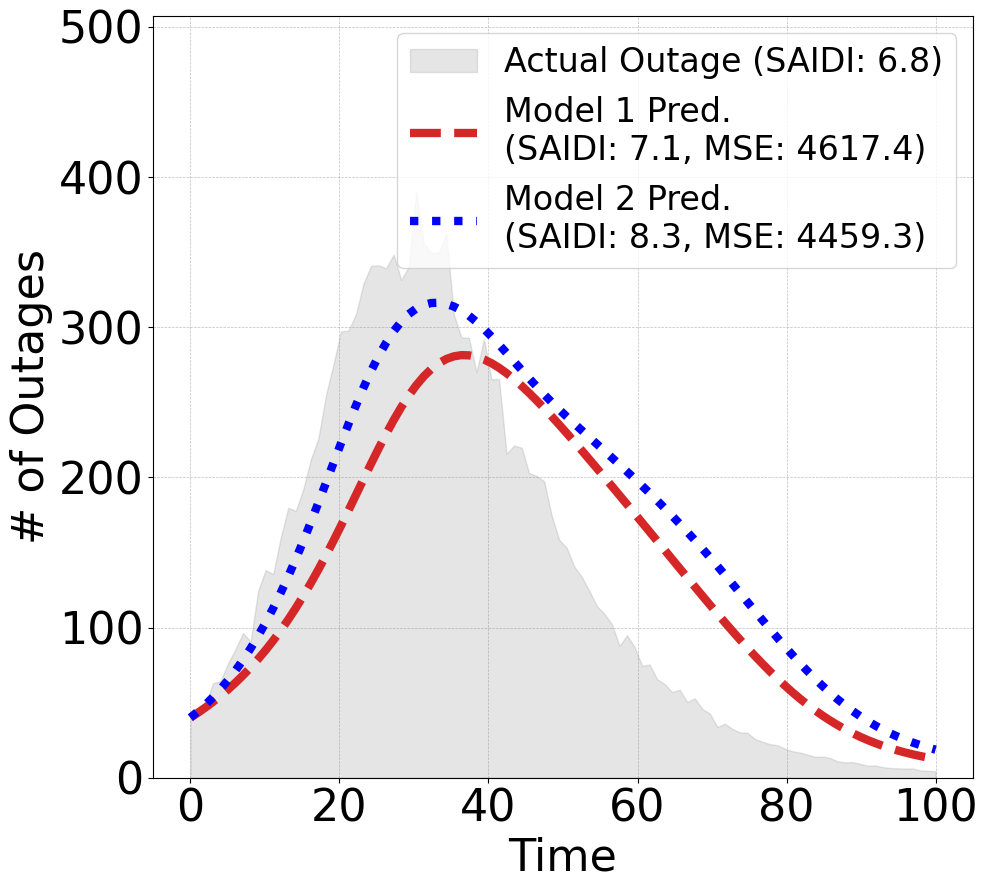

In [108]:
# Plot predictions vs true data after MSE training using the function
plot_predictions_with_comparison(time_points, test_synthetic_outages_noisy, pred_outages, pred_outages_dfl, customer_tensor, city_indices=range(num_cities), filename_suffix="MSE")

In [109]:
transport_cost_per_gen

100

In [110]:
# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $2217.16
  Transportation Cost: $398.90
  Operational Cost: $55.09

City 2:
  Economic Cost: $2257.39
  Transportation Cost: $638.39
  Operational Cost: $106.80

City 3:
  Economic Cost: $1542.48
  Transportation Cost: $657.30
  Operational Cost: $327.22

=== Total Costs ===
Total Economic Cost: $6017.02
Total Transportation Cost: $1694.60
Total Operational Cost: $489.10
Sum of All Costs: $8200.72


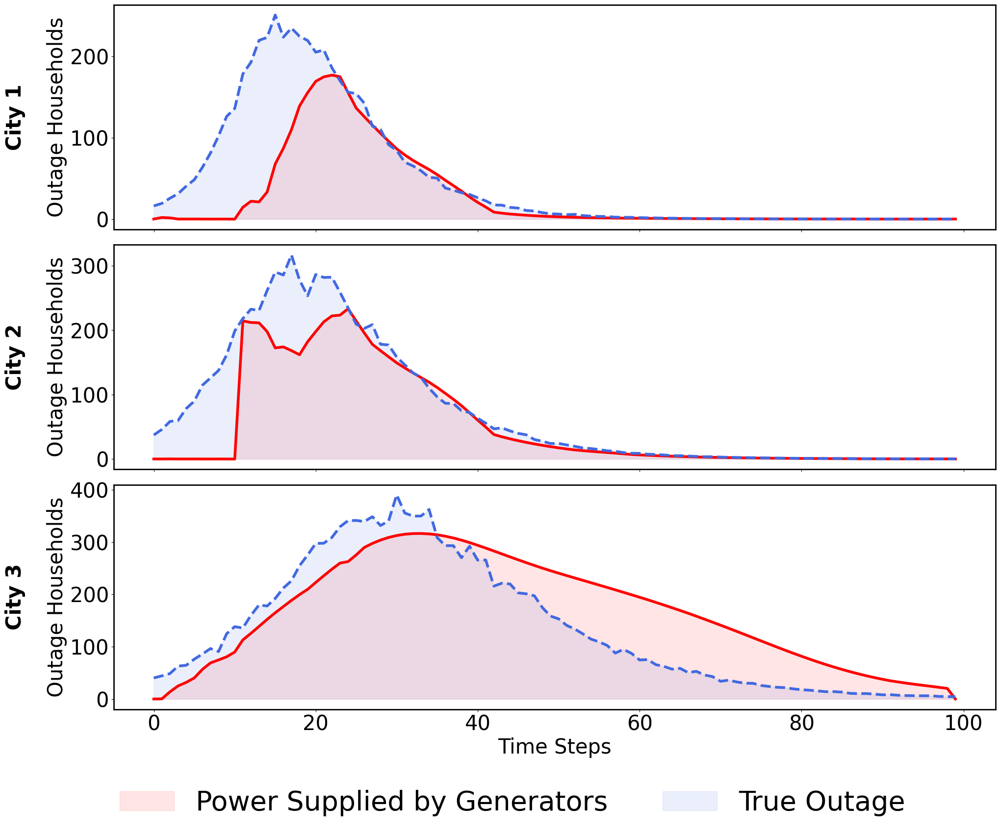

In [111]:
plot_Y_pred_and_q_combined(Y_true_np, q_np, num_cities, N_g)

In [112]:
solution_dfl = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, dt, Y_pred_dfl)

# Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = solution_dfl.get("x_to")
x_back_np = solution_dfl.get("x_back")
s_w_np = solution_dfl.get("s_w")
q_np_dfl = solution_dfl.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np_dfl,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0xd2552b6a
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e-03, 4e+02]
Found heuristic solution: objective 34800.010324
Presolve removed 591 rows and 430 columns
Presolve time: 0.01s
Presolved: 418 rows, 870 columns, 1941 nonzeros
Variable types: 105 continuous, 765 integer (133 binary)

Root relaxation: objective 1.003555e+04, 447 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 10035.5528    0  134 34800.010

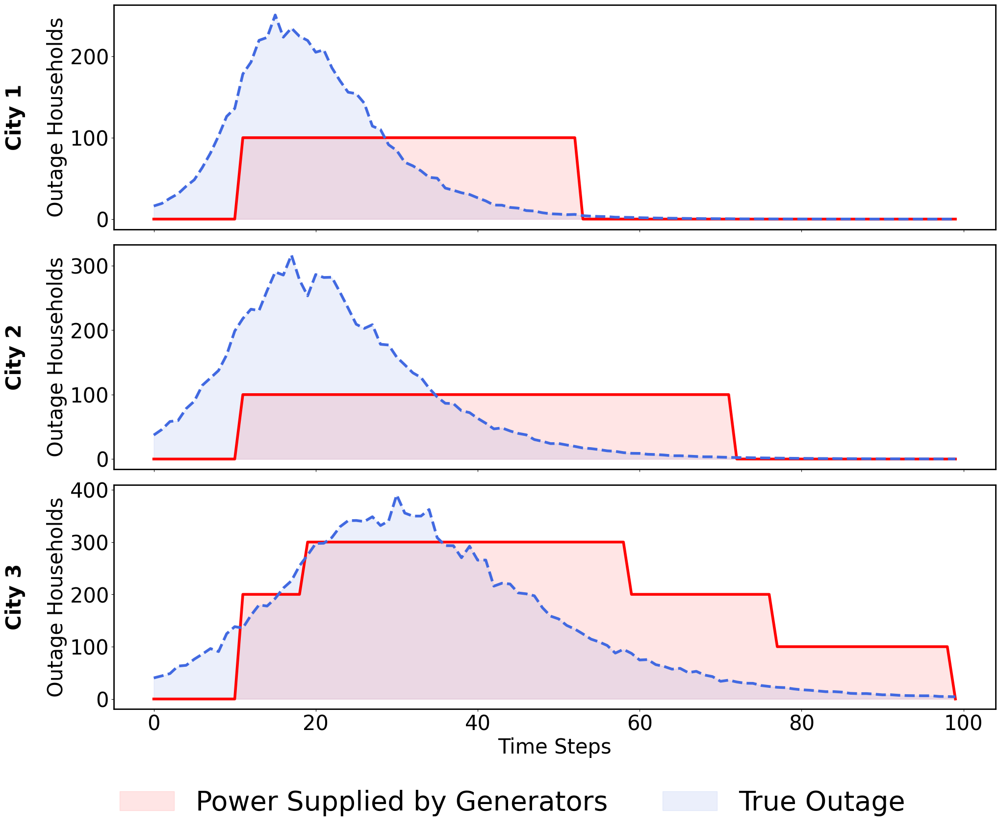

In [113]:
plot_Y_pred_and_q_combined(Y_true_np, q_np_dfl, num_cities, N_g)

In [114]:
# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $2720.75
  Transportation Cost: $88.41
  Operational Cost: $62.20

City 2:
  Economic Cost: $3092.42
  Transportation Cost: $336.63
  Operational Cost: $94.40

City 3:
  Economic Cost: $3349.27
  Transportation Cost: $559.15
  Operational Cost: $266.62

=== Total Costs ===
Total Economic Cost: $9162.43
Total Transportation Cost: $984.19
Total Operational Cost: $423.21
Sum of All Costs: $10569.83


/Users/ryanchen/miniconda3/envs/dfl/lib/python3.12/site-packages/diffcp/cone_program.py:295: UserWarning: Solved/Inaccurate.
  warnings.warn("Solved/Inaccurate.")


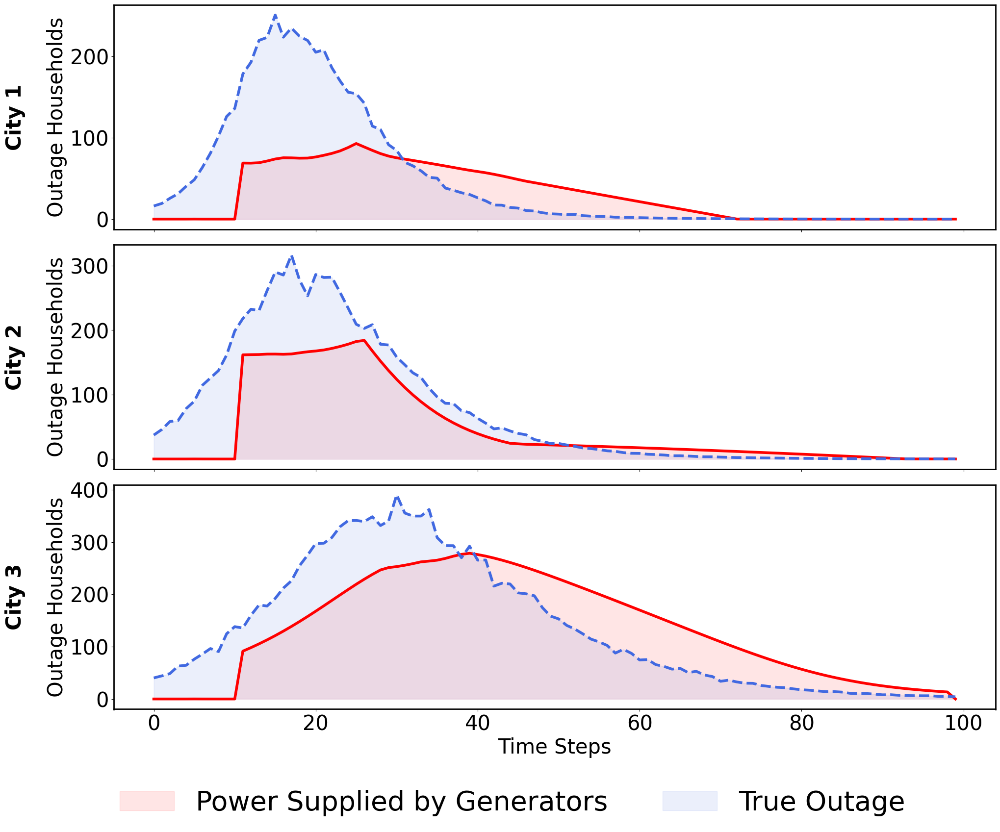

In [115]:
plot_Y_pred_and_q_combined(Y_true_np, q_np, num_cities, N_g)

In [116]:
solution_pred = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, dt, Y_pred)

# Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = solution_pred.get("x_to")
x_back_np = solution_pred.get("x_back")
s_w_np = solution_pred.get("s_w")
q_np_pred = solution_pred.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np_pred,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0xc966355c
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e-04, 3e+02]
Found heuristic solution: objective 30604.219764
Presolve removed 593 rows and 432 columns
Presolve time: 0.01s
Presolved: 416 rows, 868 columns, 1931 nonzeros
Variable types: 93 continuous, 775 integer (144 binary)

Root relaxation: objective 8.074722e+03, 454 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 8074.72189    0  131 30604.2198

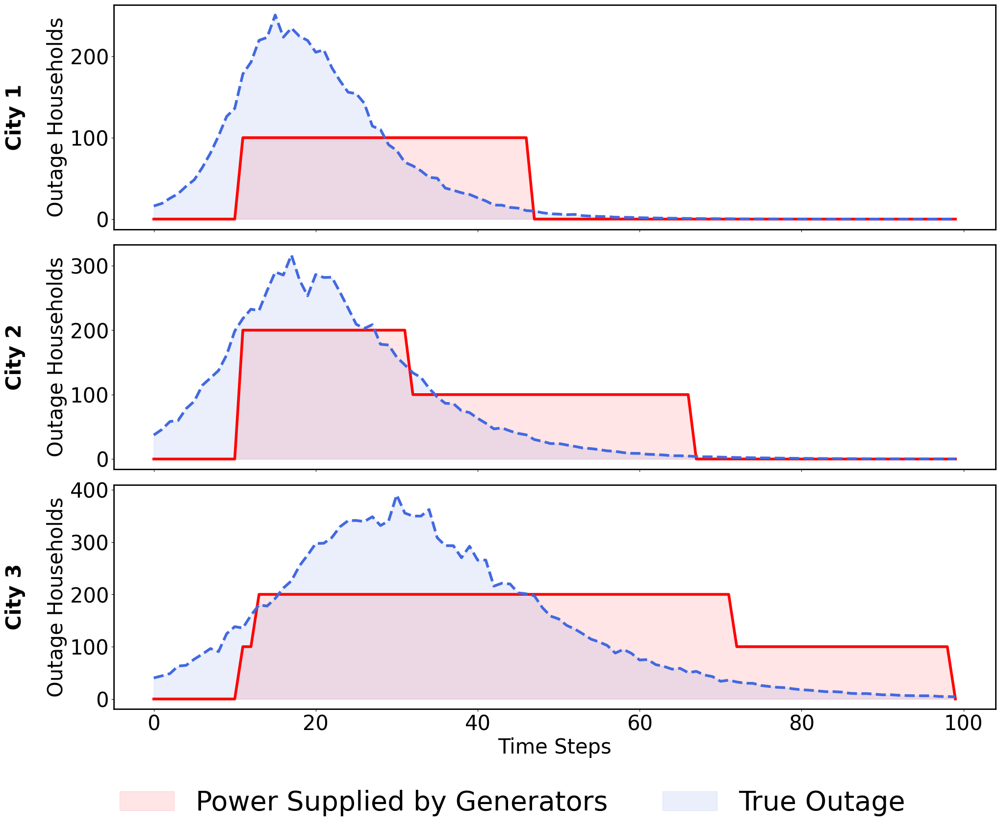

In [117]:
plot_Y_pred_and_q_combined(Y_true_np, q_np_pred, num_cities, N_g)

In [118]:
# Solve the optimization problem
x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_true)

# Convert to NumPy for inspection
x_to_np = x_to_opt.detach().numpy()
x_back_np = x_back_opt.detach().numpy()
s_w_np = s_w_opt.detach().numpy()
q_np = q_opt.detach().numpy()

compute_and_print_costs(
    Y_true_np,
    q_np,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)


=== Per-City Costs ===
City 1:
  Economic Cost: $1587.20
  Transportation Cost: $299.88
  Operational Cost: $67.66

City 2:
  Economic Cost: $2368.07
  Transportation Cost: $377.37
  Operational Cost: $106.37

City 3:
  Economic Cost: $2306.10
  Transportation Cost: $768.88
  Operational Cost: $230.96

=== Total Costs ===
Total Economic Cost: $6261.36
Total Transportation Cost: $1446.13
Total Operational Cost: $404.99
Sum of All Costs: $8112.49


In [119]:
solution_gt = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, dt, Y_true)

# Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# Convert to NumPy for inspection
x_to_np = solution_gt.get("x_to")
x_back_np = solution_gt.get("x_back")
s_w_np = solution_gt.get("s_w")
q_np_opt = solution_gt.get("q")

compute_and_print_costs(
    Y_true_np,
    q_np_opt,
    x_to_np,
    x_back_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (mac64[arm] - Darwin 25.1.0 25B78)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1009 rows, 1300 columns and 2839 nonzeros
Model fingerprint: 0xb9b96b31
Variable types: 300 continuous, 1000 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [1e+00, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-02, 4e+02]
Found heuristic solution: objective 30990.106507
Presolve removed 593 rows and 432 columns
Presolve time: 0.01s
Presolved: 416 rows, 868 columns, 1931 nonzeros
Variable types: 86 continuous, 782 integer (150 binary)

Root relaxation: objective 9.244153e+03, 415 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0 9244.15289    0   87 30990.1065

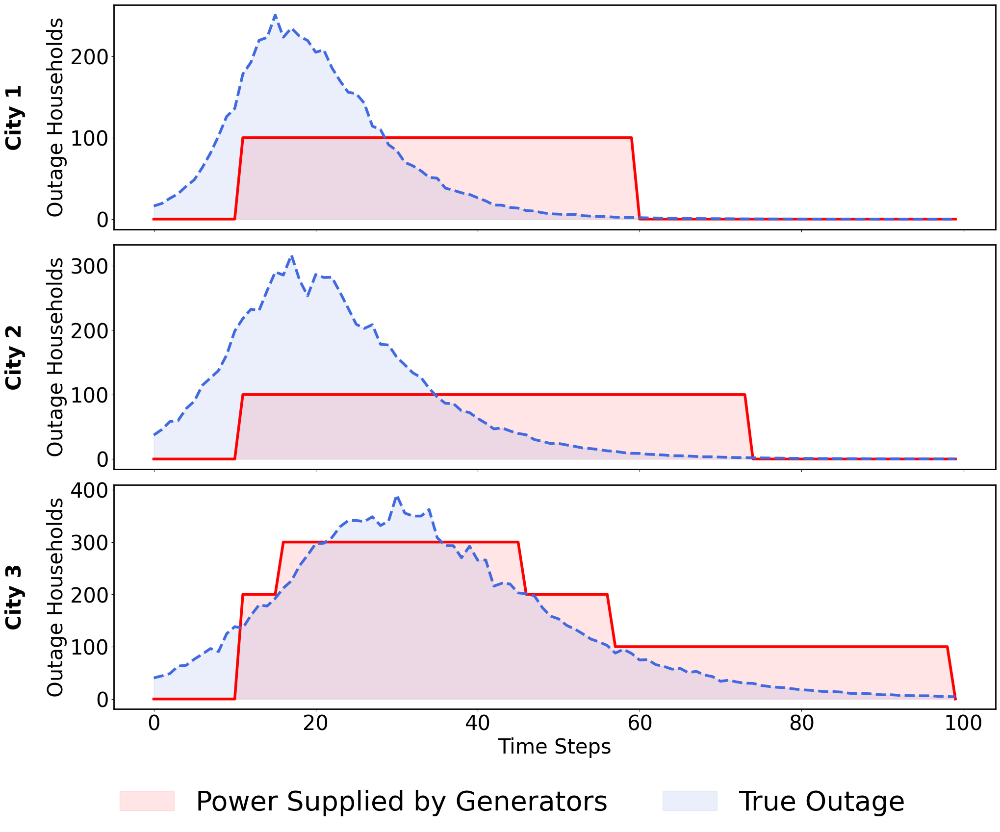

In [120]:
plot_Y_pred_and_q_combined(Y_true_np, q_np_opt, num_cities, N_g)

In [121]:
transport_cost_per_gen

100

In [122]:
x_to_baseline, x_back_baseline, s_w_baseline, q_baseline, costs_baseline = baseline_greedy_online_strategy(
    Y_true_np,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    G_initial,
    num_cities,
    outage_duration,
    dt,
    1
)

# # Solve the optimization problem
# # solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, Y_true)
# lag = 5
# Y_shifted = np.zeros_like(Y_true_np)   # First row is zero.
# Y_shifted[lag:, :] = Y_true_np[:-lag, :]     # For t>=1, use t-1 data.
# solution_baseline = solve_gdp_with_gurobi(tau, N_g, 0, gamma, G_initial, num_cities, outage_duration, dt, Y_shifted)

# Solve the optimization problem
# x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)

# # Convert to NumPy for inspection
# x_to_baseline = solution_baseline.get("x_to")
# x_back_baseline = solution_baseline.get("x_back")
# s_w_baseline = solution_baseline.get("s_w")
# q_baseline = solution_baseline.get("q")

compute_and_print_costs(
    Y_true_np,
    q_baseline,
    x_to_baseline,
    x_back_baseline,
    tau,
    N_g,
    transport_cost_per_gen,
    gamma,
    num_cities
)

solution_baseline = {
        "x_to": np.array(x_to_baseline),
        "x_back": np.array(x_back_baseline),
        "s_w": np.array(s_w_baseline),
        "q": np.array(q_baseline),
        "objective": costs_baseline['sum_total_cost']
    }


=== Per-City Costs ===
City 1:
  Economic Cost: $1668.57
  Transportation Cost: $400.00
  Operational Cost: $216.00

City 2:
  Economic Cost: $2636.26
  Transportation Cost: $400.00
  Operational Cost: $232.00

City 3:
  Economic Cost: $6618.92
  Transportation Cost: $600.00
  Operational Cost: $248.00

=== Total Costs ===
Total Economic Cost: $10923.75
Total Transportation Cost: $1400.00
Total Operational Cost: $696.00
Sum of All Costs: $13019.75


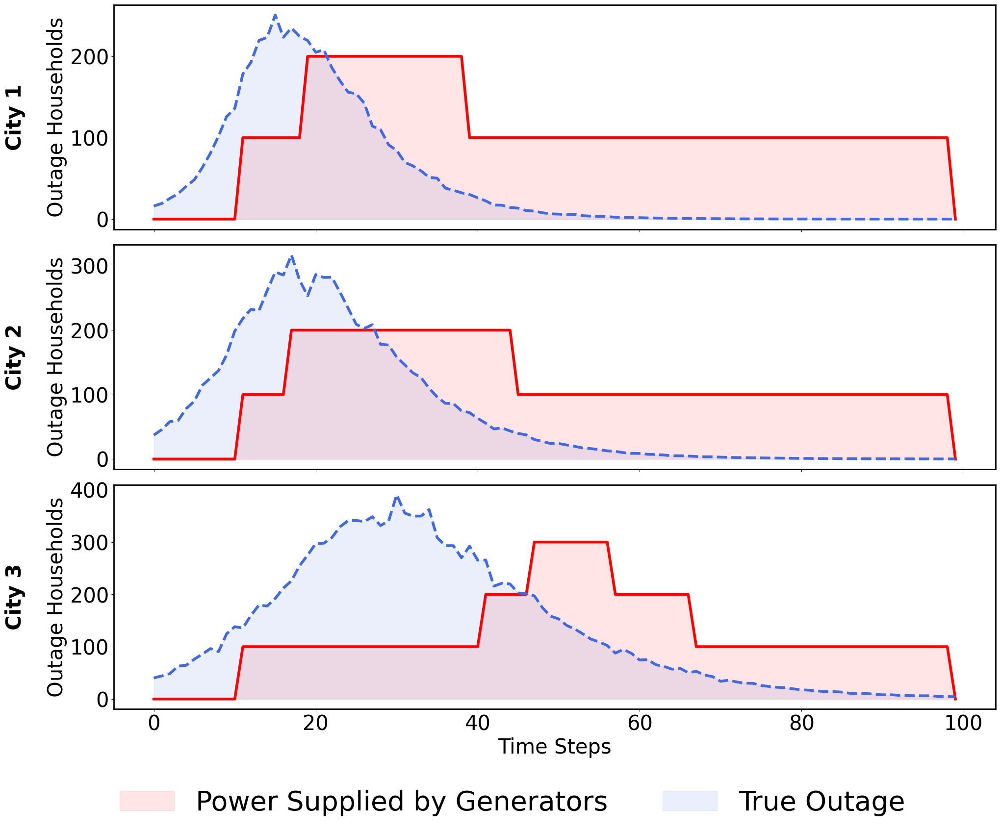

In [123]:
plot_Y_pred_and_q_combined(Y_true_np, q_baseline, num_cities, N_g)

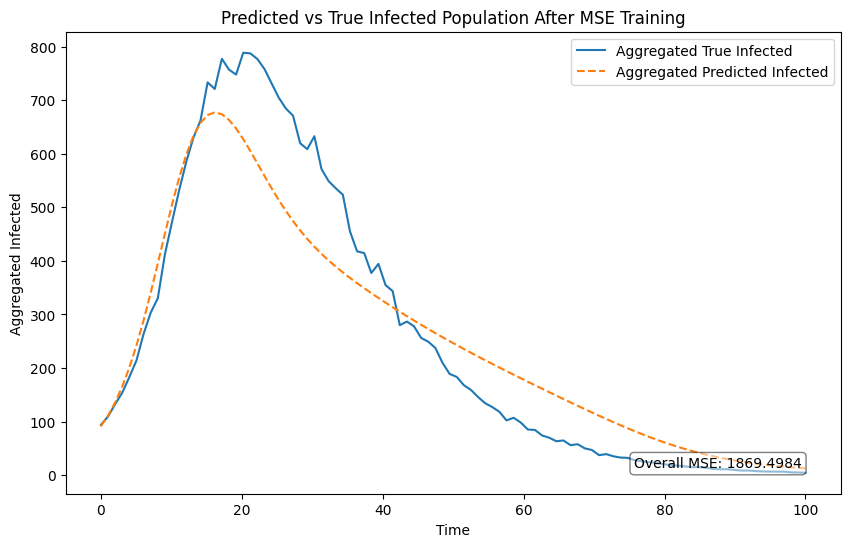

In [124]:
plot_aggregated_predictions(time_points, test_synthetic_outages_noisy, test_pred_outages, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training")

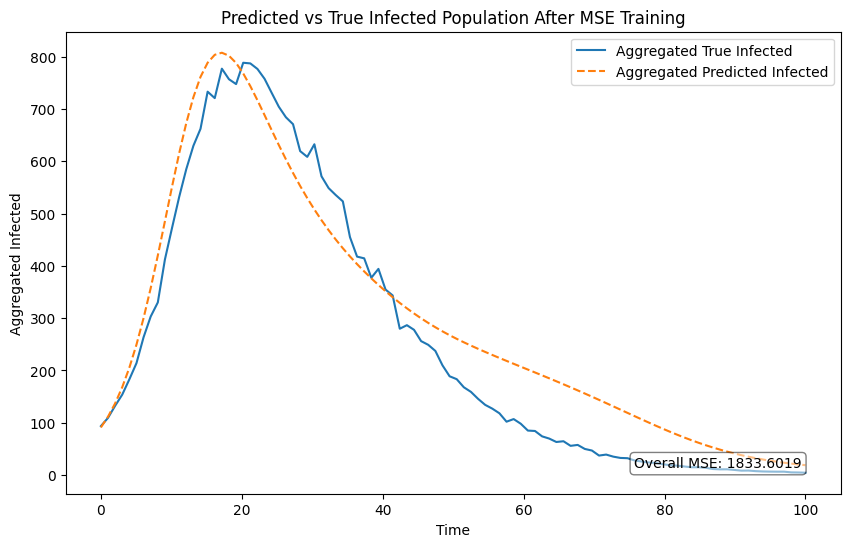

In [125]:
plot_aggregated_predictions(time_points, test_synthetic_outages_noisy, test_pred_outages_dfl, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training")

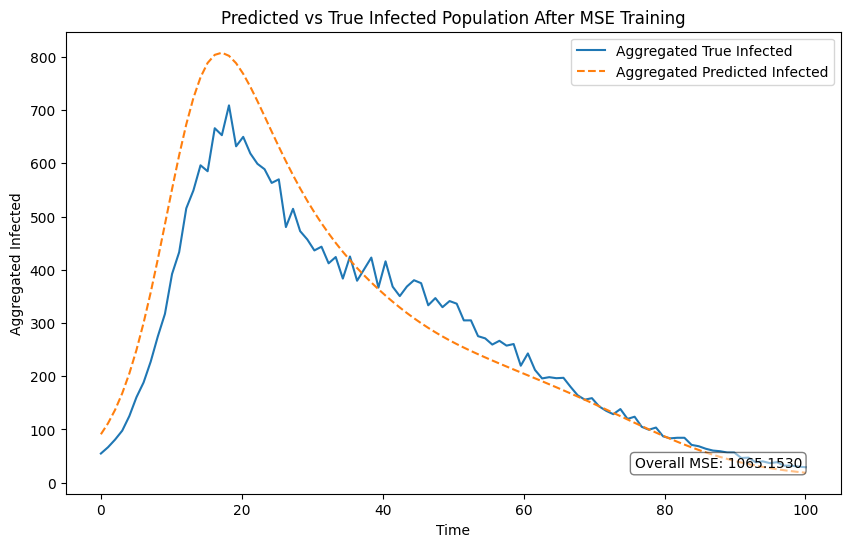

In [126]:
plot_aggregated_predictions(time_points, synthetic_outages_noisy, pred_outages_dfl, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training")

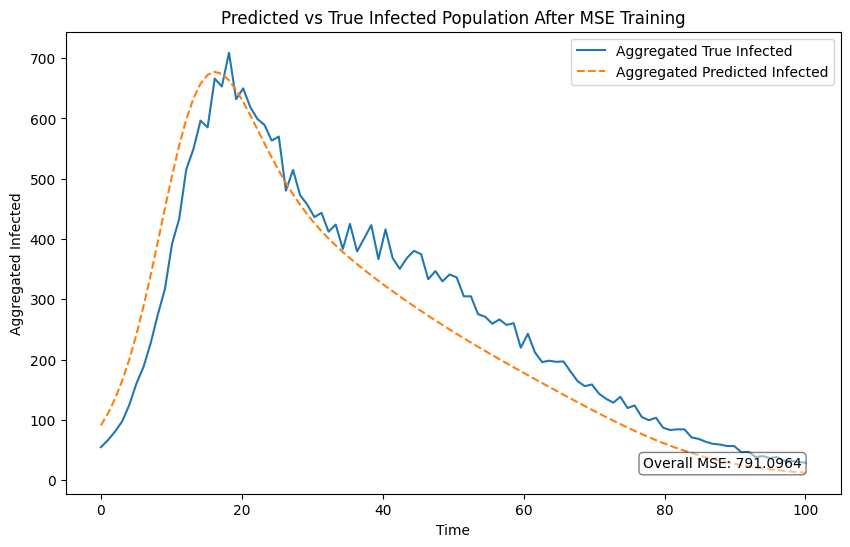

In [127]:
plot_aggregated_predictions(time_points, synthetic_outages_noisy, pred_outages, num_cities = num_cities, title="Predicted vs True Infected Population After MSE Training")

In [128]:
mse_error = loss_fn(test_pred_outages, test_synthetic_outages_noisy)
print(mse_error)
mse_error = loss_fn(test_pred_outages_dfl, test_synthetic_outages_noisy)
print(mse_error)
print(compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma))
print(compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma))
print(compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma))
print(compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma))

tensor(8992.9160, grad_fn=<MseLossBackward0>)
tensor(6235.4648, grad_fn=<MseLossBackward0>)
(9911.296049547382, 8391.296049547382, 1000.0, 520.0)
(13019.754600275308, 10923.754600275308, 1400.0, 696.0)
(9422.844759893604, 7870.844759893604, 1000.0, 552.0)
(9581.372296285816, 7987.3722962858155, 1000.0, 594.0)


In [129]:
import pandas as pd

In [133]:
# --- Assume these quantities have been computed in your experiment ---
# mse_error_pred and mse_error_dfl are PyTorch tensors, so we call .item() to get a Python float.
mse_error_pred = loss_fn(test_pred_outages, test_synthetic_outages_noisy)
mse_error_dfl  = loss_fn(test_pred_outages_dfl, test_synthetic_outages_noisy)

# Each cost tuple: (total_cost, economic_cost, transportation_cost, operational_cost)
cost_pred     = compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)
cost_baseline = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
cost_gt       = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)
cost_dfl      = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)

# Create a dictionary to store all results
results_dict = {
    "seed": seed,
    "tau": tau,
    "N_g": N_g,
    "epochs": num_epochs,
    "transport_cost_per_gen": transport_cost_per_gen,
    "gamma": gamma,
    "lambda_mse":lambda_mse,
    "mse_error_pred": mse_error_pred.item(),
    "mse_error_dfl": mse_error_dfl.item(),
    "total_cost_pred": cost_pred[0],
    "economic_cost_pred": cost_pred[1],
    "transportation_cost_pred": cost_pred[2],
    "operational_cost_pred": cost_pred[3],
    "total_cost_baseline": cost_baseline[0],
    "economic_cost_baseline": cost_baseline[1],
    "transportation_cost_baseline": cost_baseline[2],
    "operational_cost_baseline": cost_baseline[3],
    "total_cost_gt": cost_gt[0],
    "economic_cost_gt": cost_gt[1],
    "transportation_cost_gt": cost_gt[2],
    "operational_cost_gt": cost_gt[3],
    "total_cost_dfl": cost_dfl[0],
    "economic_cost_dfl": cost_dfl[1],
    "transportation_cost_dfl": cost_dfl[2],
    "operational_cost_dfl": cost_dfl[3]
}

# Create a pandas DataFrame with one row containing the results
df = pd.DataFrame([results_dict])

# Define the file path on Google Drive (adjust the path as needed)
csv_file_path = RESULTS_PATH + 'experiment_results.csv'

# Save the DataFrame to a CSV file (this will replace any existing file)
df.to_csv(csv_file_path, index=False)
print("Results saved to", csv_file_path)

Results saved to results/experiment_results.csv


In [ ]:
# # Solve the optimization problem
# # x_to_opt, x_back_opt, s_w_opt, q_opt = gdp_cvxpy_layer(Y_pred_dfl)
# solution = solve_gdp_with_gurobi(tau, N_g, transport_cost_per_gen, gamma, G_initial, num_cities, outage_duration, Y_pred_dfl)

# # Convert to NumPy for inspection
# x_to_np_dfl = solution.get("x_to")
# x_back_np_dfl = solution.get("x_back")
# s_w_np_dfl = solution.get("s_w")
# q_np_dfl = solution.get("q")

# compute_and_print_costs(
#     Y_true_np,
#     q_np,
#     x_to_np,
#     x_back_np,
#     tau,
#     N_g,
#     transport_cost_per_gen,
#     gamma,
#     num_cities
# )

In [ ]:
# # Call the new plotting function
# # Convert Y_pred to NumPy for plotting
# Y_dfl_np = pred_outages_dfl[:,:,1].detach().numpy()
# plot_Y_pred_and_q(Y_dfl_np, q_np_dfl, num_cities)

# Plot (optional code)

In [135]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_Y_pred_and_q_combined(Y_pred_np, q_np, num_cities, true_Y=False, N_g=100, save_path='plot.pdf'):
    """
    Plots outage data and generator stock for each city with separate y-axes.
    The generator stock curve is forced to start at zero and drop to zero at the last time step.
    By default the outage data is plotted using a deep blue with dashed lines; if the flag
    true_Y is set to True then the outage data is plotted in grey with dotted lines.
    The plot is saved to a PDF file.

    Parameters:
      - Y_pred_np: NumPy array of outage data (shape: [time_steps, num_cities]).
                   Interpreted as predicted outages when true_Y is False, or as true outages when true_Y is True.
      - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
      - num_cities: Integer representing the number of cities
      - true_Y: Boolean flag. If True, outage data is treated as true outages (grey, dotted line). Default is False.
      - N_g: Scaling factor for generator stock (default: 100)
      - save_path: File path for saving the PDF (default: 'plot.pdf')
    """
    time_steps = Y_pred_np.shape[0]
    time = np.arange(time_steps)

    # Set font sizes for labels and legends.
    label_font_size = 30
    legend_font_size = 40

    # Use black for the box lines.
    box_color = 'black'

    # Define outage plotting style based on the true_Y flag.
    if true_Y:
        outage_color = 'grey'
        outage_line_style = ':'  # dotted line for true outages
        outage_label = 'True Outage'
    else:
        outage_color = 'royalblue'
        outage_line_style = '--'  # dashed line for predicted outages
        outage_label = 'Predicted Outage'

    # Create subplots with adjusted margins.
    fig, axs = plt.subplots(num_cities, 1, figsize=(20, 6 * num_cities), sharex=True)
    plt.subplots_adjust(left=0.25, top=0.9, bottom=0.15, hspace=0.3)

    # Ensure axs is a list even if num_cities == 1.
    if num_cities == 1:
        axs = [axs]

    for i in range(num_cities):
        ax = axs[i]

        # Make a copy of q for city i, then force the first and last value to zero.
        modified_q = q_np[:, i].copy()
        modified_q[0] = 0     # Force the initial city stock to zero
        modified_q[-1] = 0    # Force the final city stock to zero

        # --- Plot generator data (red) ---
        # Fill area under generator curve.
        ax.fill_between(time, N_g * modified_q, color='red', alpha=0.1)
        # Plot as a solid red line.
        ax.plot(time, N_g * modified_q, color='red', linewidth=4)

        # --- Plot outage data (blue or grey, depending on true_Y flag) ---
        ax.fill_between(time, Y_pred_np[:, i], color=outage_color, alpha=0.1)
        ax.plot(time, Y_pred_np[:, i], linestyle=outage_line_style, color=outage_color, linewidth=4)

        # Place "City X" label on the left.
        ax.text(-0.1, 0.5, f'City {i+1}', fontsize=label_font_size,
                verticalalignment='center', horizontalalignment='right',
                rotation='vertical', transform=ax.transAxes, weight='bold')

        # Set y-axis label.
        ax.set_ylabel('Outage Households', fontsize=label_font_size)

        # Style the axes.
        for spine in ax.spines.values():
            spine.set_color(box_color)
            spine.set_linewidth(2)
        ax.tick_params(axis='both', labelsize=label_font_size)

    # Shared x-axis label.
    plt.xlabel('Time Steps', fontsize=label_font_size)

    # Create custom legend handles.
    legend_handles = [
        mpatches.Patch(color='red', alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=outage_color, alpha=0.1, label=outage_label)
    ]

    # Place the legend.
    fig.legend(handles=legend_handles, loc='upper center', ncol=2,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, 0.08))

    # Tight layout.
    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    # Save to PDF.
    plt.savefig(save_path, format='pdf')
    plt.show()


In [136]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_Y_pred_and_q_combined_two_Y(Y_true, Y_pred_np, q_np, num_cities, N_g=100, save_path=PLOT_PATH + 'plot.pdf'):
    """
    Plots true and predicted outages along with generator stock for each city using separate y-axes.
    The generator stock curve is forced to start and end at zero.

    Outages:
      - Predicted outages are plotted using a light blue (existing) color with a dashed line.
      - True outages are plotted using a light grey fill with a dotted line.

    Generator stock:
      - Plotted in red with a filled area.

    Parameters:
      - Y_true: NumPy array of true outages (shape: [time_steps, num_cities])
      - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
      - q_np: NumPy array of generator stocks (shape: [time_steps, num_cities])
      - num_cities: Integer representing the number of cities
      - N_g: Scaling factor for generator stock (default: 100)
      - save_path: File path for saving the PDF (default: 'plot.pdf')
    """
    time_steps = Y_pred_np.shape[0]
    time = np.arange(time_steps)

    # Set font sizes: one for general labels and one for the legend.
    label_font_size = 30
    legend_font_size = 40

    # Use black for the box lines.
    box_color = 'black'

    # Define color for predicted outages (existing light blue style).
    outage_color = 'royalblue'  # you can change this to 'lightblue' if preferred

    # Create subplots with adjusted margins.
    fig, axs = plt.subplots(num_cities, 1, figsize=(20, 6 * num_cities), sharex=True)
    plt.subplots_adjust(left=0.25, top=0.9, bottom=0.15, hspace=0.3)

    # Ensure axs is a list even if num_cities == 1.
    if num_cities == 1:
        axs = [axs]

    for i in range(num_cities):
        ax = axs[i]

        # --- Plot generator data (red) ---
        # Force the initial and final generator stock values to zero.
        modified_q = q_np[:, i].copy()
        modified_q[0] = 0     # Force the initial city stock to zero
        modified_q[-1] = 0    # Force the final city stock to zero

        # Fill area under generator curve and plot the line.
        ax.fill_between(time, N_g * modified_q, color='red', alpha=0.1)
        ax.plot(time, N_g * modified_q, color='red', linewidth=4)

        # --- Plot predicted outage data (light blue) ---
        ax.fill_between(time, Y_pred_np[:, i], color=outage_color, alpha=0.1)
        ax.plot(time, Y_pred_np[:, i], linestyle='--', color=outage_color, linewidth=4)

        # --- Plot true outage data (light grey) ---
        ax.fill_between(time, Y_true[:, i], color='grey', alpha=0.1)
        ax.plot(time, Y_true[:, i], linestyle=':', color='grey', linewidth=4)

        # Place "City X" label on the left side.
        ax.text(-0.1, 0.5, f'City {i+1}', fontsize=label_font_size,
                verticalalignment='center', horizontalalignment='right',
                rotation='vertical', transform=ax.transAxes, weight='bold')

        # Set y-axis label.
        ax.set_ylabel('Outage Households', fontsize=label_font_size)

        # Style the axes.
        for spine in ax.spines.values():
            spine.set_color(box_color)
            spine.set_linewidth(2)
        ax.tick_params(axis='both', labelsize=label_font_size)

    # Shared x-axis label.
    plt.xlabel('Time Steps', fontsize=label_font_size)

    # Create custom legend handles.
    legend_handles = [
        mpatches.Patch(color='red', alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=outage_color, alpha=0.1, label='Predicted Outage'),
        mpatches.Patch(color='grey', alpha=0.1, label='True Outage')
    ]

    # Place the legend.
    fig.legend(handles=legend_handles, loc='upper center', ncol=3,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, 0.08))

    # Adjust layout to make room for the legend.
    plt.tight_layout(rect=[0, 0.08, 1, 0.95])

    # Save the plot to a PDF file and show the plot.
    plt.savefig(save_path, format='pdf')
    plt.show()


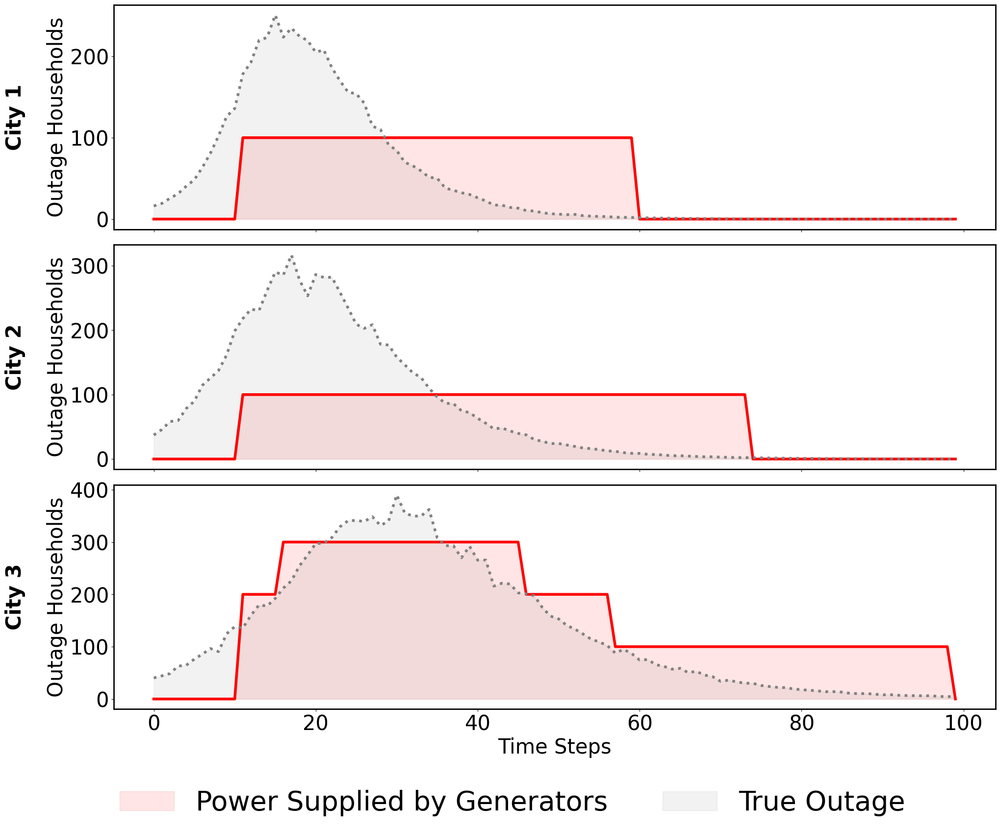

In [137]:
# plot ture data, dfl allocation, add prediciotion Y
plot_Y_pred_and_q_combined(Y_true_np, q_np_opt, num_cities, true_Y= True, N_g = N_g)

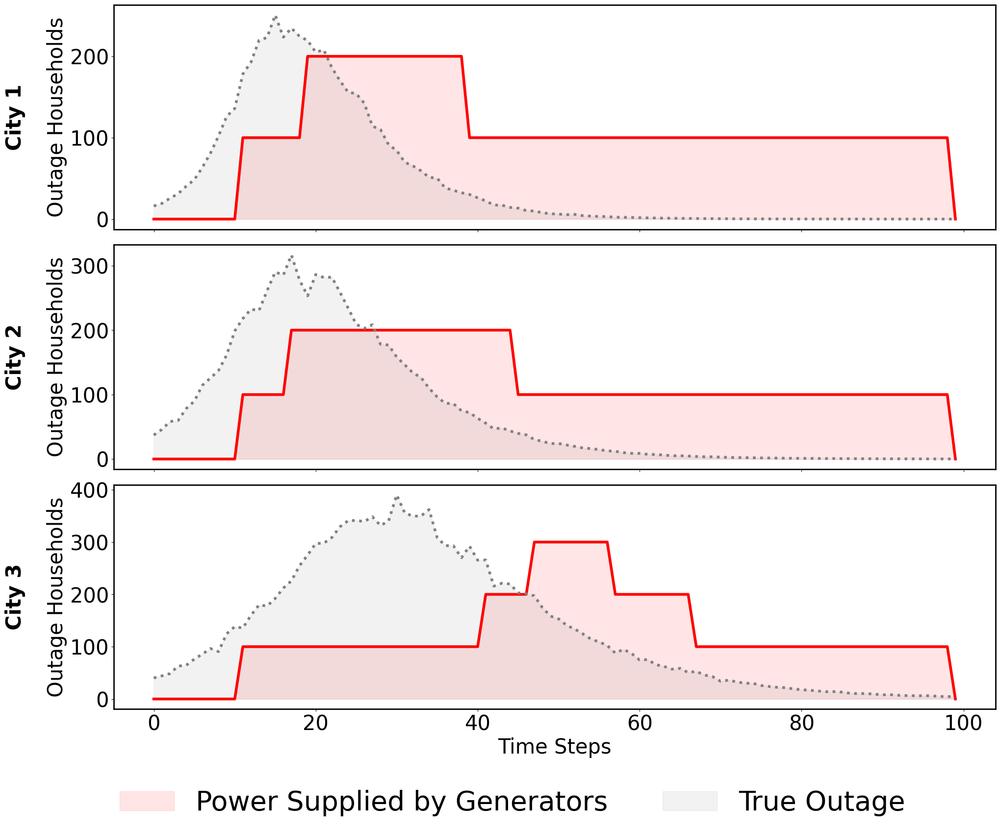

In [138]:
# plot ture data, dfl allocation, add prediciotion Y
plot_Y_pred_and_q_combined(Y_true_np, q_baseline, num_cities, true_Y= True, N_g = N_g)

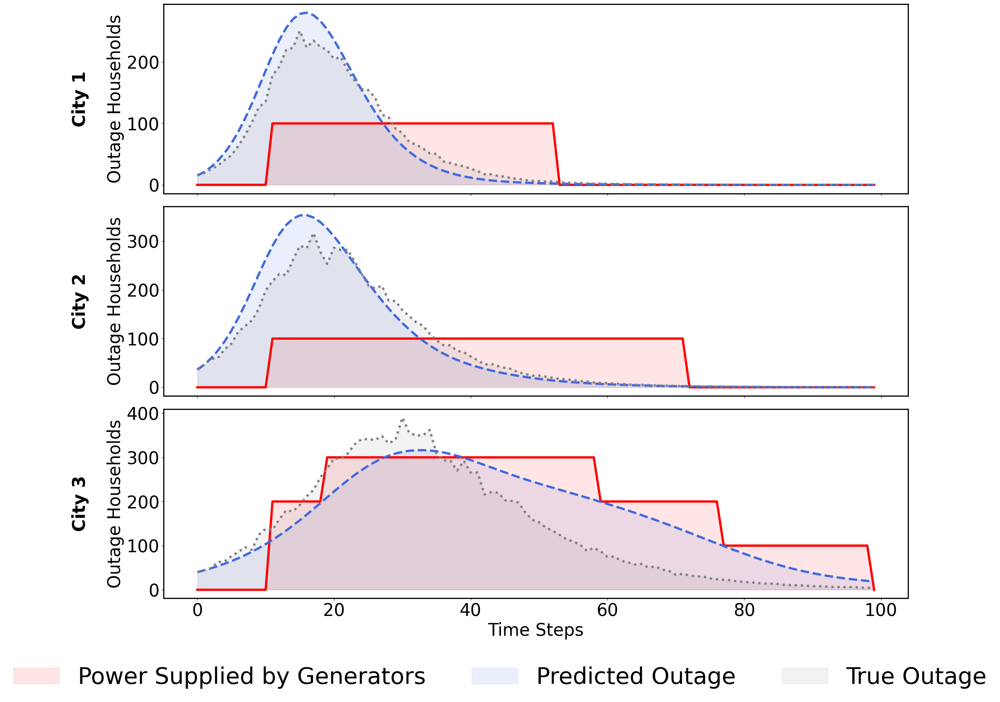

In [139]:
# plot ture data, dfl allocation, add prediciotion Y
plot_Y_pred_and_q_combined_two_Y(Y_true_np, Y_pred_dfl_np, q_np_dfl, num_cities, N_g)

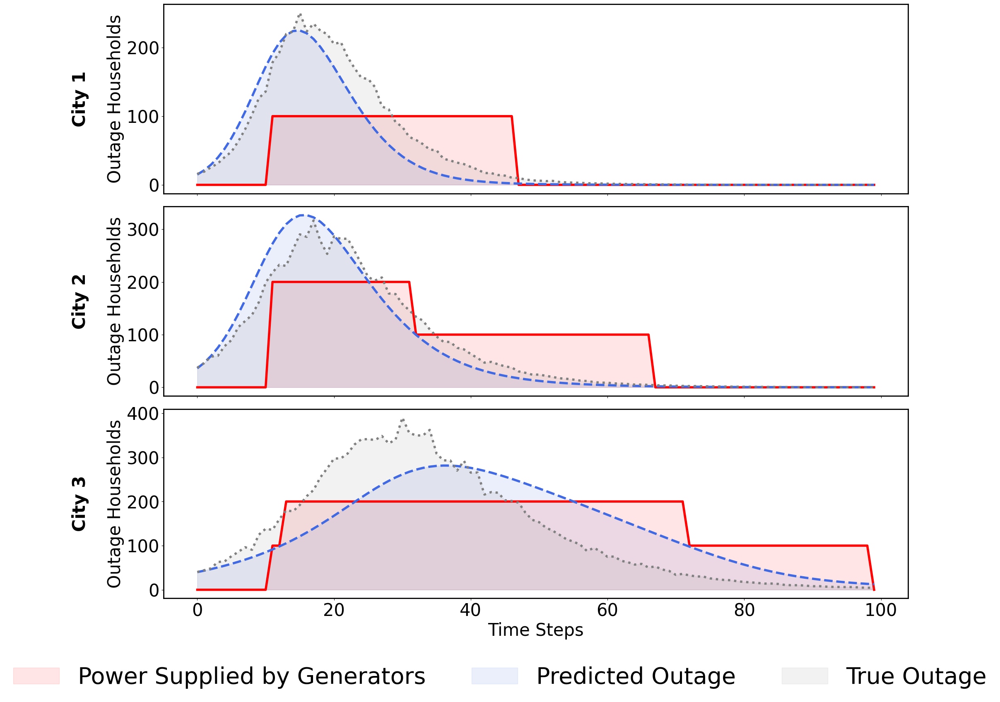

In [140]:
# plot ture data, dfl allocation, add prediciotion Y
plot_Y_pred_and_q_combined_two_Y(Y_true_np, Y_pred_np, q_np_pred, num_cities, N_g)

In [141]:
# # plot ture data, dfl allocation, add prediciotion Y
# plot_Y_pred_and_q_combined_two_Y(Y_true_np, Y_pred_np, q_np, num_cities, N_g)

In [142]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_three_rows_three_cities(Y_true_np,
                                 Y_dfl_pred_np, q_np_dfl,
                                 Y_pred_np, q_np_pred,
                                 q_true,
                                 N_g=100,
                                 save_path='plot_3models_by_city.pdf',
                                 save_page=True):
    """
    Creates a grid of subplots with one row per city and one column per model.

    There are three models (columns):
      - Column 0 (DFL Model): Plots true outages, DFL predicted outages, and DFL generator stock.
      - Column 1 (Prediction Model): Plots true outages, predicted outages, and predicted generator stock.
      - Column 2 (True Data): Plots true outages and true generator stock (no predicted outage curve).

    In every subplot:
      - The generator stock is plotted as a red solid line with a filled area.
        (The generator data is forced to start and end at zero and scaled by N_g.)
      - The true outage data (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For the first two models, the predicted outage is plotted as a light blue dashed line with a fill.

    Each row corresponds to a city. All subplots in a row share the same y-axis limits (i.e. same plot height),
    but different rows may have different y-axis limits.

    Parameters:
      - Y_true_np: NumPy array of true outages (shape: [time_steps, num_cities])
      - Y_dfl_pred_np: NumPy array of DFL predicted outages (shape: [time_steps, num_cities])
      - q_np_dfl: NumPy array of DFL generator stocks (shape: [time_steps, num_cities])
      - Y_pred_np: NumPy array of predicted outages (shape: [time_steps, num_cities])
      - q_np_pred: NumPy array of predicted generator stocks (shape: [time_steps, num_cities])
      - q_true: NumPy array of true generator stocks (shape: [time_steps, num_cities])
      - N_g: Scaling factor for generator stock (default: 100)
      - save_path: File path for saving the PDF (default: 'plot_3models_by_city.pdf')
      - save_page: Boolean flag. If True, the figure is saved to save_path.
    """
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Define fonts, colors, and line styles.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'

    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Model names for the columns.
    model_names = ['DFL Model', 'Prediction Model', 'True Data']

    # Create a grid of subplots: rows = cities, columns = models.
    # We share the x-axis across all subplots, but NOT the y-axis (we'll link y-axis per row manually).
    fig, axs = plt.subplots(nrows=num_cities, ncols=3, figsize=(18, 6 * num_cities), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Loop over cities (rows)
    for city in range(num_cities):
        # Pre-compute generator data for each model with modifications (force first and last value to 0, then scale).
        q0 = q_np_dfl[:, city].copy()
        q0[0] = 0; q0[-1] = 0
        q0_scaled = N_g * q0

        q1 = q_np_pred[:, city].copy()
        q1[0] = 0; q1[-1] = 0
        q1_scaled = N_g * q1

        q2 = q_true[:, city].copy()
        q2[0] = 0; q2[-1] = 0
        q2_scaled = N_g * q2

        # Prepare lists to collect data for setting y-limits.
        row_data = []

        # Loop over the three models (columns)
        for model in range(3):
            ax = axs[city, model]

            if model == 0:
                # DFL Model
                y_pred = Y_dfl_pred_np[:, city]
                q_data_scaled = q0_scaled
            elif model == 1:
                # Prediction Model
                y_pred = Y_pred_np[:, city]
                q_data_scaled = q1_scaled
            else:
                # True Data: no predicted outage curve.
                y_pred = None
                q_data_scaled = q2_scaled

            # Plot generator data (red).
            ax.fill_between(time, q_data_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_data_scaled, color=generator_color, linewidth=4)

            # Plot true outage data (grey, dotted).
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Add this data to the row_data list for y-limit computation.
            row_data.append(Y_true_np[:, city])
            row_data.append(q_data_scaled)

            # Plot predicted outage data (if available).
            if y_pred is not None:
                ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                row_data.append(y_pred)

            # Add model title to the top row.
            if city == 0:
                ax.set_title(model_names[model], fontsize=label_font_size, weight='bold')

            # Add city label on the leftmost column.
            if model == 0:
                ax.set_ylabel(f'City {city+1}', fontsize=label_font_size, weight='bold')

            # Style the axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

        # --- Compute common y-limits for this city (row) ---
        # Combine all the collected data for this row.
        row_data = np.concatenate(row_data)
        row_ymin = np.min(row_data)
        row_ymax = np.max(row_data)

        # Add a 10% margin to the y-range.
        row_range = row_ymax - row_ymin
        if row_range == 0:
            row_range = 1  # safeguard against division by zero
        margin = 0.1 * row_range
        new_ymin = row_ymin - margin
        new_ymax = row_ymax + margin

        # Set the same y-limits for all subplots in this row.
        for model in range(3):
            axs[city, model].set_ylim(new_ymin, new_ymax)

    # Shared x-axis label moved a bit higher.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create legend handles.
    legend_handles = [
        mpatches.Patch(color=generator_color, alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=predicted_color, alpha=0.1, label='Predicted Outage'),
        mpatches.Patch(color=true_color, alpha=0.1, label='True Outage')
    ]

    # Place the legend in the middle lower part of the figure (outside the subplots).
    fig.legend(handles=legend_handles, loc='lower center', ncol=3,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, -0.03))

    # Adjust layout to leave room for the legend.
    plt.tight_layout(rect=[0, 0.08, 1, 1])

    # Save the figure if requested.
    if save_page:
        plt.savefig(save_path, format='pdf', bbox_inches='tight')

    plt.show()


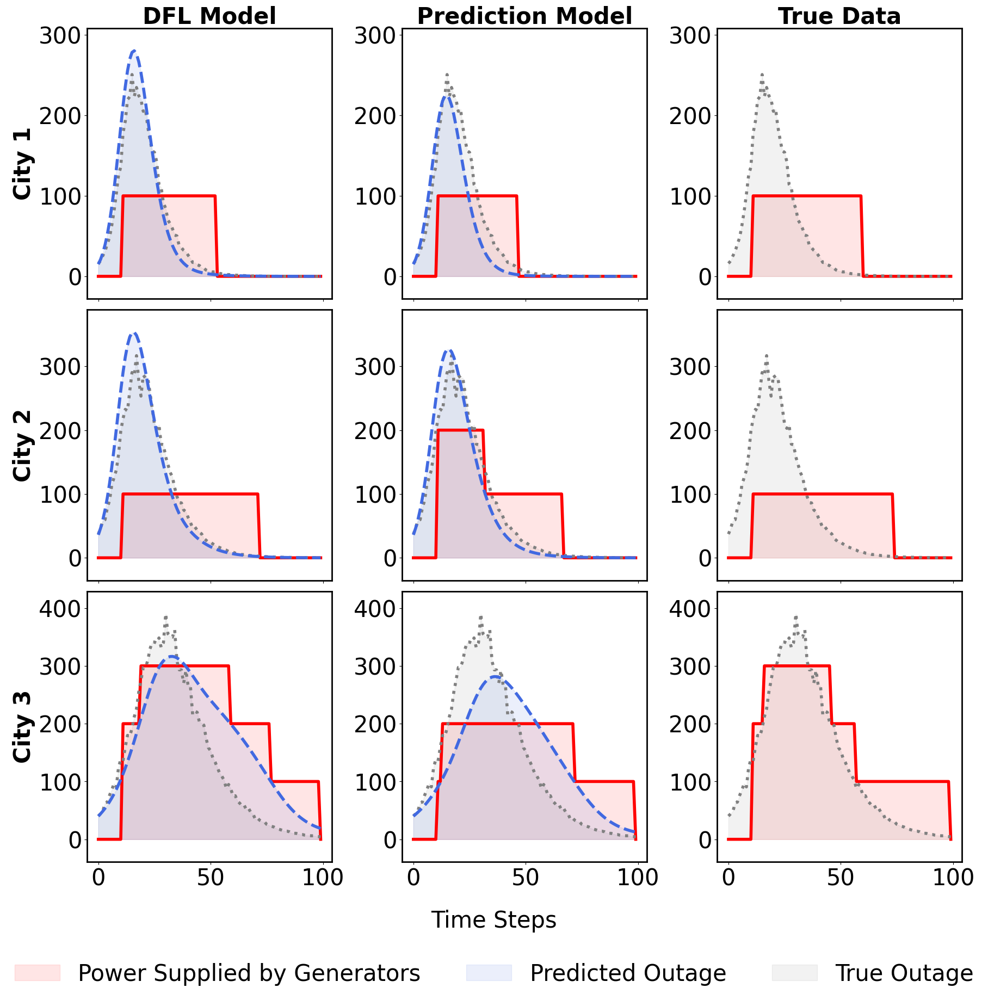

In [143]:
plot_three_rows_three_cities(Y_true_np, Y_pred_dfl_np, q_np_dfl,
                             Y_pred_np, q_np_pred,
                             q_np_opt,
                             N_g=100,
                             save_path=PLOT_PATH + 'plot_3rows.pdf')

In [144]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

###############################################################################
# 3-Row Plotting Function (rows = cities, columns = models)
###############################################################################
def plot_three_rows_three_cities_with_cost(Y_true_np,
                                           Y_dfl_pred_np, q_np_dfl,
                                           Y_pred_np, q_np_pred,
                                           q_true,
                                           N_g=100,
                                           total_costs=None,
                                           save_path='plot_3rows.pdf',
                                           save_page=True):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to cities.
      - Columns correspond to models:
           Column 0: GDP Model (uses q_np_dfl and Y_dfl_pred_np)
           Column 1: Prediction Model (uses q_np_pred and Y_pred_np)
           Column 2: Groundtruth (uses q_true; no predicted outage curve)

    In each subplot:
      - Generator stock (scaled by N_g and forced to start and end at zero) is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For the first two models, the predicted outage is plotted (blue dashed with light fill).

    If provided, `total_costs` (a list of 3 numbers) is used to augment the model title in the top row.

    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities)
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) (for GDP Model)
      - q_np_dfl: array, shape (time_steps, num_cities)
      - Y_pred_np: array, shape (time_steps, num_cities) (for Prediction Model)
      - q_np_pred: array, shape (time_steps, num_cities)
      - q_true: array, shape (time_steps, num_cities) (for Groundtruth)
      - N_g: scaling factor for generator stock
      - total_costs: list/array of 3 total cost values (order: GDP, Prediction, Groundtruth)
      - save_path: file path for saving the plot (PDF)
      - save_page: if True, the plot is saved to save_path.
    """
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Font and color settings.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'

    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Model names (updated)
    model_names = ["GDP Model", "Prediction Model", "Groundtruth"]

    # Create grid: rows = cities, columns = models.
    fig, axs = plt.subplots(nrows=num_cities, ncols=3,
                            figsize=(18, 6 * num_cities), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # (No need for global limits in this version; if you want to unify y-limits globally, see the next version.)
    for city in range(num_cities):
        for model in range(3):
            ax = axs[city, model]
            # Choose data based on model index.
            if model == 0:
                # GDP Model
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                # Prediction Model
                y_pred = Y_pred_np[:, city]
                q_arr = q_np_pred[:, city].copy()
            else:
                # Groundtruth: no predicted outage curve.
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero and scale.
            q_arr[0] = 0; q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator data.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage data.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Plot predicted outage data (if available).
            if y_pred is not None:
                ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)

            # For the top row, add the model title (with cost if available).
            if city == 0:
                title_str = model_names[model]
                if total_costs is not None and len(total_costs) > model:
                    title_str += f" (Cost: {total_costs[model]})"
                ax.set_title(title_str, fontsize=label_font_size, weight='bold')

            # Label the leftmost column with the city name.
            if model == 0:
                ax.set_ylabel(f'City {city+1}', fontsize=label_font_size, weight='bold')
            else:
                # Remove y-axis tick labels for columns 1 and 2.
                ax.tick_params(axis='y', labelleft=False)

            # Style the axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

    # Shared x-axis label (moved higher).
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create legend handles.
    legend_handles = [
        mpatches.Patch(color=generator_color, alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=predicted_color, alpha=0.1, label='Predicted Outage'),
        mpatches.Patch(color=true_color, alpha=0.1, label='True Outage')
    ]
    # Legend placed a bit higher (y coordinate -0.01).
    fig.legend(handles=legend_handles, loc='lower center', ncol=3,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, -0.01))

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    if save_page:
        plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()

###############################################################################
# 4-Row Plotting Function (rows = models, columns = cities)
###############################################################################
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

###############################################################################
# 4-Row Plotting Function (rows = models, columns = cities)
###############################################################################
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

###############################################################################
# 4-Row Plotting Function (rows = models, columns = cities)
###############################################################################
def plot_four_rows_three_cities_with_cost(Y_true_np,
                                          Y_dfl_pred_np, q_np_dfl,
                                          Y_pred_np, q_np_pred,
                                          q_baseline,  # additional input for greedy results
                                          q_true,
                                          N_g=100,
                                          total_costs=None,
                                          save_path='plot_4rows.pdf',
                                          save_page=True):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.

    The rows (from top to bottom) are:
      Row 0: GDP Model (uses q_np_dfl and Y_dfl_pred_np)
      Row 1: Prediction Model (uses q_np_pred and Y_pred_np)
      Row 2: Greedy Model (uses q_baseline; no predicted outage curve)
      Row 3: Groundtruth (uses q_true; no predicted outage curve)

    In each subplot:
      - Generator stock (scaled by N_g and forced to start and end at zero) is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For rows 0 and 1, the predicted outage is additionally plotted (blue dashed with light fill).
      - A light grey grid is overlaid.

    If provided, `total_costs` (a list/array of 4 numbers) is appended to the corresponding row titles.
    The leftmost column in every row shows the model name (and total cost, if available), and the y‑axis tick
    labels are removed for every subplot except those in the first column.

    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities)
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) (for GDP Model)
      - q_np_dfl: array, shape (time_steps, num_cities)
      - Y_pred_np: array, shape (time_steps, num_cities) (for Prediction Model)
      - q_np_pred: array, shape (time_steps, num_cities)
      - q_baseline: array, shape (time_steps, num_cities) (for Greedy Model)
      - q_true: array, shape (time_steps, num_cities) (for Groundtruth)
      - N_g: scaling factor for generator stock
      - total_costs: list/array of 4 total cost values (order: GDP, Prediction, Greedy, Groundtruth)
      - save_path: file path for saving the plot (PDF)
      - save_page: if True, the plot is saved.
    """
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Font and color settings.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'

    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Model names for the rows.
    model_names = ["GDP Model", "Prediction Model", "Online", "Groundtruth"]

    # Create grid: rows = models, columns = cities.
    fig, axs = plt.subplots(nrows=4, ncols=num_cities,
                            figsize=(6 * num_cities, 6 * 4), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Initialize list for global y-data.
    global_data = []

    # Loop over models (rows) and cities (columns)
    for model in range(4):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data based on model.
            if model == 0:
                # GDP Model
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                # Prediction Model
                y_pred = Y_pred_np[:, city]
                q_arr = q_np_pred[:, city].copy()
            elif model == 2:
                # Greedy Model
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                # Groundtruth
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero and scale.
            q_arr[0] = 0; q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator data.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Append data for global y-limit.
            global_data.append(Y_true_np[:, city])
            global_data.append(q_scaled)

            # For rows 0 and 1, plot predicted outage.
            if y_pred is not None:
                ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                global_data.append(y_pred)

            # For the top row, set the column title.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=label_font_size, weight='bold')
            # Remove y-axis tick labels for any subplot not in the first column.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style the axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

            # Add a light grey grid.
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

        # End of inner loop over cities.
        # Set the left-most subplot's y-label for this row (model name plus total cost if available).
        title_str = model_names[model]
        if total_costs is not None and len(total_costs) > model:
            title_str += f" (Cost: {total_costs[model]})"
        axs[model, 0].set_ylabel(title_str, fontsize=label_font_size, weight='bold')

    # Compute global y-limits from all data.
    global_data = np.concatenate(global_data)
    global_ymin = np.min(global_data)
    global_ymax = np.max(global_data)
    global_range = global_ymax - global_ymin if global_ymax != global_ymin else 1
    margin = 0.1 * global_range
    new_ymin, new_ymax = global_ymin - margin, global_ymax + margin

    # Set the same y-limits for every subplot.
    for model in range(4):
        for city in range(num_cities):
            axs[model, city].set_ylim(new_ymin, new_ymax)

    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Legend handles.
    legend_handles = [
        mpatches.Patch(color=generator_color, alpha=0.1, label='Power Supplied by Generators'),
        mpatches.Patch(color=predicted_color, alpha=0.1, label='Predicted Outage'),
        mpatches.Patch(color=true_color, alpha=0.1, label='True Outage')
    ]
    # Place legend a bit higher (using bbox_to_anchor=(0.5, -0.01)).
    fig.legend(handles=legend_handles, loc='lower center', ncol=3,
               fontsize=legend_font_size, frameon=False, bbox_to_anchor=(0.5, -0.01))

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    if save_page:
        plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


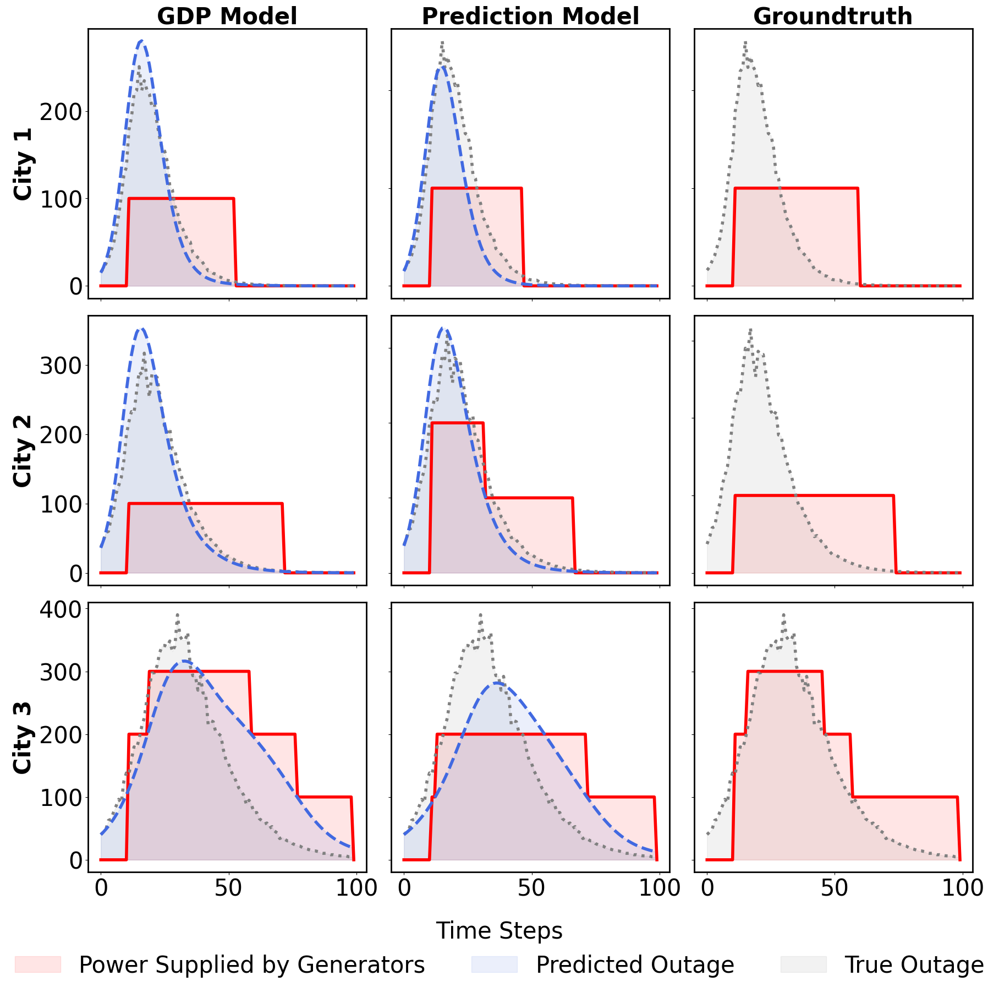

In [145]:
plot_three_rows_three_cities_with_cost(Y_true_np, Y_pred_dfl_np, q_np_dfl,
                             Y_pred_np, q_np_pred,
                             q_np_opt,
                             N_g=100,
                            #  total_costs = [6648.07,7479.52,6457.12],
                             save_path=PLOT_PATH + 'plot_3rows.pdf')

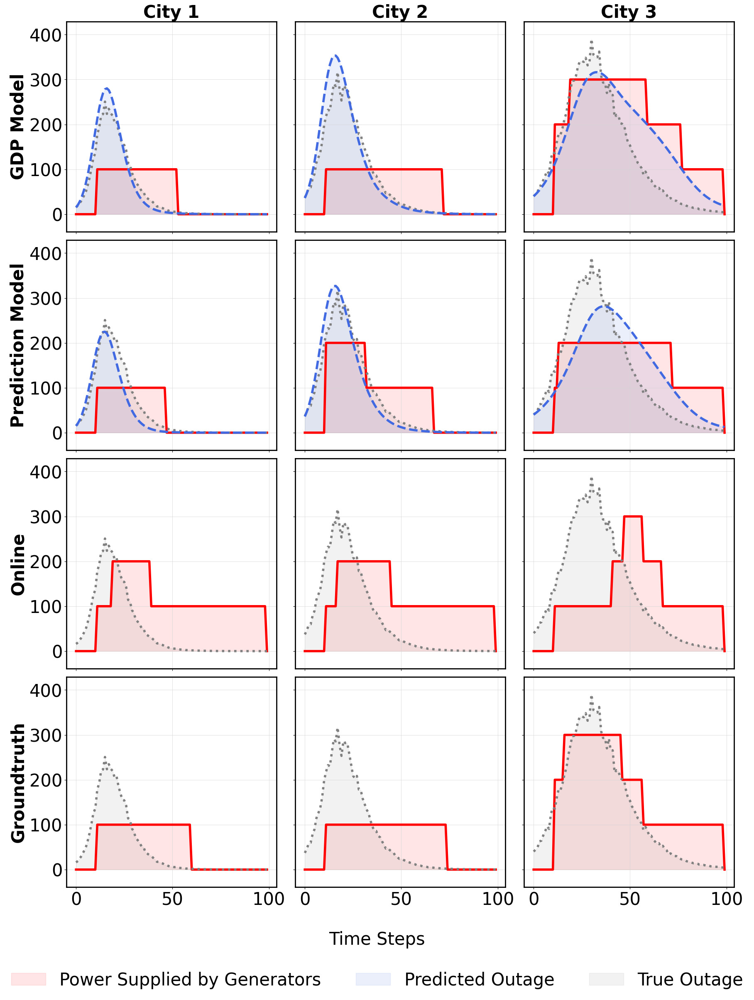

In [146]:
plot_four_rows_three_cities_with_cost(Y_true_np, Y_pred_dfl_np, q_np_dfl,
                             Y_pred_np, q_np_pred,q_baseline,
                             q_np_opt,
                             N_g=100,
                             save_path=PLOT_PATH + 'plot_4rows.pdf')

# travel cost = 100
# 2000 + 200 epochs training
# 6642, 6648, 8313, 6457
# travel cost = 200
# 8010.55, 8048.07, 11513.17, 7657.12

In [147]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['text.usetex'] = True

In [148]:
def plot_four_rows_three_cities_with_cost_mse(Y_true_np,
                                              Y_dfl_pred_np, q_np_dfl,
                                              Y_pred_np, q_np_pred,
                                              q_baseline,  # for Greedy (Online) Model
                                              q_true,
                                              N_g=100,
                                              save_path='plot_4rows.pdf',
                                              tau=1.0,
                                              transport_cost_per_gen=1.0,
                                              gamma=1.0,
                                              solution_dfl=None,    # for GDF Model
                                              solution_pred=None,   # for Two-stage Model
                                              solution_baseline=None,  # for Online Model
                                              solution_gt=None,     # for Groundtruth
                                              mse_error_dfl=None,   # MSE error for GDF model
                                              mse_error_pred=None   # MSE error for Two-stage model
                                             ):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl and Y_dfl_pred_np; solution: solution_dfl)
      Row 1: Two-stage (uses q_np_pred and Y_pred_np; solution: solution_pred)
      Row 2: Online (Greedy; uses q_baseline; solution: solution_baseline)
      Row 3: Groundtruth (uses q_true; solution: solution_gt)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps) is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For rows 0 and 1, the predicted outage is additionally plotted (blue dashed with a light fill).
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost. For rows 0 and 1, the
    MSE error is also displayed.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) (predicted outages for GDF Model).
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for GDF Model).
      - Y_pred_np: array, shape (time_steps, num_cities) (predicted outages for Two-stage Model).
      - q_np_pred: array, shape (time_steps, num_cities) (generator stocks for Two-stage Model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for Online Model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_pred: dictionary solution for the Two-stage Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
      - mse_error_dfl: MSE error for the GDF model.
      - mse_error_pred: MSE error for the Two-stage model.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Font and color settings.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Model names for each row (using math mode for proper formatting).
    model_names = [r"$\mathtt{GDF}$", "Two Stage", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # Assume compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost)
    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_pred, _, _, _ = compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model (difference between model cost and ground truth cost).
    regret_dfl = cost_dfl - cost_gt
    regret_pred = cost_pred - cost_gt
    regret_baseline = cost_baseline - cost_gt

    # Prepare annotation text for each row.
    annotations = {
        0: f"Regret: {regret_dfl:.2f}" + (f"\nMSE: {mse_error_dfl:.2f}" if mse_error_dfl is not None else ""),
        1: f"Regret: {regret_pred:.2f}" + (f"\nMSE: {mse_error_pred:.2f}" if mse_error_pred is not None else ""),
        2: f"Regret: {regret_baseline:.2f}",
        3: ""
    }

    # Create grid: 4 rows (models) x num_cities columns.
    fig, axs = plt.subplots(nrows=4, ncols=num_cities,
                            figsize=(6 * num_cities, 6 * 4), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # List to collect all y-data for consistent y-limits.
    global_data = []

    # Loop over each model (row) and city (column).
    for model in range(4):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data based on model.
            if model == 0:
                # GDF: use DFL predictions and corresponding generator stocks.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                # Two-stage Model.
                y_pred = Y_pred_np[:, city]
                q_arr = q_np_pred[:, city].copy()
            elif model == 2:
                # Online Model.
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                # Groundtruth.
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force the first and last generator values to zero and scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot the generator stock (red area with solid red line).
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot the true outage (grey area with dotted line).
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Append data for global y-limit computation.
            global_data.append(Y_true_np[:, city])
            global_data.append(q_scaled)

            # For rows 0 and 1, plot the predicted outage (blue area with dashed line).
            if y_pred is not None:
                ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                global_data.append(y_pred)

            # For the first row (model 0), set the title for each city.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=label_font_size, weight='bold')
            # Remove y-axis tick labels for subplots not in the first column.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style the subplot axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

            # Add a light grey grid.
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            # In the last column of each row, add annotation text (if available).
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Set the y-label of the leftmost subplot for this row.
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # Compute global y-limits from all collected data.
    global_data = np.concatenate(global_data)
    global_ymin = np.min(global_data)
    global_ymax = np.max(global_data)
    global_range = global_ymax - global_ymin if global_ymax != global_ymin else 1
    margin = 0.1 * global_range
    new_ymin, new_ymax = global_ymin - margin, global_ymax + margin

    # Set uniform y-limits for all subplots.
    for model in range(4):
        for city in range(num_cities):
            axs[model, city].set_ylim(new_ymin, new_ymax)

    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create custom legend handles that exactly match the plotted areas and lines.
    from matplotlib.colors import to_rgba
    # For generator (red): facecolor with alpha 0.1 and edgecolor fully opaque.
    gdf_face = to_rgba(generator_color, alpha=0.1)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    # For predicted outage (blue).
    pred_face = to_rgba(predicted_color, alpha=0.1)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    # For true outage (grey).
    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    # Build the legend.
    fig.legend([gdf_handle, pred_handle, true_handle],
               [r'Power Supplied by Generators', 'Predicted Outage', 'True Outage'],
               fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.01))

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


In [149]:
tau = 1

In [150]:
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False

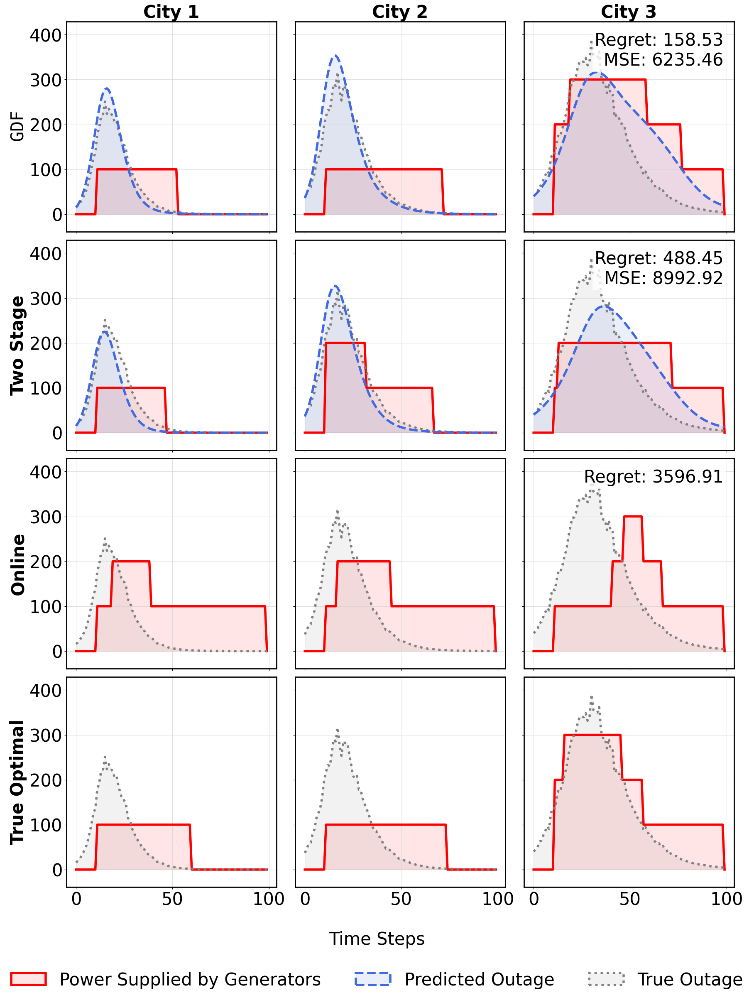

In [151]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"plot_4rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_four_rows_three_cities_with_cost_mse(
    Y_true_np,
    Y_pred_dfl_np,
    q_np_dfl,
    Y_pred_np,
    q_np_pred,
    q_baseline,
    q_np_opt,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_pred=solution_pred,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt,
    mse_error_dfl=mse_error_dfl,
    mse_error_pred=mse_error_pred
)


In [152]:
def plot_three_rows_three_cities_with_cost_mse(Y_true_np,
                                              Y_dfl_pred_np, q_np_dfl,
                                              q_baseline,  # for Greedy (Online) Model
                                              q_true,
                                              N_g=100,
                                              save_path='plot_4rows.pdf',
                                              tau=1.0,
                                              transport_cost_per_gen=1.0,
                                              gamma=1.0,
                                              solution_dfl=None,    # for GDF Model
                                              solution_baseline=None,  # for Online Model
                                              solution_gt=None
                                             ):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl and Y_dfl_pred_np; solution: solution_dfl)
      Row 1: Online (Greedy; uses q_baseline; solution: solution_baseline)
      Row 2: Groundtruth (uses q_true; solution: solution_gt)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps) is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For row 0, the predicted outage is additionally plotted (blue dashed with a light fill).
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) (predicted outages for GDF Model).
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for GDF Model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for Online Model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Font and color settings.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Model names for each row (using math mode for proper formatting).
    model_names = [r"$\mathtt{GDF}$", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # Assume compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost)
    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model (difference between model cost and ground truth cost).
    regret_dfl = cost_dfl - cost_gt
    regret_baseline = cost_baseline - cost_gt

    # Prepare annotation text for each row.
    annotations = {
        0: f"Regret: {regret_dfl:.2f}",
        1: f"Regret: {regret_baseline:.2f}",
        2: ""
    }

    # Create grid: 3 rows (models) x num_cities columns.
    fig, axs = plt.subplots(nrows=3, ncols=num_cities,
                            figsize=(6 * num_cities, 6 * 3), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # List to collect all y-data for consistent y-limits.
    global_data = []

    # Loop over each model (row) and city (column).
    for model in range(3):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data based on model.
            if model == 0:
                # GDF: use DFL predictions and corresponding generator stocks.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                # Online Model.
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                # Groundtruth.
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force the first and last generator values to zero and scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot the generator stock (red area with solid red line).
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot the true outage (grey area with dotted line).
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Append data for global y-limit computation.
            global_data.append(Y_true_np[:, city])
            global_data.append(q_scaled)

            # For row 0, plot the predicted outage (blue area with dashed line).
            if model == 0 and y_pred is not None:
                ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                global_data.append(y_pred)

            # For the first row (model 0), set the title for each city with extra padding.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=label_font_size, weight='bold', pad=20)
            # Remove y-axis tick labels for subplots not in the first column.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style the subplot axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

            # Add a light grey grid.
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            # In the last column of each row, add annotation text (if available).
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Set the y-label of the leftmost subplot for this row.
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # Compute global y-limits from all collected data.
    global_data = np.concatenate(global_data)
    global_ymin = np.min(global_data)
    global_ymax = np.max(global_data)
    global_range = global_ymax - global_ymin if global_ymax != global_ymin else 1
    margin = 0.1 * global_range
    new_ymin, new_ymax = global_ymin - margin, global_ymax + margin

    # Set uniform y-limits for all subplots.
    for model in range(3):
        for city in range(num_cities):
            axs[model, city].set_ylim(new_ymin, new_ymax)

    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create custom legend handles that exactly match the plotted areas and lines.
    from matplotlib.colors import to_rgba
    # For generator (red): facecolor with alpha 0.1 and edgecolor fully opaque.
    gdf_face = to_rgba(generator_color, alpha=0.1)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    # For predicted outage (blue).
    pred_face = to_rgba(predicted_color, alpha=0.1)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    # For true outage (grey).
    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    # Build the legend.
    fig.legend([gdf_handle, pred_handle, true_handle],
               [r'Power Supplied by Generators', 'Predicted Outage', 'True Outage'],
               fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.01))

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


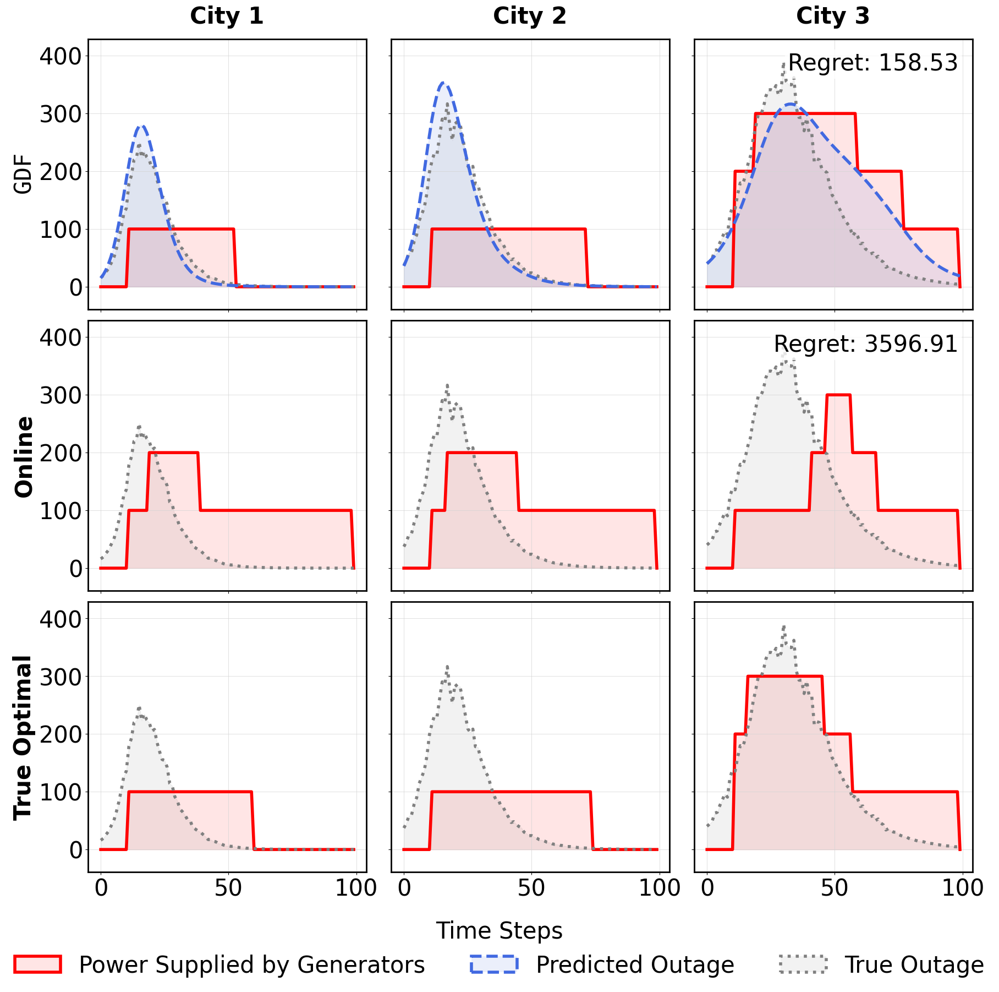

In [153]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"plot_3rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_three_rows_three_cities_with_cost_mse(
    Y_true_np,
    Y_pred_dfl_np,
    q_np_dfl,
    q_baseline,
    q_np_opt,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt
)


In [154]:
def plot_three_rows_three_cities_with_cost_mse_SIR(Y_true_np,
                                               Y_dfl_pred_np,
                                                                                               S_dfl_pred_np,    # DFL predicted S time series, shape (time_steps, num_cities)
                                               R_dfl_pred_np,    # DFL predicted R time series, shape (time_steps, num_cities)
                                                 q_np_dfl,
                                               q_baseline,  # for Greedy (Online) Model
                                               q_true,

                                               N_g=100,
                                               save_path='plot_4rows.pdf',
                                               tau=1.0,
                                               transport_cost_per_gen=1.0,
                                               gamma=1.0,
                                               solution_dfl=None,       # for GDF Model
                                               solution_baseline=None,  # for Online Model
                                               solution_gt=None):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl, Y_dfl_pred_np, S_dfl_pred_np, and R_dfl_pred_np)
      Row 1: Online (Greedy; uses q_baseline)
      Row 2: Groundtruth (uses q_true)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps)
        is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For row 0:
          - The predicted outage (Y_dfl_pred_np) is plotted as a blue dashed line with a light fill.
          - Additionally, the predicted susceptible (S_dfl_pred_np) and recovered (R_dfl_pred_np)
            curves are plotted. For the third city only, these curves appear on a second (twin) y-axis.
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) of predicted outages for the DFL (GDF) model.
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for the DFL model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for the Online model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - S_dfl_pred_np: array, shape (time_steps, num_cities) of predicted S values (DFL model).
      - R_dfl_pred_np: array, shape (time_steps, num_cities) of predicted R values (DFL model).
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Font and color settings.
    label_font_size = 30
    legend_font_size = 30
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Colors for additional DFL curves.
    S_dfl_color = "mediumseagreen"
    R_dfl_color = "darkorange"

    # Model names for each row.
    model_names = [r"$\mathtt{GDF}$", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # Assume compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost)
    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model (difference between model cost and ground truth cost).
    regret_dfl = cost_dfl - cost_gt
    regret_baseline = cost_baseline - cost_gt

    # Prepare annotation text for each row.
    annotations = {
        0: f"Regret: {regret_dfl:.2f}",
        1: f"Regret: {regret_baseline:.2f}",
        2: ""
    }

    # Create grid: 3 rows (models) x num_cities columns.
    fig, axs = plt.subplots(nrows=3, ncols=num_cities,
                            figsize=(6 * num_cities, 6 * 3), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # List to collect all y-data for consistent y-limits.
    global_data = []

    # Loop over each model (row) and city (column).
    for model in range(3):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data based on model.
            if model == 0:
                # GDF: use DFL predictions and corresponding generator stocks.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                # Online Model.
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                # Groundtruth.
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force the first and last generator values to zero and scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot the generator stock (red area with solid red line).
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot the true outage (grey area with dotted line).
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # Append data for global y-limit computation.
            global_data.append(Y_true_np[:, city])
            global_data.append(q_scaled)

            # For row 0, plot the predicted outage and additional DFL curves.
            if model == 0:
                if y_pred is not None:
                    ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                    ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                    global_data.append(y_pred)
                # Retrieve the predicted S and R for this city.
                S_dfl = S_dfl_pred_np[:, city]
                R_dfl = R_dfl_pred_np[:, city]
                # For the third city, use a secondary y-axis for S and R.
                if city == 2:
                    ax2 = ax.twinx()
                    ax2.fill_between(time, S_dfl, color=S_dfl_color, alpha=0.15)
                    ax2.plot(time, S_dfl, linestyle="-", color=S_dfl_color, linewidth=4)
                    ax2.fill_between(time, R_dfl, color=R_dfl_color, alpha=0.15)
                    ax2.plot(time, R_dfl, linestyle="-", color=R_dfl_color, linewidth=4)
                    # Optionally style the secondary axis.
                    # ax2.tick_params(axis='y', labelsize=label_font_size, colors=R_dfl_color)
                    ax2.tick_params(axis='y', labelsize=label_font_size)

                    ax2.grid(False)
                    global_data.append(S_dfl)
                    global_data.append(R_dfl)
                else:
                    # For other cities in row 0, plot S and R on the primary axis.
                    ax.fill_between(time, S_dfl, color=S_dfl_color, alpha=0.15)
                    ax.plot(time, S_dfl, linestyle="-", color=S_dfl_color, linewidth=4)
                    ax.fill_between(time, R_dfl, color=R_dfl_color, alpha=0.15)
                    ax.plot(time, R_dfl, linestyle="-", color=R_dfl_color, linewidth=4)
                    global_data.append(S_dfl)
                    global_data.append(R_dfl)

            # For the first row, set the title for each city with extra padding.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=label_font_size, weight='bold', pad=20)
            # Remove y-axis tick labels for subplots not in the first column.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style the subplot axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)

            # Add a light grey grid.
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            # In the last column of each row, add annotation text (if available).
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Set the y-label of the leftmost subplot for this row.
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # Compute global y-limits from all collected data.
    global_data = np.concatenate(global_data)
    global_ymin = np.min(global_data)
    global_ymax = np.max(global_data)
    global_range = global_ymax - global_ymin if global_ymax != global_ymin else 1
    margin = 0.1 * global_range
    new_ymin, new_ymax = global_ymin - margin, global_ymax + margin

    # Set uniform y-limits for all subplots (only the primary axes).
    for model in range(3):
        for city in range(num_cities):
            axs[model, city].set_ylim(new_ymin, new_ymax)

    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create custom legend handles.
    # For generator (red).
    gdf_face = to_rgba(generator_color, alpha=0.1)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)
    # For predicted outage (blue).
    pred_face = to_rgba(predicted_color, alpha=0.1)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)
    # For true outage (grey).
    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)
    # For predicted S (mediumseagreen).
    S_face = to_rgba(S_dfl_color, alpha=0.15)
    S_edge = to_rgba(S_dfl_color, alpha=1.0)
    S_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=S_face, edgecolor=S_edge, lw=4)
    S_handle.set_linestyle("-")
    # For predicted R (darkorange).
    R_face = to_rgba(R_dfl_color, alpha=0.15)
    R_edge = to_rgba(R_dfl_color, alpha=1.0)
    R_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=R_face, edgecolor=R_edge, lw=4)
    R_handle.set_linestyle("-")

    # Create two separate legends (two lines).
    legend1 = fig.legend(handles=[gdf_handle, pred_handle, true_handle],
                         labels=[r'Power Supplied by Generators', 'Predicted Outage', 'True Outage'],
                         fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
                         bbox_to_anchor=(0.5, -0.07))
    legend2 = fig.legend(handles=[S_handle, R_handle],
                         labels=['Predicted S (DFL)', 'Predicted R (DFL)'],
                         fontsize=legend_font_size, frameon=False, loc='lower center', ncol=2,
                         bbox_to_anchor=(0.5, -0.15))
    fig.add_artist(legend1)

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


In [155]:
def plot_three_rows_three_cities_with_cost_mse_SIR(Y_true_np,
                                                   Y_dfl_pred_np,
                                                   S_dfl_pred_np,    # DFL predicted S time series, shape (time_steps, num_cities)
                                                   R_dfl_pred_np,    # DFL predicted R time series, shape (time_steps, num_cities)
                                                   q_np_dfl,
                                                   q_baseline,  # for Greedy (Online) Model
                                                   q_true,
                                                   N_g=100,
                                                   save_path='plot_4rows.pdf',
                                                   tau=1.0,
                                                   transport_cost_per_gen=1.0,
                                                   gamma=1.0,
                                                   solution_dfl=None,       # for GDF Model
                                                   solution_baseline=None,  # for Online Model
                                                   solution_gt=None):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl, Y_dfl_pred_np, S_dfl_pred_np, and R_dfl_pred_np)
      Row 1: Online (Greedy; uses q_baseline)
      Row 2: Groundtruth (uses q_true)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps)
        is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For row 0:
          - The predicted outage (Y_dfl_pred_np) is plotted as a blue dashed line with a light fill.
          - Additionally, the predicted susceptible (S_dfl_pred_np) and recovered (R_dfl_pred_np)
            curves are plotted. For the third city only, these curves appear on a second (twin) y-axis.
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) of predicted outages for the DFL (GDF) model.
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for the DFL model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for the Online model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - S_dfl_pred_np: array, shape (time_steps, num_cities) of predicted S values.
      - R_dfl_pred_np: array, shape (time_steps, num_cities) of predicted R values.
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
      - font: (optional) dict to control font sizes; e.g. {'label':30, 'legend':30, 'title':30}
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba
    # Set default font sizes if not provided.
    font = {'label': 38, 'legend': 36, 'title': 38}
    label_font_size = font['label']
    legend_font_size = font['legend']
    title_font_size = font.get('title', label_font_size)

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Color and line settings.
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Colors for additional DFL curves.
    S_dfl_color = "darkorange"
    R_dfl_color = "mediumseagreen"
    # Decreased alpha for S and R curves.
    sr_fill_alpha = 0.0
    sr_line_alpha = 0.4

    # Model names.
    model_names = [r"$\mathtt{GDF}$", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # (Assuming compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost))
    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model.
    regret_dfl = cost_dfl - cost_gt
    regret_baseline = cost_baseline - cost_gt

    # Prepare annotation text.
    annotations = {
        0: f"Regret: {regret_dfl:.2f}",
        1: f"Regret: {regret_baseline:.2f}",
        2: ""
    }

    # Create grid.
    fig, axs = plt.subplots(nrows=3, ncols=num_cities,
                            figsize=(8 * num_cities, 6 * 3), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Loop over rows and columns.
    for model in range(3):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data.
            if model == 0:
                # DFL row.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero, then scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator stock.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.1)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # For DFL row, plot predicted outage and additional curves.
            if model == 0:
                if y_pred is not None:
                    ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                    ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                S_dfl = S_dfl_pred_np[:, city]
                R_dfl = R_dfl_pred_np[:, city]
                # For third city, use a twin y-axis.
                ax2 = ax.twinx()
                ax2.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, S_dfl, linestyle=predicted_line_style, color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, R_dfl, linestyle=predicted_line_style, color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.tick_params(axis='y', labelsize=label_font_size)
                ax2.grid(False)
                # Set right y-axis limit to 1.1 times the maximum over all DFL row data.
                global_right_max = 1.1 * max(np.max(Y_dfl_pred_np),
                                                np.max(S_dfl_pred_np),
                                                np.max(R_dfl_pred_np))
                ax2.set_ylim(0, global_right_max)

                if city !=2:
                    ax2.tick_params(axis='y', labelright=False)


                    # ax.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, S_dfl, linestyle="-", color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                    # ax.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, R_dfl, linestyle="-", color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)

            # Set title for DFL row.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=title_font_size, weight='bold', pad=20)
            # Remove y-axis tick labels for non-first columns.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            # Add annotation in the last column.
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # For the DFL row (row 0), set left y-axis limits to 1.1 times the maximum over Y_true and Y_dfl_pred.
    left_ylim_max = 1.3 * max(np.max(Y_true_np), np.max(Y_dfl_pred_np))
    for city in range(num_cities):
         axs[0, city].set_ylim(0, left_ylim_max)
         axs[1, city].set_ylim(0, left_ylim_max)
         axs[2, city].set_ylim(0, left_ylim_max)



    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create legend handles.
    gdf_face = to_rgba(generator_color, alpha=0.1)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    pred_face = to_rgba(predicted_color, alpha=0.1)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    S_face = to_rgba(S_dfl_color, alpha=sr_fill_alpha)
    S_edge = to_rgba(S_dfl_color, alpha=1.0)
    S_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=S_face, edgecolor=S_edge, lw=4)
    # S_handle.set_linestyle("-")
    S_handle.set_linestyle(predicted_line_style)


    R_face = to_rgba(R_dfl_color, alpha=sr_fill_alpha)
    R_edge = to_rgba(R_dfl_color, alpha=1.0)
    R_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=R_face, edgecolor=R_edge, lw=4)
    # R_handle.set_linestyle("-")
    R_handle.set_linestyle(predicted_line_style)


    # Create two separate legends.
    # legend1 = fig.legend(handles=[gdf_handle, pred_handle, true_handle],
    #                      labels=[r'Power Supplied by Generators', 'Predicted Outaged', 'True Outaged'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
    #                      bbox_to_anchor=(0.5, -0.07))
    # legend2 = fig.legend(handles=[S_handle, R_handle],
    #                      labels=['Predicted Unaffected', 'Predicted Rescored'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=2,
    #                      bbox_to_anchor=(0.5, -0.15))
    all_handles = [pred_handle, gdf_handle, S_handle, true_handle, R_handle]
    all_labels = [r'Predicted Outaged ($\hat{Y}$)', 
                  r'Power Supplied by Generators ($N_g \cdot x^*$)',  
                  r'Predicted Unaffected ($\hat{U}$)', 
                  r'True Outaged ($Y$)', 
                  r'Predicted Restored ($\hat{R}$)']
    legend = fig.legend(handles=all_handles, labels=all_labels,
                        fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
                        bbox_to_anchor=(0.5, -0.07))
    # fig.add_artist(legend1)

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


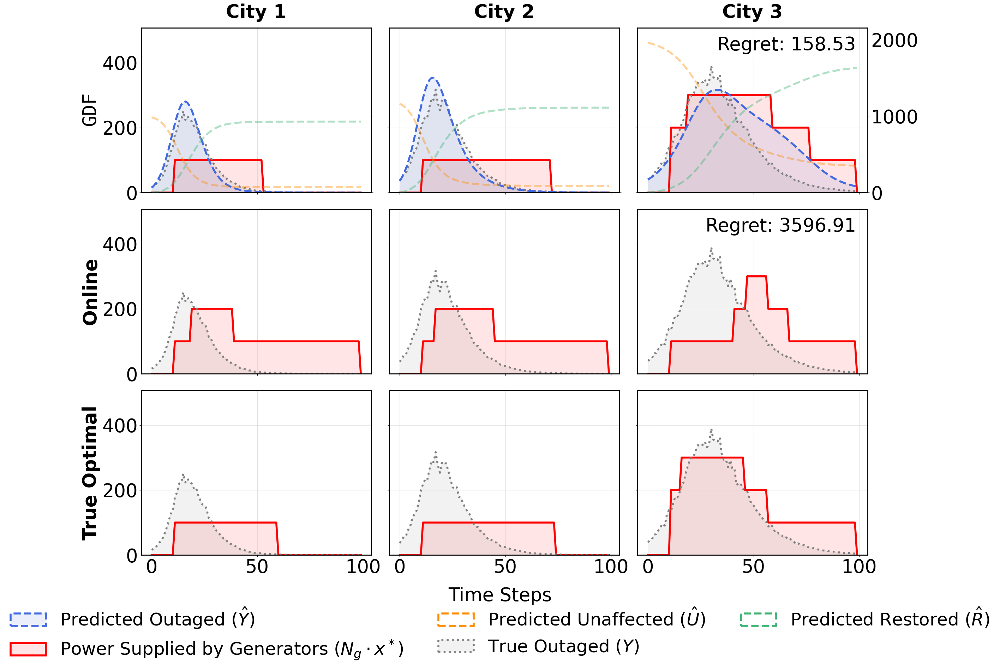

In [156]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"SIR_plot_3rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_three_rows_three_cities_with_cost_mse_SIR(
    Y_true_np,
    Y_pred_dfl_np,
    S_pred_dfl_np,
    R_pred_dfl_np,
    q_np_dfl,
    q_baseline,
    q_np_opt,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt
)


In [157]:
def plot_four_rows_three_cities_with_cost_mse_SIR(Y_true_np,
                                                   Y_pred_np,
                                                   Y_dfl_pred_np,
                                                   S_dfl_pred_np,    # DFL predicted S time series, shape (time_steps, num_cities)
                                                   R_dfl_pred_np,    # DFL predicted R time series, shape (time_steps, num_cities)
                                                   q_np_dfl,
                                                   q_baseline,  # for Greedy (Online) Model
                                                   q_true,
                                                   q_pred,
                                                   N_g=100,
                                                   save_path='plot_4rows.pdf',
                                                   tau=1.0,
                                                   transport_cost_per_gen=1.0,
                                                   gamma=1.0,
                                                   solution_dfl=None,       # for GDF Model
                                                   solution_pred = None,
                                                   solution_baseline=None,  # for Online Model
                                                   solution_gt=None,
                                                   mse_error_dfl= None,
                                                   mse_error_pred = None):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl, Y_dfl_pred_np, S_dfl_pred_np, and R_dfl_pred_np)
      Row 1: Online (Greedy; uses q_baseline)
      Row 2: Groundtruth (uses q_true)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps)
        is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For row 0:
          - The predicted outage (Y_dfl_pred_np) is plotted as a blue dashed line with a light fill.
          - Additionally, the predicted susceptible (S_dfl_pred_np) and recovered (R_dfl_pred_np)
            curves are plotted. For the third city only, these curves appear on a second (twin) y-axis.
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) of predicted outages for the DFL (GDF) model.
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for the DFL model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for the Online model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - S_dfl_pred_np: array, shape (time_steps, num_cities) of predicted S values.
      - R_dfl_pred_np: array, shape (time_steps, num_cities) of predicted R values.
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
      - font: (optional) dict to control font sizes; e.g. {'label':30, 'legend':30, 'title':30}
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba
    # Set default font sizes if not provided.
    font = {'label': 38, 'legend': 36, 'title': 38}
    label_font_size = font['label']
    legend_font_size = font['legend']
    title_font_size = font.get('title', label_font_size)

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Color and line settings.
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Colors for additional DFL curves.
    S_dfl_color = "darkorange"
    R_dfl_color = "mediumseagreen"
    # Decreased alpha for S and R curves.
    sr_fill_alpha = 0.0
    sr_line_alpha = 0.7

    # Model names.
    model_names = [r"$\mathtt{GDF}$", "Two-stage", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # (Assuming compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost))
    # cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    # cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    # cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)
    # cost_pred, _, _, _ = compute_total_cost(Y_pred_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)

    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_pred, _, _, _ = compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model.
    regret_dfl = cost_dfl - cost_gt
    regret_baseline = cost_baseline - cost_gt
    regret_pred = cost_pred - cost_gt

    # # Prepare annotation text.
    # annotations = {
    #     0: f"Regret: {regret_dfl:.2f}",
    #     1: f"Regret: {regret_pred:.2f}",
    #     2: f"Regret: {regret_baseline:.2f}",
    #     3: ""
    # }

    annotations = {
        0: f"Regret: {regret_dfl:.2f}" + (f"\nMSE: {mse_error_dfl:.2f}" if mse_error_dfl is not None else ""),
        1: f"Regret: {regret_pred:.2f}" + (f"\nMSE: {mse_error_pred:.2f}" if mse_error_pred is not None else ""),
        2: f"Regret: {regret_baseline:.2f}",
        3: ""
    }

    # Create grid.
    fig, axs = plt.subplots(nrows=4, ncols=num_cities,
                            figsize=(8 * num_cities, 6 * 5), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Loop over rows and columns.
    for model in range(4):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data.
            if model == 0:
                # DFL row.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                y_pred = Y_pred_np[:, city]
                q_arr = q_pred[:, city].copy()

            elif model == 2:
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero, then scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator stock.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.05)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)


            # For DFL row, plot predicted outage and additional curves.
            if model == 0:
                if y_pred is not None:
                    # ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                    ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                S_dfl = S_dfl_pred_np[:, city]
                R_dfl = R_dfl_pred_np[:, city]
                # For third city, use a twin y-axis.
                ax2 = ax.twinx()
                ax2.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, S_dfl, linestyle=predicted_line_style, color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, R_dfl, linestyle=predicted_line_style, color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.tick_params(axis='y', labelsize=label_font_size)
                ax2.grid(False)
                # Set right y-axis limit to 1.1 times the maximum over all DFL row data.
                global_right_max = 1.1 * max(np.max(Y_dfl_pred_np),
                                                np.max(S_dfl_pred_np),
                                                np.max(R_dfl_pred_np))
                ax2.set_ylim(0, global_right_max)

                if city !=2:
                    ax2.tick_params(axis='y', labelright=False)


                    # ax.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, S_dfl, linestyle="-", color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                    # ax.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, R_dfl, linestyle="-", color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)

            # Set title for DFL row.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=title_font_size, weight='bold', pad=20)
            # Remove y-axis tick labels for non-first columns.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            if model == 1:
                ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)



            # Add annotation in the last column.
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # For the DFL row (row 0), set left y-axis limits to 1.1 times the maximum over Y_true and Y_dfl_pred.
    left_ylim_max = 1.5 * max(np.max(Y_true_np), np.max(Y_dfl_pred_np))
    for city in range(num_cities):
         axs[0, city].set_ylim(0, left_ylim_max)
         axs[1, city].set_ylim(0, left_ylim_max)
         axs[2, city].set_ylim(0, left_ylim_max)
         axs[3, city].set_ylim(0, left_ylim_max)


    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create legend handles.
    gdf_face = to_rgba(generator_color, alpha=0.05)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    pred_face = to_rgba(predicted_color, alpha=0)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    S_face = to_rgba(S_dfl_color, alpha=sr_fill_alpha)
    S_edge = to_rgba(S_dfl_color, alpha=1.0)
    S_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=S_face, edgecolor=S_edge, lw=4)
    # S_handle.set_linestyle("-")
    S_handle.set_linestyle(predicted_line_style)


    R_face = to_rgba(R_dfl_color, alpha=sr_fill_alpha)
    R_edge = to_rgba(R_dfl_color, alpha=1.0)
    R_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=R_face, edgecolor=R_edge, lw=4)
    # R_handle.set_linestyle("-")
    R_handle.set_linestyle(predicted_line_style)


    # Create two separate legends.
    # legend1 = fig.legend(handles=[gdf_handle, pred_handle, true_handle],
    #                      labels=[r'Power Supplied by Generators', 'Predicted Outaged', 'True Outaged'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
    #                      bbox_to_anchor=(0.5, -0.07))
    # legend2 = fig.legend(handles=[S_handle, R_handle],
    #                      labels=['Predicted Unaffected', 'Predicted Rescored'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=2,
    #                      bbox_to_anchor=(0.5, -0.15))
    all_handles = [pred_handle, gdf_handle, S_handle, true_handle, R_handle]
    all_labels = [r'Predicted Outaged ($\hat{Y}$)', 
                  r'Powered by Generators ($N_g \cdot x^*$)',  
                  r'Predicted Unaffected ($\hat{U}$)', 
                  r'True Outaged ($Y$)', 
                  r'Predicted Restored ($\hat{R}$)']
    # legend = fig.legend(handles=all_handles, labels=all_labels,
    #                     fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
    #                     bbox_to_anchor=(0.5, -0.07))
    
    legend = fig.legend(handles=all_handles, labels=all_labels,
                        fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
                        bbox_to_anchor=(0.5, -0.03))
    # fig.add_artist(legend1)

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


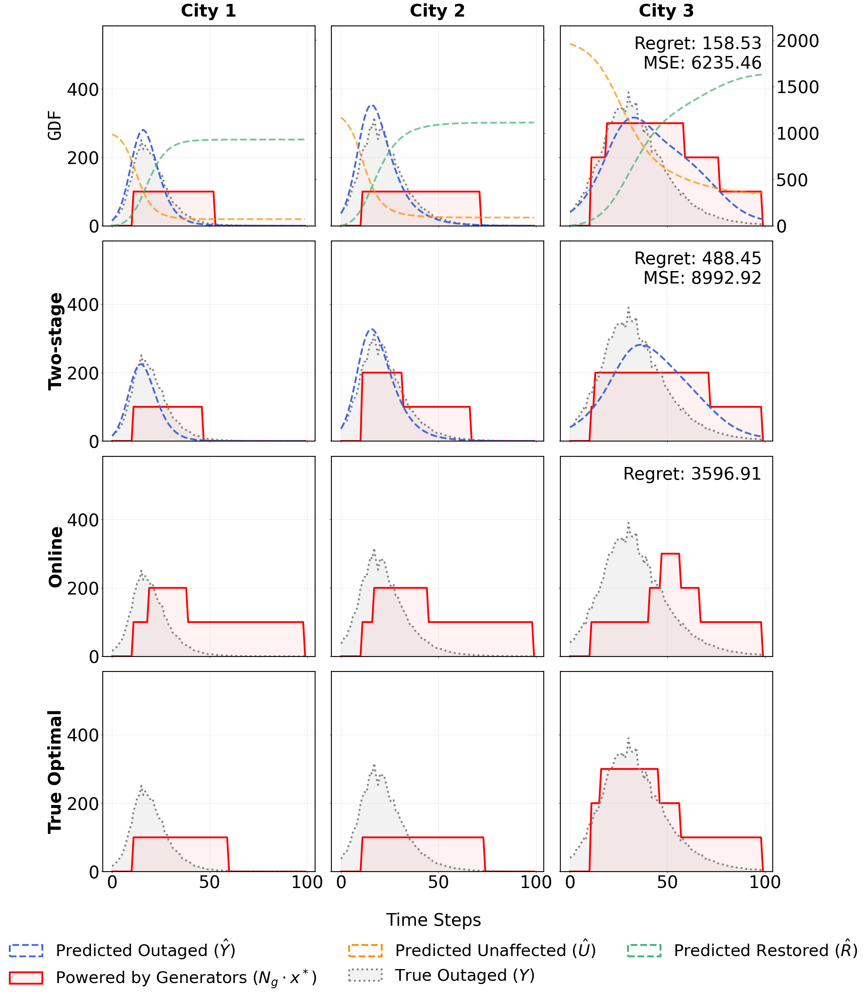

In [158]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"SIR_plot_4rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_four_rows_three_cities_with_cost_mse_SIR(
    Y_true_np,
    Y_pred_np,
    Y_pred_dfl_np,
    S_pred_dfl_np,
    R_pred_dfl_np,
    q_np_dfl,
    q_baseline,
    q_np_opt,
    q_np_pred,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_pred=solution_pred,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt,
    mse_error_dfl= mse_error_dfl,
    mse_error_pred= mse_error_pred
)

In [159]:
def plot_four_rows_three_cities_with_cost_mse_SIR(Y_true_np,
                                                   Y_pred_np,
                                                   Y_dfl_pred_np,
                                                   S_dfl_pred_np,    # DFL predicted S time series, shape (time_steps, num_cities)
                                                   R_dfl_pred_np,    # DFL predicted R time series, shape (time_steps, num_cities)
                                                   S_pred_np,
                                                   R_pred_np,
                                                   q_np_dfl,
                                                   q_baseline,  # for Greedy (Online) Model
                                                   q_true,
                                                   q_pred,
                                                   N_g=100,
                                                   save_path='plot_4rows.pdf',
                                                   tau=1.0,
                                                   transport_cost_per_gen=1.0,
                                                   gamma=1.0,
                                                   solution_dfl=None,       # for GDF Model
                                                   solution_pred = None,
                                                   solution_baseline=None,  # for Online Model
                                                   solution_gt=None,
                                                   mse_error_dfl= None,
                                                   mse_error_pred = None):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to models.
      - Columns correspond to cities.
    
    The rows (from top to bottom) are:
      Row 0: GDF (uses q_np_dfl, Y_dfl_pred_np, S_dfl_pred_np, and R_dfl_pred_np)
      Row 1: Online (Greedy; uses q_baseline)
      Row 2: Groundtruth (uses q_true)
    
    In each subplot:
      - Generator stock (scaled by N_g and forced to have zero at the first and last time steps)
        is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For row 0:
          - The predicted outage (Y_dfl_pred_np) is plotted as a blue dashed line with a light fill.
          - Additionally, the predicted susceptible (S_dfl_pred_np) and recovered (R_dfl_pred_np)
            curves are plotted. For the third city only, these curves appear on a second (twin) y-axis.
      - A light grey grid is overlaid.
    
    In the last column of each row (except Groundtruth), an annotation is added at the upper-right corner displaying the regret,
    computed as the difference between the total cost of the corresponding solution and the ground truth cost.
    
    Parameters:
      - Y_true_np: array, shape (time_steps, num_cities) of true outages.
      - Y_dfl_pred_np: array, shape (time_steps, num_cities) of predicted outages for the DFL (GDF) model.
      - q_np_dfl: array, shape (time_steps, num_cities) (generator stocks for the DFL model).
      - q_baseline: array, shape (time_steps, num_cities) (generator stocks for the Online model).
      - q_true: array, shape (time_steps, num_cities) (generator stocks for Groundtruth).
      - S_dfl_pred_np: array, shape (time_steps, num_cities) of predicted S values.
      - R_dfl_pred_np: array, shape (time_steps, num_cities) of predicted R values.
      - N_g: scaling factor for generator stock.
      - save_path: file path for saving the plot (PDF).
      - tau: cost factor for unmet demand.
      - transport_cost_per_gen: transportation cost factor.
      - gamma: operational cost factor per unit generator operation.
      - solution_dfl: dictionary solution for the GDF Model.
      - solution_baseline: dictionary solution for the Online Model.
      - solution_gt: dictionary solution for the Groundtruth.
      - font: (optional) dict to control font sizes; e.g. {'label':30, 'legend':30, 'title':30}
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba
    # Set default font sizes if not provided.
    font = {'label': 38, 'legend': 36, 'title': 38}
    label_font_size = font['label']
    legend_font_size = font['legend']
    title_font_size = font.get('title', label_font_size)

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]
    time = np.arange(time_steps)

    # Color and line settings.
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Colors for additional DFL curves.
    S_dfl_color = "darkorange"
    R_dfl_color = "mediumseagreen"
    # Decreased alpha for S and R curves.
    sr_fill_alpha = 0.0
    sr_line_alpha = 0.7

    # Model names.
    model_names = [r"$\mathtt{GDF}$", "Two-stage", "Online", "True Optimal"]

    # Compute total cost for each solution using compute_total_cost.
    # (Assuming compute_total_cost returns (total_cost, economic_cost, transportation_cost, operational_cost))
    # cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    # cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    # cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)
    # cost_pred, _, _, _ = compute_total_cost(Y_pred_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)

    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_pred, _, _, _ = compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)

    # Compute regret for each model.
    regret_dfl = cost_dfl - cost_gt
    regret_baseline = cost_baseline - cost_gt
    regret_pred = cost_pred - cost_gt

    # # Prepare annotation text.
    # annotations = {
    #     0: f"Regret: {regret_dfl:.2f}",
    #     1: f"Regret: {regret_pred:.2f}",
    #     2: f"Regret: {regret_baseline:.2f}",
    #     3: ""
    # }

    annotations = {
        0: f"Regret: {regret_dfl:.2f}" + (f"\nMSE: {mse_error_dfl:.2f}" if mse_error_dfl is not None else ""),
        1: f"Regret: {regret_pred:.2f}" + (f"\nMSE: {mse_error_pred:.2f}" if mse_error_pred is not None else ""),
        2: f"Regret: {regret_baseline:.2f}",
        3: ""
    }

    # Create grid.
    fig, axs = plt.subplots(nrows=4, ncols=num_cities,
                            figsize=(8 * num_cities, 6 * 5), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Loop over rows and columns.
    for model in range(4):
        for city in range(num_cities):
            ax = axs[model, city]
            # Select data.
            if model == 0:
                # DFL row.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif model == 1:
                y_pred = Y_pred_np[:, city]
                q_arr = q_pred[:, city].copy()

            elif model == 2:
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero, then scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator stock.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.05)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)


            # For DFL row, plot predicted outage and additional curves.
            if model in (0,1):
                if y_pred is not None:
                    # ax.fill_between(time, y_pred, color=predicted_color, alpha=0.1)
                    ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                S_dfl = S_dfl_pred_np[:, city] if model == 0 else S_pred_np[:, city]
                R_dfl = R_dfl_pred_np[:, city] if model == 0 else R_pred_np[:, city]
                # For third city, use a twin y-axis.
                ax2 = ax.twinx()
                ax2.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, S_dfl, linestyle=predicted_line_style, color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, R_dfl, linestyle=predicted_line_style, color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)
                ax2.tick_params(axis='y', labelsize=label_font_size)
                ax2.grid(False)
                # Set right y-axis limit to 1.1 times the maximum over all DFL row data.
                global_right_max = 1.1 * max(np.max(Y_dfl_pred_np),
                                                np.max(S_dfl_pred_np),
                                                np.max(R_dfl_pred_np))
                # if model == 0:
                ax2.set_ylim(0, global_right_max)

                if city !=2:
                    ax2.tick_params(axis='y', labelright=False)


                    # ax.fill_between(time, S_dfl, color=S_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, S_dfl, linestyle="-", color=S_dfl_color, linewidth=4, alpha=sr_line_alpha)
                    # ax.fill_between(time, R_dfl, color=R_dfl_color, alpha=sr_fill_alpha)
                    # ax.plot(time, R_dfl, linestyle="-", color=R_dfl_color, linewidth=4, alpha=sr_line_alpha)

            # Set title for DFL row.
            if model == 0:
                ax.set_title(f'City {city+1}', fontsize=title_font_size, weight='bold', pad=20)
            # Remove y-axis tick labels for non-first columns.
            if city != 0:
                ax.tick_params(axis='y', labelleft=False)

            # Style axes.
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.tick_params(axis='both', labelsize=label_font_size)
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

            # if model == 1:
            #     ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)



            # Add annotation in the last column.
            if city == num_cities - 1 and annotations[model]:
                ax.text(0.95, 0.95, annotations[model],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
        axs[model, 0].set_ylabel(model_names[model], fontsize=label_font_size, weight='bold')

    # For the DFL row (row 0), set left y-axis limits to 1.1 times the maximum over Y_true and Y_dfl_pred.
    left_ylim_max = 1.5 * max(np.max(Y_true_np), np.max(Y_dfl_pred_np))
    for city in range(num_cities):
         axs[0, city].set_ylim(0, left_ylim_max)
         axs[1, city].set_ylim(0, left_ylim_max)
         axs[2, city].set_ylim(0, left_ylim_max)
         axs[3, city].set_ylim(0, left_ylim_max)


    # Shared x-axis label.
    fig.text(0.5, 0.05, 'Time Steps', ha='center', fontsize=label_font_size)

    # Create legend handles.
    gdf_face = to_rgba(generator_color, alpha=0.05)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    pred_face = to_rgba(predicted_color, alpha=0)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    S_face = to_rgba(S_dfl_color, alpha=sr_fill_alpha)
    S_edge = to_rgba(S_dfl_color, alpha=1.0)
    S_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=S_face, edgecolor=S_edge, lw=4)
    # S_handle.set_linestyle("-")
    S_handle.set_linestyle(predicted_line_style)


    R_face = to_rgba(R_dfl_color, alpha=sr_fill_alpha)
    R_edge = to_rgba(R_dfl_color, alpha=1.0)
    R_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=R_face, edgecolor=R_edge, lw=4)
    # R_handle.set_linestyle("-")
    R_handle.set_linestyle(predicted_line_style)


    # Create two separate legends.
    # legend1 = fig.legend(handles=[gdf_handle, pred_handle, true_handle],
    #                      labels=[r'Power Supplied by Generators', 'Predicted Outaged', 'True Outaged'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
    #                      bbox_to_anchor=(0.5, -0.07))
    # legend2 = fig.legend(handles=[S_handle, R_handle],
    #                      labels=['Predicted Unaffected', 'Predicted Rescored'],
    #                      fontsize=legend_font_size, frameon=False, loc='lower center', ncol=2,
    #                      bbox_to_anchor=(0.5, -0.15))
    all_handles = [pred_handle, gdf_handle, S_handle, true_handle, R_handle]
    all_labels = [r'Predicted Outaged ($\hat{Y}$)', 
                  r'Powered by Generators ($N_g \cdot x^*$)',  
                  r'Predicted Unaffected ($\hat{U}$)', 
                  r'True Outaged ($Y$)', 
                  r'Predicted Restored ($\hat{R}$)']
    # legend = fig.legend(handles=all_handles, labels=all_labels,
    #                     fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
    #                     bbox_to_anchor=(0.5, -0.07))
    
    legend = fig.legend(handles=all_handles, labels=all_labels,
                        fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
                        bbox_to_anchor=(0.5, -0.03))
    # fig.add_artist(legend1)

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


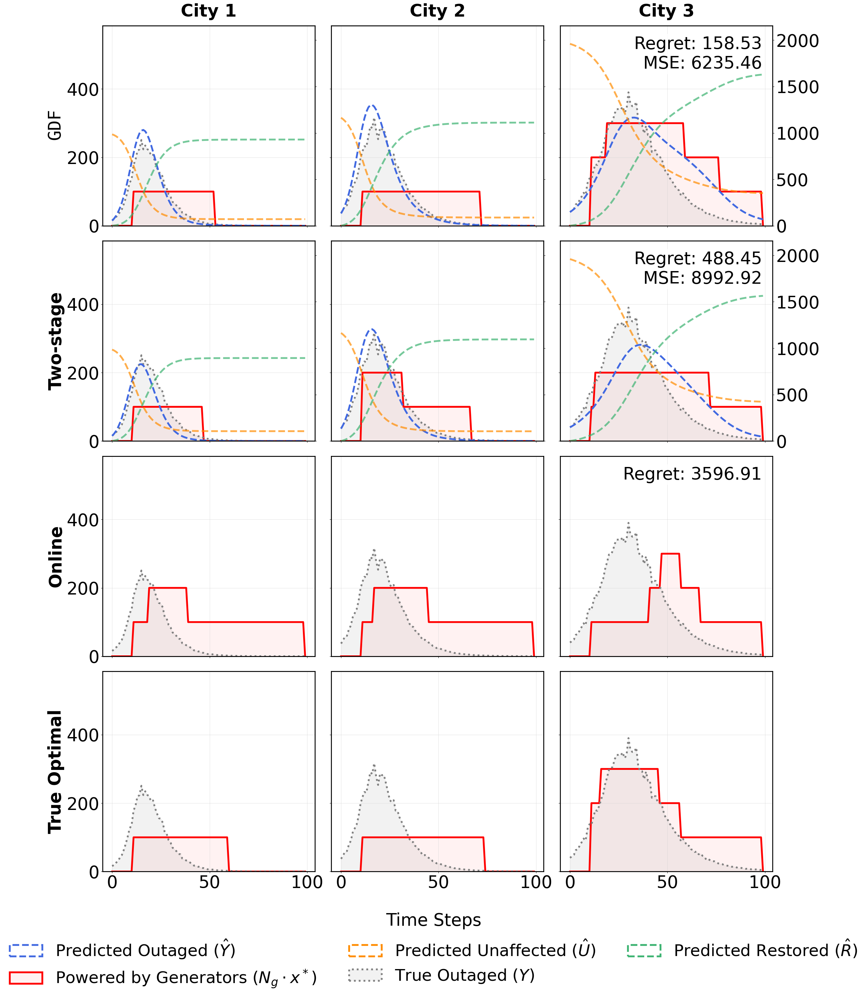

In [160]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"SIR_plot_4rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_four_rows_three_cities_with_cost_mse_SIR(
    Y_true_np,
    Y_pred_np,
    Y_pred_dfl_np,
    S_pred_dfl_np,
    R_pred_dfl_np,
    S_pred_np,
    R_pred_np,
    q_np_dfl,
    q_baseline,
    q_np_opt,
    q_np_pred,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_pred=solution_pred,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt,
    mse_error_dfl= mse_error_dfl,
    mse_error_pred= mse_error_pred
)

In [161]:
dt

10

In [162]:
save_path

'plots/SIR_plot_4rows_seed0_tc100_gamma2.0_G5_tau1_Ng100.0_lambda0.1.pdf'

In [163]:
def plot_four_methods_three_cities_with_cost_mse_SIR(Y_true_np,
                                                     Y_pred_np,
                                                     Y_dfl_pred_np,
                                                     S_dfl_pred_np,    # DFL predicted S time series, shape (time_steps, num_cities)
                                                     R_dfl_pred_np,    # DFL predicted R time series, shape (time_steps, num_cities)
                                                     S_pred_np,
                                                     R_pred_np,
                                                     q_np_dfl,
                                                     q_baseline,  # for Greedy (Online) Model
                                                     q_true,
                                                     q_pred,
                                                     N_g=100,
                                                     save_path='plot_4cols.pdf',
                                                     tau=1.0,
                                                     transport_cost_per_gen=1.0,
                                                     gamma=1.0,
                                                     solution_dfl=None,       # for GDF Model
                                                     solution_pred=None,
                                                     solution_baseline=None,  # for Online Model
                                                     solution_gt=None,
                                                     mse_error_dfl=None,
                                                     mse_error_pred=None):
    """
    Creates a grid of subplots arranged as:
      - Rows correspond to cities.
      - Columns correspond to methods.
      
    The columns (from left to right) are:
      Column 0: GDF (uses q_np_dfl, Y_dfl_pred_np, S_dfl_pred_np, and R_dfl_pred_np)
      Column 1: Two-stage (uses q_pred, Y_pred_np, S_pred_np, and R_pred_np)
      Column 2: Online (Greedy; uses q_baseline)
      Column 3: True Optimal (uses q_true)
      
    In each subplot:
      - Generator stock (scaled by N_g, with first and last time steps forced to zero)
        is plotted in red.
      - The true outage (Y_true_np) is plotted as a grey dotted line with a light fill.
      - For methods 0 and 1, the predicted outage is plotted as a blue dashed line and additional curves for
        susceptible and recovered are plotted on a twin y-axis (whose tick labels are hidden).
      - For True Optimal (column 3) a twin y-axis is created (even if no extra curves are plotted) and its tick labels remain visible.
      - The Online method (column 2) does not use a twin y-axis.
      
    Additionally, each subplot gets its regret (and MSE, if available) annotation in the upper-right corner.
    The column titles display only the method names, and the leftmost column subplots are labeled with the corresponding city number.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from matplotlib.colors import to_rgba

    # Set default font sizes.
    font = {'label': 38, 'legend': 36, 'title': 38}
    label_font_size = font['label']
    legend_font_size = font['legend']
    title_font_size = font.get('title', label_font_size)

    # Determine the number of time steps and cities.
    time_steps = Y_true_np.shape[0]
    num_cities = Y_true_np.shape[1]  # expected to be 3
    time = np.arange(time_steps)

    # Color and line settings.
    box_color = 'black'
    predicted_color = 'royalblue'
    true_color = 'grey'
    generator_color = 'red'
    predicted_line_style = '--'
    true_line_style = ':'

    # Colors for additional curves.
    S_dfl_color = "darkorange"
    R_dfl_color = "mediumseagreen"
    sr_fill_alpha = 0.0
    sr_line_alpha = 0.7

    # Compute costs and regrets.
    cost_dfl, _, _, _ = compute_total_cost(Y_true_np, solution_dfl, tau, N_g, transport_cost_per_gen, gamma)
    cost_pred, _, _, _ = compute_total_cost(Y_true_np, solution_pred, tau, N_g, transport_cost_per_gen, gamma)
    cost_baseline, _, _, _ = compute_total_cost(Y_true_np, solution_baseline, tau, N_g, transport_cost_per_gen, gamma)
    cost_gt, _, _, _ = compute_total_cost(Y_true_np, solution_gt, tau, N_g, transport_cost_per_gen, gamma)
    regret_dfl = cost_dfl - cost_gt
    regret_pred = cost_pred - cost_gt
    regret_baseline = cost_baseline - cost_gt

    # Annotations for each method.
    annotations = {
        0: f"Regret: {regret_dfl:.2f}" + (f"\nMSE: {mse_error_dfl:.2f}" if mse_error_dfl is not None else ""),
        1: f"Regret: {regret_pred:.2f}" + (f"\nMSE: {mse_error_pred:.2f}" if mse_error_pred is not None else ""),
        2: f"Regret: {regret_baseline:.2f}",
        3: ""
    }
    
    # Method (model) names.
    model_names = [r"$\texttt{GDF}$", "Two-stage", "Online", "True Optimal"]

    # Create grid: rows = cities, columns = methods.
    fig, axs = plt.subplots(nrows=num_cities, ncols=4,
                            figsize=(8 * 4, 6 * num_cities), sharex=True, sharey=False)
    plt.subplots_adjust(wspace=0.25, hspace=0.35)

    # Loop over cities (rows) and methods (columns).
    for city in range(num_cities):
        for method in range(4):
            ax = axs[city, method]
            # Select data based on method.
            if method == 0:
                # GDF method.
                y_pred = Y_dfl_pred_np[:, city]
                q_arr = q_np_dfl[:, city].copy()
            elif method == 1:
                # Two-stage method.
                y_pred = Y_pred_np[:, city]
                q_arr = q_pred[:, city].copy()
            elif method == 2:
                # Online (Greedy) method.
                y_pred = None
                q_arr = q_baseline[:, city].copy()
            else:
                # True Optimal.
                y_pred = None
                q_arr = q_true[:, city].copy()

            # Force first and last generator values to zero, then scale.
            q_arr[0] = 0
            q_arr[-1] = 0
            q_scaled = N_g * q_arr

            # Plot generator stock.
            ax.fill_between(time, q_scaled, color=generator_color, alpha=0.05)
            ax.plot(time, q_scaled, color=generator_color, linewidth=4)

            # Plot true outage.
            ax.fill_between(time, Y_true_np[:, city], color=true_color, alpha=0.1)
            ax.plot(time, Y_true_np[:, city], linestyle=true_line_style, color=true_color, linewidth=4)

            # For methods that plot predicted curves (GDF and Two-stage), create twin axis.
            if method in (0, 1):
                if y_pred is not None:
                    ax.plot(time, y_pred, linestyle=predicted_line_style, color=predicted_color, linewidth=4)
                # Choose additional curves.
                if method == 0:
                    S_curve = S_dfl_pred_np[:, city]
                    R_curve = R_dfl_pred_np[:, city]
                else:
                    S_curve = S_pred_np[:, city]
                    R_curve = R_pred_np[:, city]
                ax2 = ax.twinx()
                ax2.fill_between(time, S_curve, color=S_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, S_curve, linestyle=predicted_line_style, color=S_dfl_color,
                         linewidth=4, alpha=sr_line_alpha)
                ax2.fill_between(time, R_curve, color=R_dfl_color, alpha=sr_fill_alpha)
                ax2.plot(time, R_curve, linestyle=predicted_line_style, color=R_dfl_color,
                         linewidth=4, alpha=sr_line_alpha)
                # For these methods (columns 0 and 1), hide twin y-axis tick labels.
                ax2.tick_params(axis='y', labelright=False)
                ax2.grid(False)
                # Set the twin y-axis limit based on overall DFL data.
                global_right_max = 1.1 * max(np.max(Y_dfl_pred_np),
                                             np.max(S_dfl_pred_np),
                                             np.max(R_dfl_pred_np))
                ax2.set_ylim(0, global_right_max)
            # For True Optimal (method == 3), create an (empty) twin axis with visible tick labels.
            elif method == 3:
                ax2 = ax.twinx()
                # (No additional curves are plotted here.)
                ax2.tick_params(axis='y', labelsize=label_font_size)
                ax2.grid(False)
                # Set the twin axis y-limit to match the main axis.
                ax2.set_ylim(ax.get_ylim())
            # For Online (method == 2), no twin axis is created.

            # Add the regret/MSE annotation in the upper right of every subplot.
            if annotations[method]:
                ax.text(0.95, 0.95, annotations[method],
                        transform=ax.transAxes, ha='right', va='top',
                        fontsize=label_font_size,
                        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

            # Style the main axis.
            ax.tick_params(axis='both', labelsize=label_font_size)
            for spine in ax.spines.values():
                spine.set_color(box_color)
                spine.set_linewidth(2)
            ax.grid(True, linestyle='-', linewidth=0.5, color='lightgrey')

    # Set row labels for cities (leftmost column).
    for city in range(num_cities):
        axs[city, 0].set_ylabel(f"City {city+1}", fontsize=label_font_size, weight='bold')

    # Set column titles for methods in the top row (only method names).
    for method in range(4):
        axs[0, method].set_title(model_names[method],
                                 fontsize=title_font_size, weight='bold', pad=20)

    # Set common y-axis limits for all subplots.
    left_ylim_max = 1.5 * max(np.max(Y_true_np), np.max(Y_dfl_pred_np))
    for city in range(num_cities):
        for method in range(4):
            axs[city, method].set_ylim(0, left_ylim_max)

    # (The shared x-axis label "Time Steps" has been removed.)

    # Create legend handles.
    gdf_face = to_rgba(generator_color, alpha=0.05)
    gdf_edge = to_rgba(generator_color, alpha=1.0)
    gdf_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=gdf_face, edgecolor=gdf_edge, lw=4)

    pred_face = to_rgba(predicted_color, alpha=0)
    pred_edge = to_rgba(predicted_color, alpha=1.0)
    pred_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=pred_face, edgecolor=pred_edge, lw=4)
    pred_handle.set_linestyle(predicted_line_style)

    true_face = to_rgba(true_color, alpha=0.1)
    true_edge = to_rgba(true_color, alpha=1.0)
    true_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=true_face, edgecolor=true_edge, lw=4)
    true_handle.set_linestyle(true_line_style)

    S_face = to_rgba(S_dfl_color, alpha=sr_fill_alpha)
    S_edge = to_rgba(S_dfl_color, alpha=1.0)
    S_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=S_face, edgecolor=S_edge, lw=4)
    S_handle.set_linestyle(predicted_line_style)

    R_face = to_rgba(R_dfl_color, alpha=sr_fill_alpha)
    R_edge = to_rgba(R_dfl_color, alpha=1.0)
    R_handle = mpatches.Rectangle((0, 0), 1, 1, facecolor=R_face, edgecolor=R_edge, lw=4)
    R_handle.set_linestyle(predicted_line_style)

    all_handles = [pred_handle, gdf_handle, S_handle, true_handle, R_handle]
    all_labels = [r'Predicted Outaged ($\hat{Y}$)', 
                  r'Powered by Generators ($N_g \cdot x^*$)',  
                  r'Predicted Unaffected ($\hat{U}$)', 
                  r'True Outaged ($Y$)', 
                  r'Predicted Restored ($\hat{R}$)']
    
    legend = fig.legend(handles=all_handles, labels=all_labels,
                        fontsize=legend_font_size, frameon=False, loc='lower center', ncol=3,
                        bbox_to_anchor=(0.5, -0.03))

    plt.tight_layout(rect=[0, 0.08, 1, 1])
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl

# 1. Enable LaTeX rendering
mpl.rcParams['text.usetex'] = True

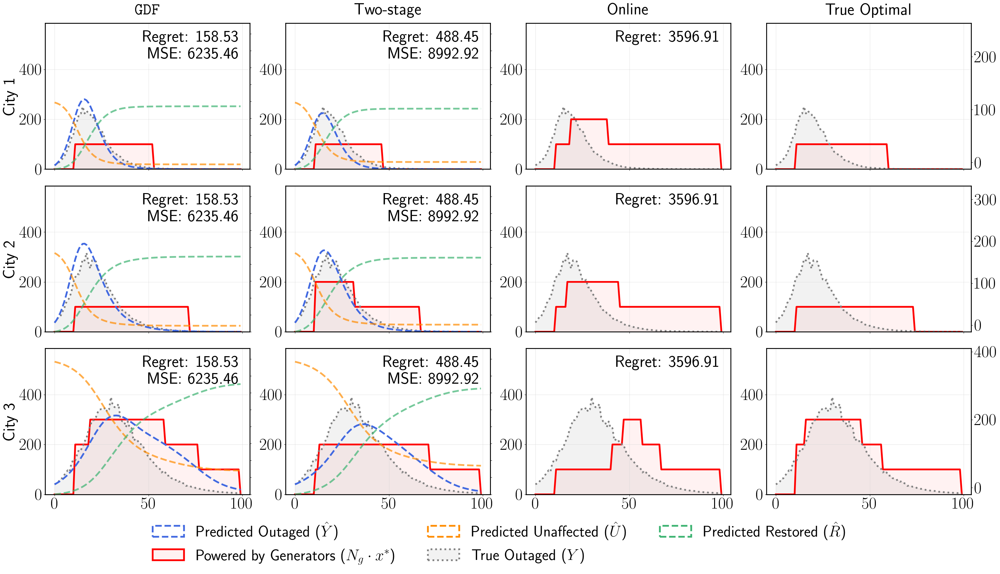

In [168]:
# Construct a save_path that encodes the desired parameters.
save_path = PLOT_PATH + f"SIR_plot_3rows_seed{seed}_tc{transport_cost_per_gen}_gamma{gamma}_G{G_initial}_tau{tau}_Ng{N_g}_lambda{lambda_mse}.pdf"

plot_four_methods_three_cities_with_cost_mse_SIR(
    Y_true_np,
    Y_pred_np,
    Y_pred_dfl_np,
    S_pred_dfl_np,
    R_pred_dfl_np,
    S_pred_np,
    R_pred_np,
    q_np_dfl,
    q_baseline,
    q_np_opt,
    q_np_pred,
    N_g=N_g,
    save_path=save_path,
    tau=tau,
    transport_cost_per_gen=transport_cost_per_gen,
    gamma=gamma,
    solution_dfl=solution_dfl,
    solution_pred=solution_pred,
    solution_baseline=solution_baseline,
    solution_gt=solution_gt,
    mse_error_dfl= mse_error_dfl,
    mse_error_pred= mse_error_pred
)

In [ ]:
save_path


'SIR_plot_4rows_seed0_tc400_gamma2.0_G5_tau1_Ng100.0_lambda0.pdf'